# HousePriceData : Building Price prediction ML model
## Term 2

### Notebook by Yogesh Chandra Ramakrishna
#### Supported by [Levi Nigam](https://www.insaid.co/)

#### Source of the Data : INSAID

<a id=Index><a/>

## Table of Contents

1. [Introduction](#Introduction)<br/>
2. [Required libraries](#Required-libraries)<br/>
3. [Problem Statement](#section3)<br/>
4. [Data Loading and Description](#section4)<br/>
5. [Data Profiling](#section5)<br/>
    - 5.1 [Understanding the Dataset](#section501)<br/>
    - 5.2 [Pre Profiling](#section502)<br/>
    - 5.3 [Processing](#section503)<br/>
     - 5.3.1 [Correlation among each Data variables](#section5031)<br/>
     - 5.3.2 [Data Imputation](#section5032)<br/>
     - 5.3.3 [Log Transform the skewed features](#section5033)<br/>
     - 5.3.4 [Converting Categorical Features](#section5034)<br/>
     - 5.3.5 [Choosing the Features for Modeling and handeling Multicollinearity](#section5035)<br/>
    - 5.4 [Post Profiling](#section504)<br/>
6. [Questions](#section6)<br/>
    - 6.1 [Grouping all the Prices with respect to Overall Quality](#section601)<br/>
    - 6.2 [Does Height of the basement and Exterior material quality have negetive impact on Sale Price ?](#section602)<br/>
    - 6.3 [Negetive correlated parameters with respect to Sale Price](#section603)<br/>
    - 6.4 [Positive correlated parameters with respect to Sale Price](#section604)<br/>
    - 6.5 [Analyse Sale Price with other variables, other than selected variables](#section605)<br/>
7. [Conclusion for EDA](#section7)<br/>
8. [Machine Learning Data Model](#section8)<br/>
    - 8.1 [Linear Regression](#section801)<br/>
     - 8.1.1 [Introduction to Linear Regression](#section8011)<br/>
     - 8.1.2 [Assumptions of Linear Regression](#section8012)<br/>
     - 8.1.3 [Modeling with 'Set A' Data](#section8013)<br/>
     - 8.1.4 [Modeling with 'Set B' Data](#section8014)<br/>
     - 8.1.5 [Modeling with 'Set C' Data : Feature Selection](#section8015)<br/>
     - 8.1.6 [Hyper-parameter optimizers - GridSearchCV](#section8016)<br/>
    - 8.2 [Decision Tree Regressor](#section802)<br/>
     - 8.2.1 [Introduction of Decision Tree](#section8021)<br/>
     - 8.2.2 [Types of Decision Trees](#section8022)<br/>
     - 8.2.3 [Advantages of using Decision Tree](#section8023)<br/>
     - 8.2.4 [Shortcomings of Decision Trees](#section8024)<br/>
     - 8.2.5 [Preparing X and y using pandas](#section8025)<br/>
     - 8.2.6 [Splitting X and y into training and test datasets](#section8026)<br/>
     - 8.2.7 [Decision Tree in scikit-learn](#section8027)<br/>
     - 8.2.8 [Decision Tree with Gridsearch](#section8028)<br/>
    - 8.3 [Random Forest Regressor](#section803)<br/>
     - 8.3.1 [Introduction to Random Forest](#section8031)<br/>
     - 8.3.2 [Concept behind random forest](#section8032)<br/>
     - 8.3.3 [Advantages and Disadvantages](#section8033)<br/>
     - 8.3.4 [Preparing X and y using pandas](#section8034)<br/>
     - 8.3.5 [Splitting X and y into training and test datasets](#section8035)<br/>
     - 8.3.6 [Random Forest in scikit-learn](#section8036)<br/>
     - 8.3.7 [Random forest with RandomizedsearchCV](#section8037)<br/>
9. [Model Selection](#section9)<br/>
10. [Conclusion and Reference](#section10)<br/>

<a id=Introduction><a/>

## 1. Introduction

The notebooks explores the basic use of __Numpy__,__Pandas__, __Seaborn__ and will cover the basic commands of __Exploratory Data Analysis(EDA)__ which includes __cleaning__, __munging__, __combining__, __reshaping__, __slicing__, __dicing__, and __transforming data__ for analysis purpose.

And also we will be using __scikit learn__ and various __Machine Learning__ models, to build a predictive model, I will be doing some Statistical analysys to make this Model as accurate as possible.


* __Exploratory Data Analysis__ <br/>
Understand the data by EDA and derive simple models with Pandas as baseline.
EDA ia a critical and first step in analyzing the data and we do this for below reasons :
    - Finding patterns in Data
    - Determining relationships in Data
    - Checking of assumptions
    - Preliminary selection of appropriate models
    - Detection of mistakes
    
    
* __Statistical Overview__ <br/>
Statistical tests are the scientific way to prove the validation of theories. In any case, when we look at the data, we seem to have an intuitive understanding of where data is leading us. However, when we do statistical tests, we get a scientific or mathematical perspective of how significant these results are. Let's apply some of the tests and see how we are doing with our predictions.


* __Machine Learning Modeling__ <br/>
The process of training an ML model involves providing an ML algorithm (that is, the learning algorithm) with training data to learn from. The term ML model refers to the model artifact that is created by the training process.

#### [Back to Index](#Index)

<a id=Required-libraries><a/>

## 2. Required libraries

If you don't have Python on your computer, you can use the [Anaconda Python distribution](http://continuum.io/downloads) to install most of the Python packages you need. Anaconda provides a simple double-click installer for your convenience.

This notebook uses several Python packages that come standard with the Anaconda Python distribution. The primary libraries that we'll be using are:

* **NumPy**: Provides a fast numerical array structure and helper functions.
* **pandas**: Provides a DataFrame structure to store data in memory and work with it easily and efficiently.
* **matplotlib**: Basic plotting library in Python; most other Python plotting libraries are built on top of it.
* **Seaborn**: Advanced statistical plotting library.
* **cufflinks**: interactive graphs
* **Scikit-learn**: is a machine learning library for the Python programming language.

__Note: Will import Scikit-learn libraries in the modeling section itself__

In [1]:
import numpy as np                                                 # Implemennts milti-dimensional array and matrices
import pandas as pd                                                # For data manipulation and analysis
import pandas_profiling
import matplotlib.pyplot as plt                                    # Plotting library for Python programming language and it's numerical mathematics extension NumPy
import seaborn as sns                                              # Provides a high level interface for drawing attractive and informative statistical graphics
%matplotlib inline
sns.set()

from subprocess import check_output

import cufflinks as cf
cf.go_offline()

from IPython.core.display import Image, display

#### [Back to Index](#Index)

<a id=section3><a/>

## 3. Problem Statement

I am trying to build a ML Prediction model, where my clients who are the top Real Estates company can use this model in their Website as a service. This website is visited by millions of customers every year. This Model will help the end users to estimate or to know the present market prices of the houses based on few inputs they provide.
Let us see how we can build a Model using  prehistoric data provided by our client.

#### [Back to Index](#Index)

<a id=section4><a/>

## 4. Data Loading and Description

- data set of 1,460 observations of the House prices. 
- The dataset comprises of __1460 observations of 81 columns__. Below is a table showing names of all the columns and their       description.


| Column Name      | Description                                                                                               |
| :-------------   | :-------------                                                                                            | 
|__SalePrice:__    | The property's sale price in dollars. This is the target variable that you're trying to predict.          
|__MSSubClass:__   | The building class                                                                                        
|__MSZoning__:     | The general zoning classification                                                                         
|__LotFrontage__:  | Linear feet of street connected to property
|__LotArea__:      | Lot size in square feet
|__Street__:       | Type of road access
|__Alley__:        | Type of alley access
|__LotShape__:     | General shape of property
|__LandContour__:  | Flatness of the property
|__Utilities__:    | Type of utilities available
|__LotConfig__:    | Lot configuration
|__LandSlope__:    | Slope of property
|__Neighborhood__: | Physical locations within Ames city limits
|__Condition1__:   | Proximity to main road or railroad
|__Condition2__:   | Proximity to main road or railroad (if a second is present)
|__BldgType:__     | Type of dwelling
|__HouseStyle:__   | Style of dwelling
|__OverallQual:__  | Overall material and finish quality
|__OverallCond:__  | Overall condition rating
|__YearBuilt:__    | Original construction date
|__YearRemodAdd:__ | Remodel date
|__RoofStyle:__    | Type of roof
|__RoofMatl:__     | Roof material
|__Exterior1st:__  | Exterior covering on house
|__Exterior2nd:__  | Exterior covering on house (if more than one material)
|__MasVnrType:__   | Masonry veneer type
|__MasVnrArea:__   | Masonry veneer area in square feet
|__ExterQual:__    | Exterior material quality
|__ExterCond:__    | Present condition of the material on the exterior
|__Foundation:__   | Type of foundation
|__BsmtQual:__     | Height of the basement
|__BsmtCond:__     | General condition of the basement
|__BsmtExposure:__ | Walkout or garden level basement walls
|__BsmtFinType1:__ | Quality of basement finished area
|__BsmtFinSF1:__   | Type 1 finished square feet
|__BsmtFinType2:__ | Quality of second finished area (if present)
|__BsmtFinSF2:__   | Type 2 finished square feet
|__BsmtUnfSF:__    | Unfinished square feet of basement area
|__TotalBsmtSF:__  | Total square feet of basement area
|__Heating:__      | Type of heating
|__HeatingQC:__    | Heating quality and condition
|__CentralAir:__   | Central air conditioning
|__Electrical:__   | Electrical system
|__1stFlrSF:__     | First Floor square feet
|__2ndFlrSF:__     | Second floor square feet
|__LowQualFinSF:__ | Low quality finished square feet (all floors)
|__GrLivArea:__    | Above grade (ground) living area square feet
|__BsmtFullBath:__ | Basement full bathrooms
|__BsmtHalfBath:__ | Basement half bathrooms
|__FullBath:__     | Full bathrooms above grade
|__HalfBath:__     | Half baths above grade
|__Bedroom:__      | Number of bedrooms above basement level
|__Kitchen:__      | Number of kitchens
|__KitchenQual:__  | Kitchen quality
|__TotRmsAbvGrd:__ | Total rooms above grade (does not include bathrooms)
|__Functional:__   | Home functionality rating
|__Fireplaces:__   | Number of fireplaces
|__FireplaceQu:__  | Fireplace quality
|__GarageType:__   | Garage location
|__GarageYrBlt:__  | Year garage was built
|__GarageFinish:__ | Interior finish of the garage
|__GarageCars:__   | Size of garage in car capacity
|__GarageArea:__   | Size of garage in square feet
|__GarageQual:__   | Garage quality
|__GarageCond:__   | Garage condition
|__PavedDrive:__   | Paved driveway
|__WoodDeckSF:__   | Wood deck area in square feet
|__OpenPorchSF:__  | Open porch area in square feet
|__EnclosedPorch:__| Enclosed porch area in square feet
|__3SsnPorch:__    | Three season porch area in square feet
|__ScreenPorch:__  | Screen porch area in square feet
|__PoolArea:__     | Pool area in square feet
|__PoolQC:__       | Pool quality
|__Fence:__        | Fence quality
|__MiscFeature:__  | Miscellaneous feature not covered in other categories
|__MiscVal:__      | $Value of miscellaneous feature
|__MoSold:__       | Month Sold
|__YrSold:__       | Year Sold
|__SaleType:__     | Type of sale
|__SaleCondition:__| Condition of sale

In [2]:
house = pd.read_csv('../RawData/house_data.csv')

In [3]:
houseone = pd.read_csv('../RawData/house_data.csv')

#### [Back to Index](#Index)

<a id=section5><a/>

## 5. Data Profiling

- In the upcoming sections we will first __understand our dataset__ using various pandas functionalities.
- Then with the help of __pandas profiling__ we will find which columns of our dataset need preprocessing.
- In __preprocessing__ we will deal with erronous and missing values of columns. 
- Again we will do __pandas profiling__ to see how preprocessing have transformed our dataset.

<a id=section501><a/>

### 5.1 Understanding the Dataset

In [4]:
house.shape

(1460, 81)

In [5]:
house.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [6]:
house.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [7]:
house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

In [8]:
house.get_dtype_counts()

float64     3
int64      35
object     43
dtype: int64

__Observation:__
- We can see that we have 38 columns with continues data and 43 columns of Categorical data.


In [9]:
house.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


__Descriptive statistics using Pandas__

In [10]:
house.describe(include=np.object).transpose()

,count,unique,top,freq
MSZoning,1460,5,RL,1151
Street,1460,2,Pave,1454
Alley,91,2,Grvl,50
LotShape,1460,4,Reg,925
LandContour,1460,4,Lvl,1311
Utilities,1460,2,AllPub,1459
LotConfig,1460,5,Inside,1052
LandSlope,1460,3,Gtl,1382
Neighborhood,1460,25,NAmes,225
Condition1,1460,9,Norm,1260


In [11]:
house.describe(include=np.number).transpose()

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


#### [Back to Index](#Index)

<a id=section502><a/>

### 5.2 Pre Profiling

- By pandas profiling, an __interactive HTML report__ gets generated which contains all the information about the columns of the dataset, like the __counts and type__ of each _column_. Detailed information about each column, __coorelation between different columns__ and a sample of dataset.<br/>
- It gives us __visual interpretation__ of each column in the data.
- _Spread of the data_ can be better understood by the distribution plot. 
- _Grannular level_ analysis of each column.

In [12]:
profile = pandas_profiling.ProfileReport(house)
profile.to_file(outputfile="HousesData_Pre_Profiling.html")

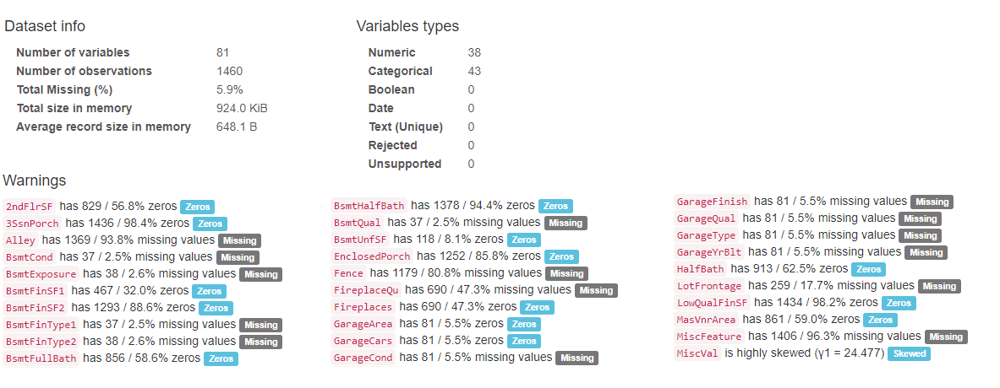

In [13]:
from IPython.core.display import Image, display
display(Image(filename = "../Images/Profiling_Summary.png", width=980, unconfined=True))

__Observation__

- from Preprofiling we can get a clear picture of the data, refer __"HousesData_Pre_Profiling.html"__ for more clarity.
- from the above summary image we can see that there are lot of missing datas and lot of Zeros which has to be taken care.
- we will go one by one and see what can be done with the missing data and Zeros in our data in next section.

#### [Back to Index](#Index)

<a id=section503><a/>

### 5.3 Processing

- Lets have some clear count on how many data’s are missing in __Numerical columns__ and __Categorical columns__ separately

In [14]:
house.columns[house.dtypes!=object]

Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [15]:
mynonObjlist = []
mynonObjlist = house.columns[house.dtypes!=object]

for each in mynonObjlist:
    if house[each].dtypes == np.object:
        print('Its an Object')
    elif house[each].isnull().sum() != 0:
            print("{} ------ : {}".format(each, house[each].isnull().sum()))

LotFrontage ------ : 259
MasVnrArea ------ : 8
GarageYrBlt ------ : 81


__Observation__

- We can see that, three columns out of 38 columns (int and float datatype) are having Null values.
- __LotFrontage, MasVnrArea and GarageYrBlt__ are the columns with null values but __LotFrontage__ more null values compared to   other columns.

In [16]:
house.columns[house.dtypes==object]

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [17]:
myObjlist = []
myObjlist = house.columns[house.dtypes==object]

for each in myObjlist:
    if house[each].dtypes == np.object:
        if house[each].isnull().sum() != 0:
            print("{} ------ : {}".format(each, house[each].isnull().sum()))
    else:
        print('Not and Obj')

Alley ------ : 1369
MasVnrType ------ : 8
BsmtQual ------ : 37
BsmtCond ------ : 37
BsmtExposure ------ : 38
BsmtFinType1 ------ : 37
BsmtFinType2 ------ : 38
Electrical ------ : 1
FireplaceQu ------ : 690
GarageType ------ : 81
GarageFinish ------ : 81
GarageQual ------ : 81
GarageCond ------ : 81
PoolQC ------ : 1453
Fence ------ : 1179
MiscFeature ------ : 1406


__Observation__

- We can see that, 16 columns out of 43 columns (Object datatype) are having Null values.
- __Alley, MasVnrType, BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2, Electrical, FireplaceQu, GarageType, __ 
  __GarageFinish, GarageQual, GarageCond, PoolQC, Fence, MiscFeature__ are the columns with null values but __Alley,__           
  __FireplaceQu, PoolQC, Fence, MiscFeature__ more null values compared to other columns.

<Figure size 2000x2000 with 0 Axes>

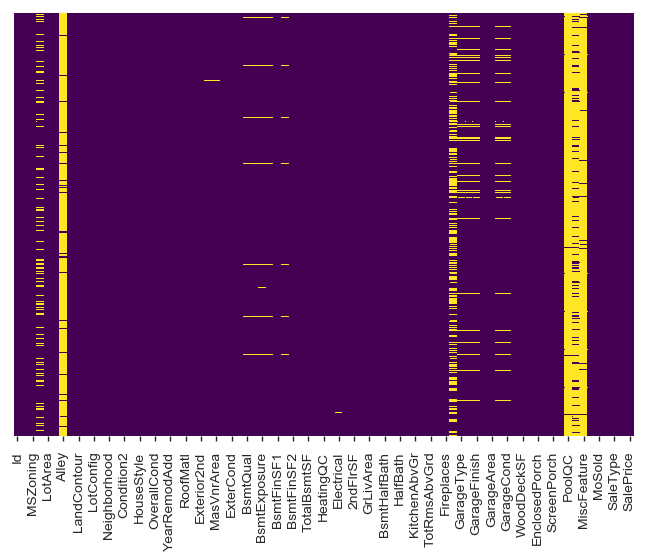

<Figure size 2000x2000 with 0 Axes>

In [18]:
## Missig Data heatmap

sns.heatmap(house.isnull(),yticklabels=False,cbar=False,cmap='viridis')
sns.set(font_scale=1.30)
plt.figure(figsize=(20,20))

#### [Back to Index](#Index)

<a id=section5031><a/>

### 5.3.1 Correlation among each Data variables

In [19]:
corr=house.corr()["SalePrice"]
corr[np.argsort(corr, axis=0)[::-1]]

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
Id              -0.021917
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
Name: SalePr

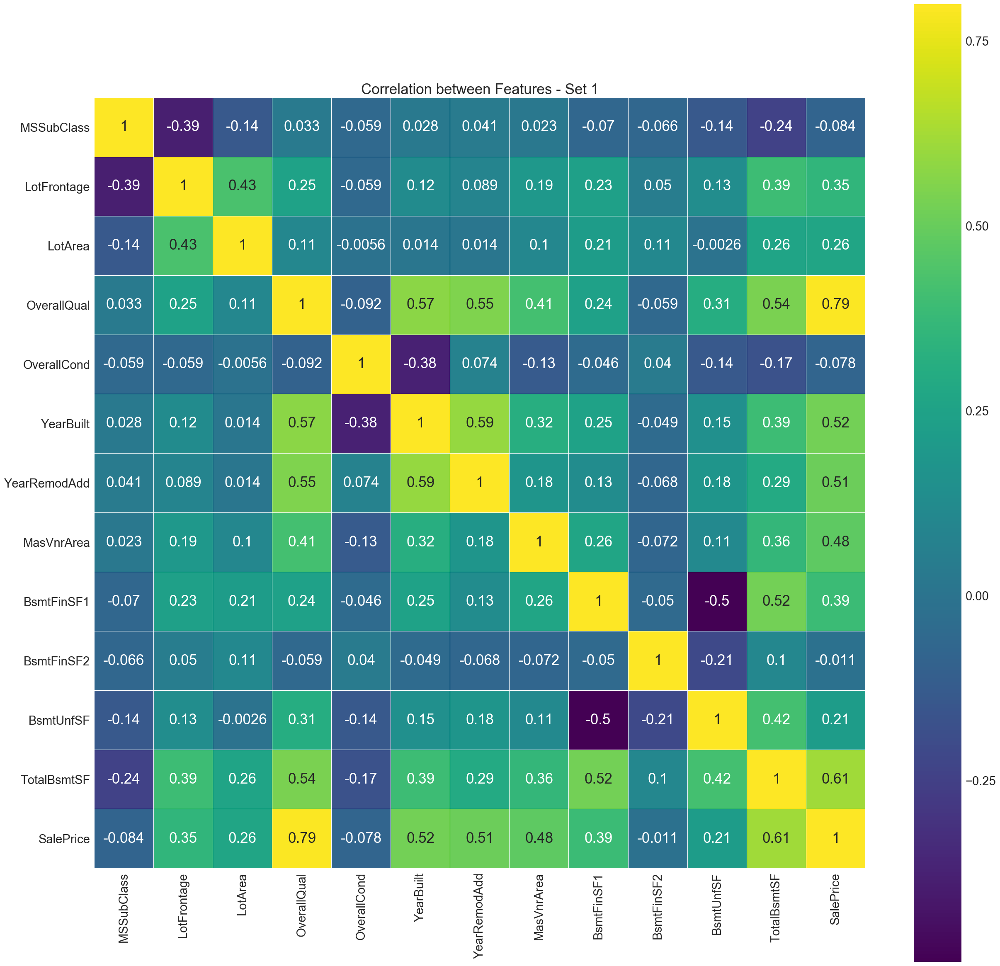

In [20]:
corrMatrix=house[['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 
                  'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'SalePrice']].corr()

sns.set(font_scale=2.10)
plt.figure(figsize=(30, 30))

sns.heatmap(corrMatrix, vmax=.8, linewidths=0.01,
            square=True,annot=True,cmap='viridis',linecolor="white")
plt.title('Correlation between Features - Set 1');

#### Observation

- With respect to Sale Price there are many Correlation, let look at the Variable with correlation more than 0.5.
- From the above plot we can see __'TotalBsmtSF', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', OverallQual__ are having positive     correlation, __MasVnrArea__ have 0.48 correlation but let us consider as of now and see what we can do with it later.
- There are Negetive Correlation also but since there very close to Zero lets not consider them.

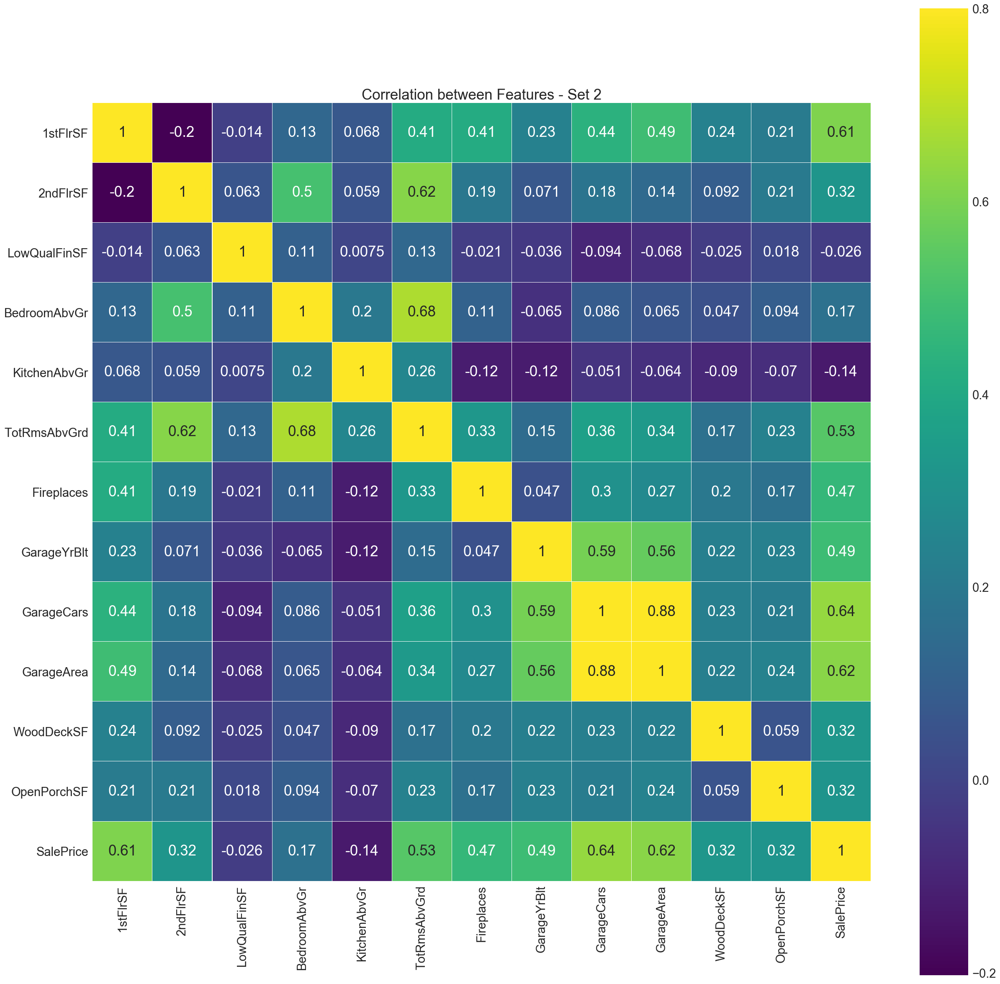

In [21]:
corrMatrix=house[['1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 
                  'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'SalePrice']].corr()

sns.set(font_scale=2.10)
plt.figure(figsize=(30, 30))

sns.heatmap(corrMatrix, vmax=.8, linewidths=0.01,
            square=True,annot=True,cmap='viridis',linecolor="white")
plt.title('Correlation between Features - Set 2');

#### Observation

- With respect to Sale Price there are many Correlation, let look at the Variable with correlation more than 0.5 and closer.
- From the above plot we can see __'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', '1stFlrSF'__ are       having positive correlation.
- __'KitchenAbvGr'__ has some Negetive Correlation.

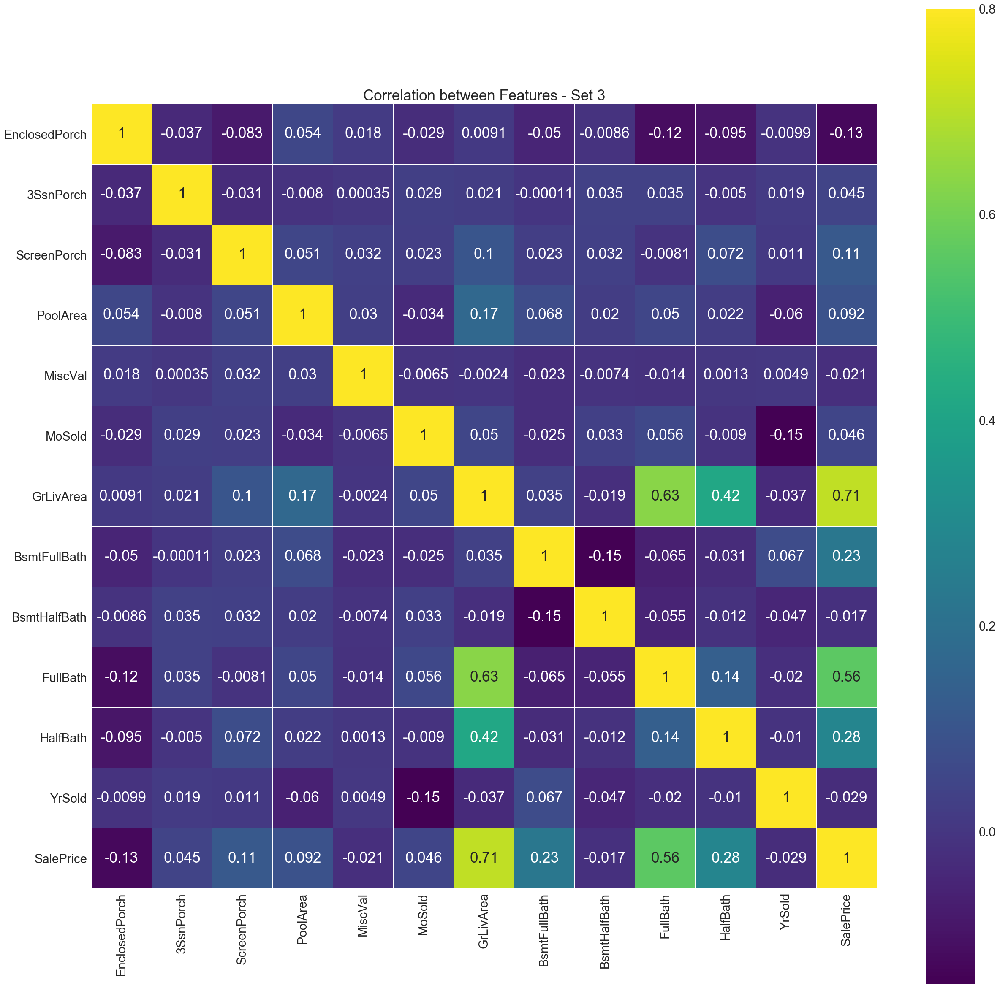

In [22]:
corrMatrix=house[['EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'GrLivArea', 'BsmtFullBath', 
                  'BsmtHalfBath', 'FullBath', 'HalfBath', 'YrSold' , 'SalePrice']].corr()

sns.set(font_scale=2.10)
plt.figure(figsize=(30, 30))

sns.heatmap(corrMatrix, vmax=.8, linewidths=0.01,
            square=True,annot=True,cmap='viridis',linecolor="white")
plt.title('Correlation between Features - Set 3');

#### Observation

- With respect to Sale Price there are many Correlation, let look at the Variable with correlation more than 0.5 and closer.
- From the above plot we can see __'GrLivArea', 'FullBath'__ are having positive correlation.
- __'EnclosedPorch'__ has some Negetive Correlation.

##### Multicollinearity

In [23]:
correlations = house.corr()# taking correlation into variable
attrs = correlations.iloc[:-1,:-1] # all except target

threshold = 0.5
important_corrs = (attrs[abs(attrs) > threshold][attrs != 1.0]) \
    .unstack().dropna().to_dict()

unique_important_corrs = pd.DataFrame(
    list(set([(tuple(sorted(key)), important_corrs[key]) \
    for key in important_corrs])), 
        columns=['Attribute Pair', 'Correlation'])

    # sorted by absolute value
unique_important_corrs = unique_important_corrs.iloc[
    abs(unique_important_corrs['Correlation']).argsort()[::-1]]

unique_important_corrs

,Attribute Pair,Correlation
4,"(GarageArea, GarageCars)",0.882475
22,"(GarageYrBlt, YearBuilt)",0.825667
24,"(GrLivArea, TotRmsAbvGrd)",0.825489
15,"(1stFlrSF, TotalBsmtSF)",0.819530
8,"(2ndFlrSF, GrLivArea)",0.687501
20,"(BedroomAbvGr, TotRmsAbvGrd)",0.676620
23,"(BsmtFinSF1, BsmtFullBath)",0.649212
9,"(GarageYrBlt, YearRemodAdd)",0.642277
5,"(FullBath, GrLivArea)",0.630012
10,"(2ndFlrSF, TotRmsAbvGrd)",0.616423


#### Observation

Above result shows __multicollinearity__. In regression, __"multicollinearity"__ refers to features that are correlated with other features. Multicollinearity occurs when your model includes multiple factors that are correlated not just to your target variable, but also to each other.

Problem:

__Multicollinearity__ increases the standard errors of the coefficients. That means, multicollinearity makes some variables statistically insignificant when they should be significant.

To avoid this we can do below things:

- Completely remove those variables
- Make new feature by adding them or by some other operation.

#### [Back to Index](#Index)

<a id=section5032><a/>

### 5.3.2 Data Imputation

As you already know for the missing values of the numeric variables:

- If the variable is continuous and there are outliers then we generally impute missing values with Median.
- If the variable is continuous and there are no or less outliers then we generally impute missing values with Mean.
- If the variable is categorical the we go for Mode or the most repeated value.
- Since we will be handling outliers in coming sections we will go with Mean.
- We should be care full with data replacement if the house has no certain features better we replace it with None

### LotFrontage

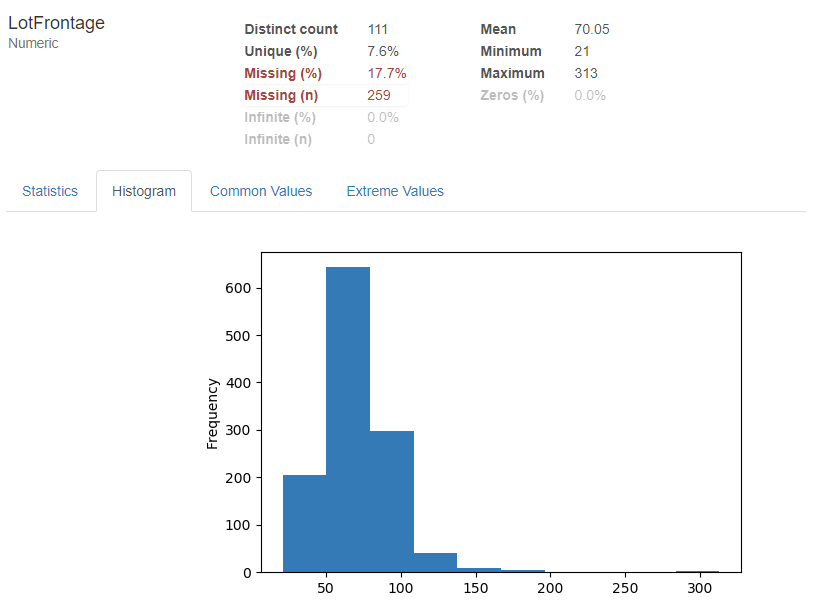

In [24]:
display(Image(filename = "../Images/LotFrontage_Histogram.png", width=600, unconfined=True))

In [25]:
LotMean = house['LotFrontage'].mean()
house['LotFrontage'].fillna(LotMean, inplace = True)

- Lot frontage had 259 missing data which are replaced by Mean.

In [26]:
house.LotFrontage.isnull().sum()

0

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001D895B61F60>]],
      dtype=object)

<Figure size 1000x1000 with 0 Axes>

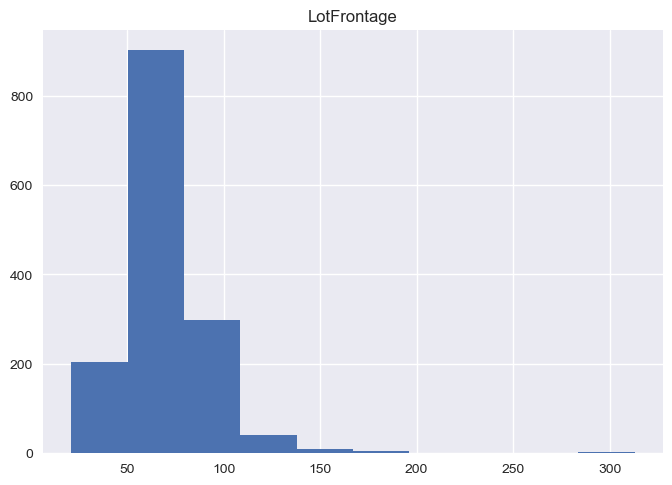

In [27]:
sns.set(font_scale=1.00)
plt.figure(figsize=(10, 10))
house.hist(column='LotFrontage', by=None, grid=True, figsize=None, bins=10)

C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



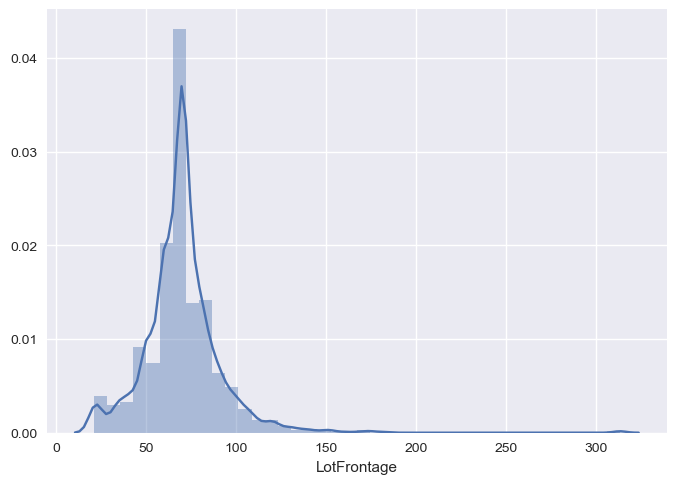

In [28]:
sns.distplot(house['LotFrontage'], bins=40)
sns.set(font_scale=1.00)

- Since the above image shows that there are 259 observation missing, we will replace all the missing data with Mean values.
- After the outliers are taken care it will give normal distribution.

### MasVnrArea

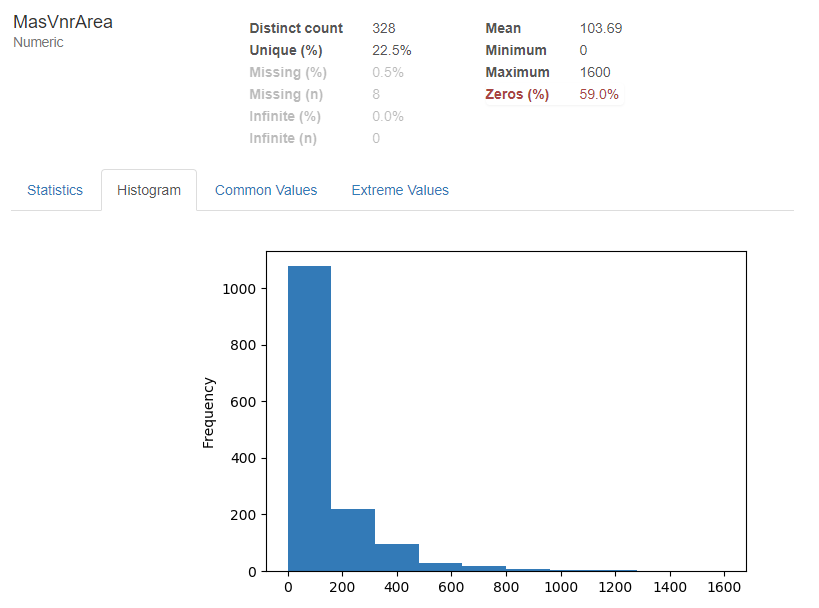

In [29]:
display(Image(filename = "../Images/MasVnrArea_Histogram.png", width=500, unconfined=True))

- Since the above image shows that there are 8 observation missing and in Histogram we can see that there are lot of outliers in 
  the data (zeros 59.0%).

In [30]:
house['MasVnrArea'][house['MasVnrType'].isnull()==True]

234    NaN
529    NaN
650    NaN
936    NaN
973    NaN
977    NaN
1243   NaN
1278   NaN
Name: MasVnrArea, dtype: float64

- MasVnrArea and MasVnrType are related , this data tells us that tere is no Masonry veneer area in square feet, we can replace   this None.

In [31]:
house["MasVnrType"] = house["MasVnrType"].fillna('None')
house["MasVnrArea"] = house["MasVnrArea"].fillna(0.0)

- If you see MasVnrType 59.2% is marker None and in which 0.2% is missing Data.
- MasVnrArea has 59.0% of Zero values, since MasVnrType 59.2% is marked None. This will be handeled when we take care of      
  outliers.

### 'GarageType','GarageQual','GarageCond','GarageYrBlt','GarageFinish','GarageCars','GarageArea'

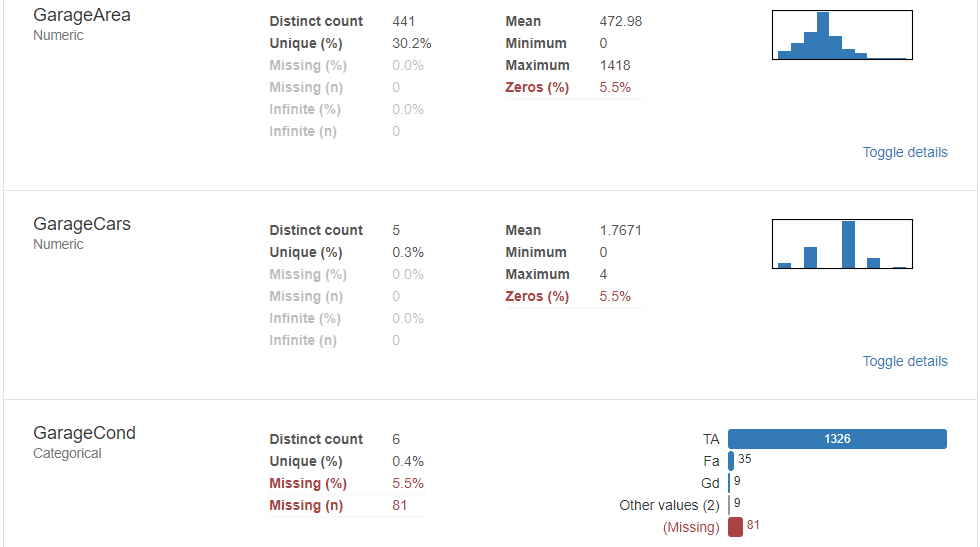

In [32]:
display(Image(filename = "../Images/Garage1.png", width=600, unconfined=True))

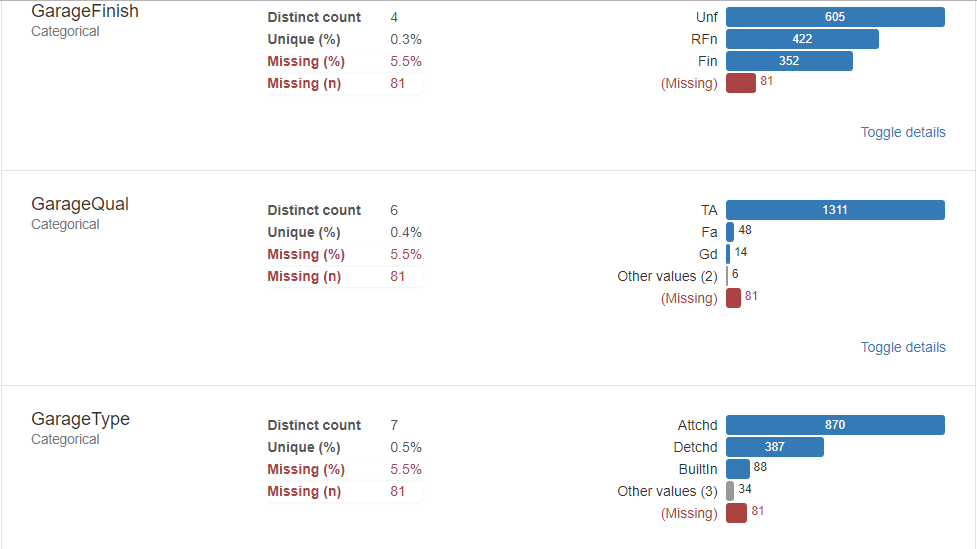

In [33]:
display(Image(filename = "../Images/Garage2.png", width=600, unconfined=True))

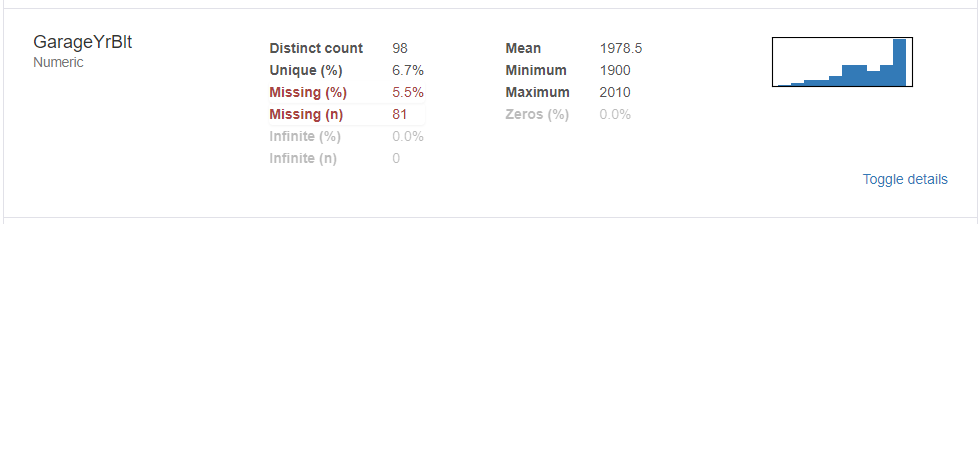

In [34]:
display(Image(filename = "../Images/Garage3.png", width=600, unconfined=True))

In [35]:
garage_cols=['GarageType','GarageQual','GarageCond','GarageYrBlt','GarageFinish','GarageCars','GarageArea']
house[garage_cols][house['GarageType'].isnull()==True]

,GarageType,GarageQual,GarageCond,GarageYrBlt,GarageFinish,GarageCars,GarageArea
39,NaN,NaN,NaN,NaN,NaN,0,0
48,NaN,NaN,NaN,NaN,NaN,0,0
78,NaN,NaN,NaN,NaN,NaN,0,0
88,NaN,NaN,NaN,NaN,NaN,0,0
89,NaN,NaN,NaN,NaN,NaN,0,0
99,NaN,NaN,NaN,NaN,NaN,0,0
108,NaN,NaN,NaN,NaN,NaN,0,0
125,NaN,NaN,NaN,NaN,NaN,0,0
127,NaN,NaN,NaN,NaN,NaN,0,0
140,NaN,NaN,NaN,NaN,NaN,0,0


#### Observation

- We can see that __'GarageType','GarageQual','GarageCond','GarageYrBlt','GarageFinish','GarageCars','GarageArea'__ all these     columns have data missing in the same row. so will replace these data with None and 0.
- Zeros may lead to outliers we will take care of out liers in the later section.

In [36]:
for col in garage_cols:
    if house[col].dtype==np.object:
        house[col] = house[col].fillna('None')
    else:
        house[col] = house[col].fillna(0)

In [37]:
house[garage_cols][house['GarageType'].isnull()==True]

,GarageType,GarageQual,GarageCond,GarageYrBlt,GarageFinish,GarageCars,GarageArea


### 'BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','BsmtFinSF1','BsmtFinSF2'

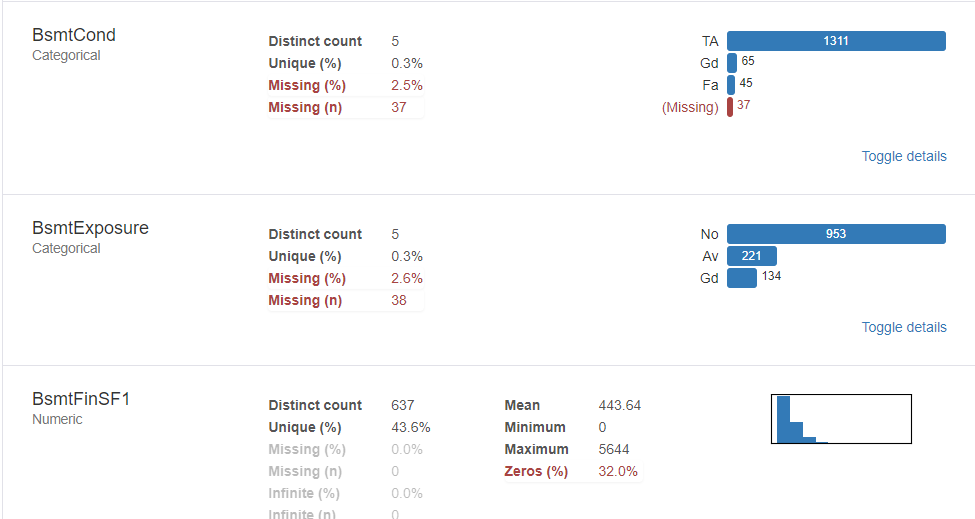

In [38]:
display(Image(filename = "../Images/Bsmt1.png", width=600, unconfined=True))

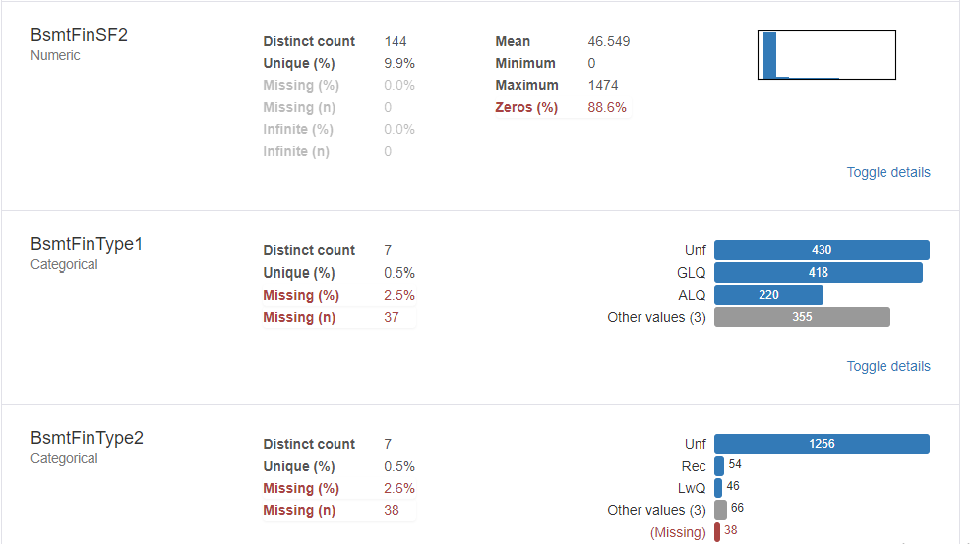

In [39]:
display(Image(filename = "../Images/Bsmt2.png", width=600, unconfined=True))

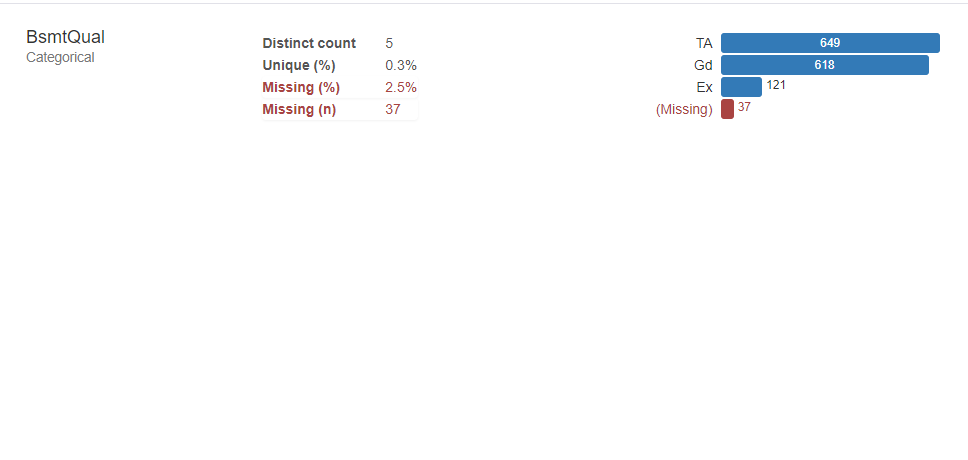

In [40]:
display(Image(filename = "../Images/Bsmt3.png", width=600, unconfined=True))

In [41]:
basement_cols=['BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','BsmtFinSF1','BsmtFinSF2']
house[basement_cols][house['BsmtQual'].isnull()==True]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtFinSF1,BsmtFinSF2
17,NaN,NaN,NaN,NaN,NaN,0,0
39,NaN,NaN,NaN,NaN,NaN,0,0
90,NaN,NaN,NaN,NaN,NaN,0,0
102,NaN,NaN,NaN,NaN,NaN,0,0
156,NaN,NaN,NaN,NaN,NaN,0,0
182,NaN,NaN,NaN,NaN,NaN,0,0
259,NaN,NaN,NaN,NaN,NaN,0,0
342,NaN,NaN,NaN,NaN,NaN,0,0
362,NaN,NaN,NaN,NaN,NaN,0,0
371,NaN,NaN,NaN,NaN,NaN,0,0


- All categorical variables contains NAN whereas continuous ones have 0. So that means there is no basement for those houses. we can replace it with 'None'.

In [42]:
for col in basement_cols:
    if 'FinSF'not in col:
        house[col] = house[col].fillna('None')

In [43]:
house[basement_cols][house['BsmtQual'].isnull()==True]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtFinSF1,BsmtFinSF2


### Electrical

In [44]:
house['Electrical'].isnull().sum()

1

-  As we see there is only one data missing, we can fill that with mode , that is most frequent value in the column.

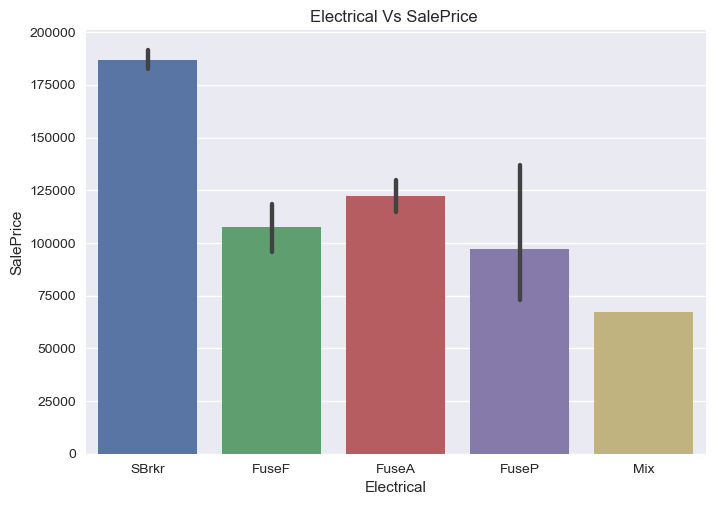

In [45]:
sns.set(font_scale=1.00)
sns.barplot("Electrical","SalePrice",data=house)
plt.title("Electrical Vs SalePrice ")
plt.ylabel("SalePrice")
plt.xlabel("Electrical");

In [46]:
house["Electrical"] = house["Electrical"].fillna('SBrkr')

In [47]:
house['Electrical'].isnull().sum()

0

### Pool Area and Pool QC

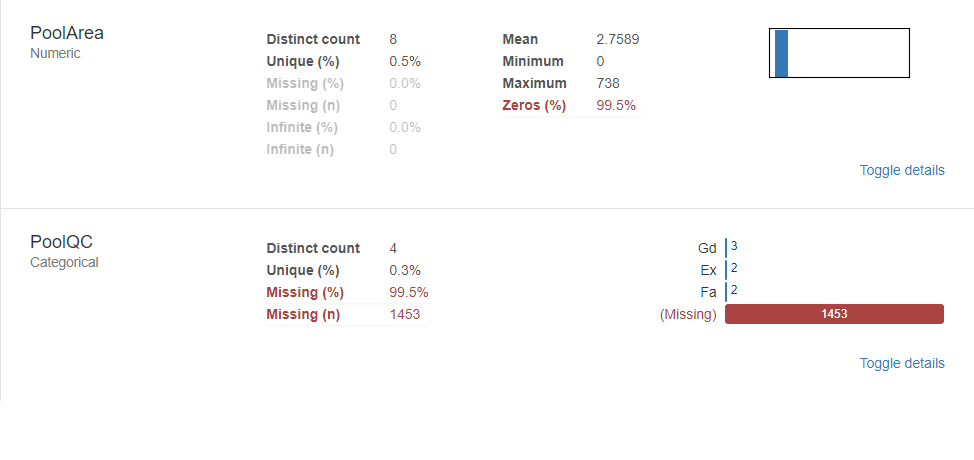

In [48]:
display(Image(filename = "../Images/Pool.png", width=600, unconfined=True))

- If we see both pool area and Pool QC both are having 99.5% missing data , that means these houses have no pool area.
- Lets see how this variable hold relation with dependent variable.

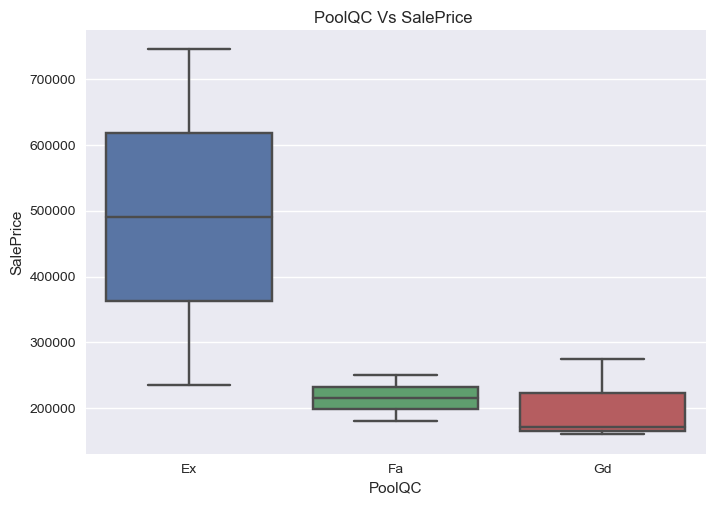

In [49]:
sns.set(font_scale=1.00)
sns.boxplot("PoolQC","SalePrice",data=house)
plt.title("PoolQC Vs SalePrice ")
plt.ylabel("SalePrice")
plt.xlabel("PoolQC");

- Since 99.5% of the data is missing, i think better we drop these columns

In [50]:
house.drop(['PoolQC', 'PoolArea'], axis=1, inplace= True)

### Alley

In [51]:
house['Alley'].isnull().sum()

1369

- All missing value indicate that particular house doesn't have an alley access.we can replace it with 'None'.

In [52]:
house["Alley"] = house["Alley"].fillna('None')

In [53]:
house['Alley'].isnull().sum()

0

### Fireplaces

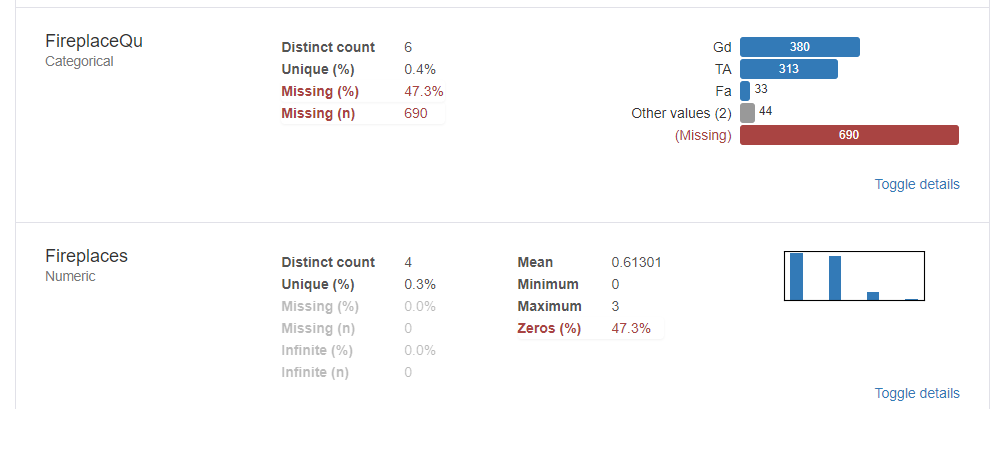

In [54]:
display(Image(filename = "../Images/FirePlace.png", width=600, unconfined=True))

In [55]:
house['FireplaceQu'].isnull().sum()

690

- All missing data indicated no Fire place in that house, we can see in the above screenshot.
- We can  replace all missing values with None

In [56]:
house["FireplaceQu"] = house["FireplaceQu"].fillna('None')

In [57]:
house['FireplaceQu'].isnull().sum()

0

### Fence

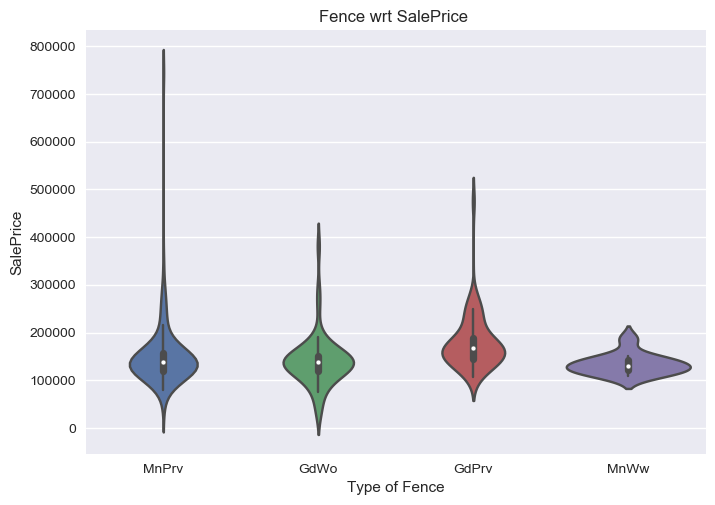

In [58]:
sns.set(font_scale=1.00)
sns.violinplot(house["Fence"],house["SalePrice"])
plt.title("Fence wrt SalePrice ")
plt.ylabel("SalePrice")
plt.xlabel("Type of Fence");

In [59]:
house["Fence"].isnull().sum()

1179

- Lets assume that these houses have no fence and replace it with None

In [60]:
house["Fence"] = house["Fence"].fillna('None')

In [61]:
house["Fence"].isnull().sum()

0

### MiscFeature

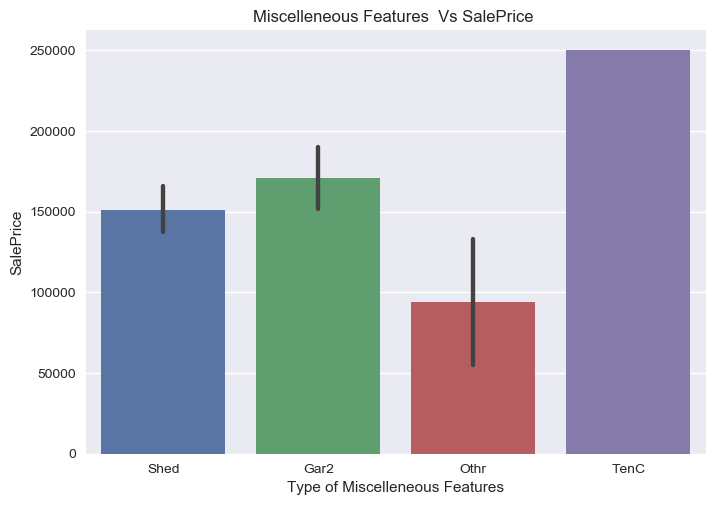

In [62]:
sns.set(font_scale=1.00)
sns.barplot(house["MiscFeature"],house["SalePrice"])
plt.title("Miscelleneous Features  Vs SalePrice ")
plt.ylabel("SalePrice")
plt.xlabel("Type of Miscelleneous Features");

- Some houses don't have miscellaneous features like shown above , shed, gar2, TenC and Othr
-  We replace the missing values with none

In [63]:
house["MiscFeature"] = house["MiscFeature"].fillna('None')

In [64]:
house["MiscFeature"].isnull().sum()

0

- Lets see if any Null values are left in the data

In [65]:
myObjlist = []
myObjlist = house.columns[house.dtypes==object]

for each in myObjlist:
    if house[each].dtypes == np.object:
        if house[each].isnull().sum() != 0:
            print("{} ------ : {}".format(each, house[each].isnull().sum()))
    else:
        print('Not and Obj')

In [66]:
mynonObjlist = []
mynonObjlist = house.columns[house.dtypes!=object]

for each in mynonObjlist:
    if house[each].dtypes == np.object:
        print('Its an Object')
    elif house[each].isnull().sum() != 0:
            print("{} ------ : {}".format(each, house[each].isnull().sum()))

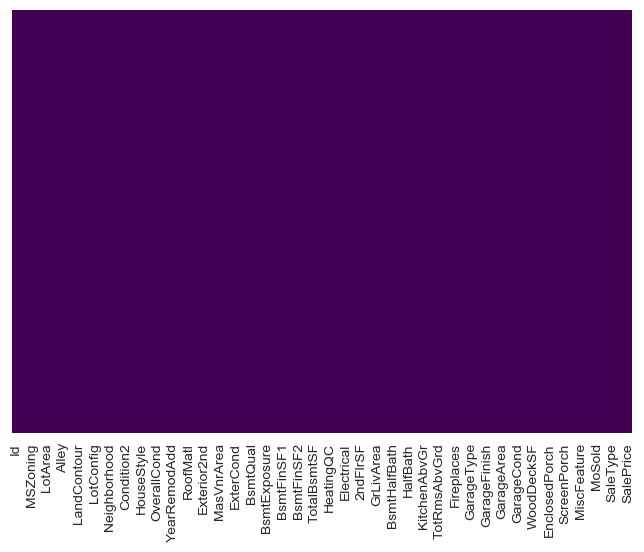

In [67]:
sns.set(font_scale=1.00)
sns.heatmap(house.isnull(),yticklabels=False,cbar=False,cmap='viridis')



- Its clear from the above heatmap that there are no Null values in the data
- In Next section we shall see how to handle the outlier data’s

In [68]:
## Will save this into CSV file for further use

house.to_csv('../RawData/house_data_CleanData.csv')

#### [Back to Index](#Index)

<a id=section5033><a/>

### 5.3.3 Log Transform the skewed features

In [69]:
house.skew()

Id                0.000000
MSSubClass        1.407657
LotFrontage       2.384950
LotArea          12.207688
OverallQual       0.216944
OverallCond       0.693067
YearBuilt        -0.613461
YearRemodAdd     -0.503562
MasVnrArea        2.677616
BsmtFinSF1        1.685503
BsmtFinSF2        4.255261
BsmtUnfSF         0.920268
TotalBsmtSF       1.524255
1stFlrSF          1.376757
2ndFlrSF          0.813030
LowQualFinSF      9.011341
GrLivArea         1.366560
BsmtFullBath      0.596067
BsmtHalfBath      4.103403
FullBath          0.036562
HalfBath          0.675897
BedroomAbvGr      0.211790
KitchenAbvGr      4.488397
TotRmsAbvGrd      0.676341
Fireplaces        0.649565
GarageYrBlt      -3.869501
GarageCars       -0.342549
GarageArea        0.179981
WoodDeckSF        1.541376
OpenPorchSF       2.364342
EnclosedPorch     3.089872
3SsnPorch        10.304342
ScreenPorch       4.122214
MiscVal          24.476794
MoSold            0.212053
YrSold            0.096269
SalePrice         1.882876
d

In [70]:
house.kurt()

Id                -1.200000
MSSubClass         1.580188
LotFrontage       21.848165
LotArea          203.243271
OverallQual        0.096293
OverallCond        1.106413
YearBuilt         -0.439552
YearRemodAdd      -1.272245
MasVnrArea        10.141416
BsmtFinSF1        11.118236
BsmtFinSF2        20.113338
BsmtUnfSF          0.474994
TotalBsmtSF       13.250483
1stFlrSF           5.745841
2ndFlrSF          -0.553464
LowQualFinSF      83.234817
GrLivArea          4.895121
BsmtFullBath      -0.839098
BsmtHalfBath      16.396642
FullBath          -0.857043
HalfBath          -1.076927
BedroomAbvGr       2.230875
KitchenAbvGr      21.532404
TotRmsAbvGrd       0.880762
Fireplaces        -0.217237
GarageYrBlt       13.043226
GarageCars         0.220998
GarageArea         0.917067
WoodDeckSF         2.992951
OpenPorchSF        8.490336
EnclosedPorch     10.430766
3SsnPorch        123.662379
ScreenPorch       18.439068
MiscVal          701.003342
MoSold            -0.404109
YrSold            -1

In [71]:
mynonObjlist = []
mynonObjlist = house.columns[house.dtypes!=object]

for each in mynonObjlist:
    if house[each].skew() > 0.75 or house[each].skew() < -0.75:
        print('{}--- : {}'.format(each, house[each].skew()))

MSSubClass--- : 1.4076567471495591
LotFrontage--- : 2.3849501679427925
LotArea--- : 12.207687851233496
MasVnrArea--- : 2.6776164510820997
BsmtFinSF1--- : 1.685503071910789
BsmtFinSF2--- : 4.255261108933303
BsmtUnfSF--- : 0.9202684528039037
TotalBsmtSF--- : 1.5242545490627664
1stFlrSF--- : 1.3767566220336365
2ndFlrSF--- : 0.8130298163023265
LowQualFinSF--- : 9.011341288465387
GrLivArea--- : 1.3665603560164552
BsmtHalfBath--- : 4.103402697955168
KitchenAbvGr--- : 4.488396777072859
GarageYrBlt--- : -3.869500821637888
WoodDeckSF--- : 1.5413757571931312
OpenPorchSF--- : 2.3643417403694404
EnclosedPorch--- : 3.08987190371177
3SsnPorch--- : 10.304342032693112
ScreenPorch--- : 4.122213743143115
MiscVal--- : 24.476794188821916
SalePrice--- : 1.8828757597682129


- Lets take the parameters with skew value more than 0.75 apply log for it.

In [72]:
numeric_feats = house.dtypes[house.dtypes != "object"].index

from scipy.stats import skew
skewed_feats = house[numeric_feats].apply(lambda x: skew(x.dropna())) #compute skewness
skewed_feats = skewed_feats[skewed_feats > 0.75]
skewed_feats = skewed_feats.index

skewed_feats

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtHalfBath', 'KitchenAbvGr',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'MiscVal', 'SalePrice'],
      dtype='object')

In [73]:
house[skewed_feats] = np.log1p(house[skewed_feats])

In [74]:
house.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,3SsnPorch,ScreenPorch,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,4.110874,RL,4.189655,9.042040,Pave,None,Reg,Lvl,AllPub,...,0.0,0.0,None,None,0.0,2,2008,WD,Normal,12.247699
1,2,3.044522,RL,4.394449,9.169623,Pave,None,Reg,Lvl,AllPub,...,0.0,0.0,None,None,0.0,5,2007,WD,Normal,12.109016
2,3,4.110874,RL,4.234107,9.328212,Pave,None,IR1,Lvl,AllPub,...,0.0,0.0,None,None,0.0,9,2008,WD,Normal,12.317171
3,4,4.262680,RL,4.110874,9.164401,Pave,None,IR1,Lvl,AllPub,...,0.0,0.0,None,None,0.0,2,2006,WD,Abnorml,11.849405
4,5,4.110874,RL,4.442651,9.565284,Pave,None,IR1,Lvl,AllPub,...,0.0,0.0,None,None,0.0,12,2008,WD,Normal,12.429220


In [75]:
house.skew()

Id               0.000000
MSSubClass       0.248997
LotFrontage     -0.891977
LotArea         -0.137404
OverallQual      0.216944
OverallCond      0.693067
YearBuilt       -0.613461
YearRemodAdd    -0.503562
MasVnrArea       0.503532
BsmtFinSF1      -0.618410
BsmtFinSF2       2.523694
BsmtUnfSF       -2.186504
TotalBsmtSF     -5.154670
1stFlrSF         0.080114
2ndFlrSF         0.289643
LowQualFinSF     7.460317
GrLivArea       -0.006140
BsmtFullBath     0.596067
BsmtHalfBath     3.933064
FullBath         0.036562
HalfBath         0.675897
BedroomAbvGr     0.211790
KitchenAbvGr     3.869414
TotRmsAbvGrd     0.676341
Fireplaces       0.649565
GarageYrBlt     -3.869501
GarageCars      -0.342549
GarageArea       0.179981
WoodDeckSF       0.153537
OpenPorchSF     -0.023397
EnclosedPorch    2.112275
3SsnPorch        7.734975
ScreenPorch      3.150409
MiscVal          5.170704
MoSold           0.212053
YrSold           0.096269
SalePrice        0.121347
dtype: float64

In [76]:
## Will save this into CSV file for further use

house.to_csv('../RawData/house_data_LogTransformed.csv')

#### [Back to Index](#Index)

<a id=section5034><a/>

### 5.3.4 Converting Categorical Features

In [77]:
myObjlist = []
myObjlist = house.columns[house.dtypes==object]

house[myObjlist].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 42 columns):
MSZoning         1460 non-null object
Street           1460 non-null object
Alley            1460 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-null object
Exterior2nd      1460 non-null object
MasVnrType       1460 non-null object
ExterQual        1460 non-null object
ExterCond        1460 non-null object
Foundation       1460 non-null object
BsmtQual         1460 non-null object
BsmtCond         1460 non-null object
BsmtExposure     14

In [78]:
from sklearn.preprocessing import LabelEncoder,OneHotEncoder

labelEnc=LabelEncoder()

myObjlist = []
myObjlist = house.columns[house.dtypes==object]

for col in myObjlist:
    house[col]=labelEnc.fit_transform(house[col])

In [79]:
house.get_dtype_counts()

float64    22
int64      57
dtype: int64

- Lets combine some column and make it one single column

In [80]:
# Year Columns
#'GarageYrBlt','YearBuilt','YearRemodAdd', 'YrSold'

In [81]:
def Year_Built(Year):
    if Year <= 1950:
        return 'Very Old'
    elif Year > 1950 and Year <= 1980:
        return 'Old'
    elif Year > 1980 and Year <= 2005:
        return 'Medium Aged'
    elif Year > 2005:
        return 'New'

In [82]:
house['GarageYrBlt'] = house['GarageYrBlt'].apply(lambda x: Year_Built(x))

In [83]:
house['YearBuilt']  = house['YearBuilt'].apply(lambda x: Year_Built(x))

In [84]:
house['YearRemodAdd']  = house['YearRemodAdd'].apply(lambda x: Year_Built(x))

In [85]:
house['YrSold']  = house['YrSold'].apply(lambda x: Year_Built(x))

In [86]:
house[['GarageYrBlt','YearBuilt','YearRemodAdd', 'YrSold']].describe()

,GarageYrBlt,YearBuilt,YearRemodAdd,YrSold
count,1460,1460,1460,1460
unique,4,4,4,1
top,Medium Aged,Old,Medium Aged,New
freq,517,520,626,1460


- Lets convert these data into numerical data

In [87]:
myObjlist = ['GarageYrBlt','YearBuilt','YearRemodAdd', 'YrSold']

for col in myObjlist:
    house[col]=labelEnc.fit_transform(house[col])

In [88]:
house[['GarageYrBlt','YearBuilt','YearRemodAdd', 'YrSold']].describe()

,GarageYrBlt,YearBuilt,YearRemodAdd,YrSold
count,1460.000000,1460.000000,1460.00000,1460.0
mean,1.365753,1.515068,1.09863,0.0
std,1.144372,1.149744,1.09137,0.0
min,0.000000,0.000000,0.00000,0.0
25%,0.000000,0.000000,0.00000,0.0
50%,2.000000,2.000000,1.00000,0.0
75%,2.000000,2.000000,2.00000,0.0
max,3.000000,3.000000,3.00000,0.0


- Lets drop __Id, YrSold, MiscFeature, MiscVal__ columns which are having more zeros and are very less use for Modeling

In [89]:
house.drop('Id', axis=1, inplace= True)

In [90]:
house.drop('YrSold', axis=1, inplace= True)

In [91]:
house.drop('MiscFeature', axis=1, inplace= True)

In [92]:
house.drop('MiscVal', axis=1, inplace= True)

In [93]:
## Will save this into CSV file for further use

house.to_csv('../RawData/house_data_CleanLogCatDrop.csv')

#### [Back to Index](#Index)

<a id=section5035><a/>

### 5.3.5 Choosing the Features for Modeling and handeling Multicollinearity

- We shall see the Correlation of the data with the Target variable.

In [94]:
corr=house.corr()["SalePrice"]
corr[np.argsort(corr, axis=0)[::-1]]

SalePrice        1.000000
OverallQual      0.817185
GrLivArea        0.730254
GarageCars       0.680625
GarageArea       0.650888
1stFlrSF         0.608955
FullBath         0.594771
TotRmsAbvGrd     0.534422
Fireplaces       0.489450
OpenPorchSF      0.459948
MasVnrArea       0.413318
Foundation       0.412083
LotArea          0.399923
TotalBsmtSF      0.372838
CentralAir       0.351599
LotFrontage      0.346668
WoodDeckSF       0.343039
GarageCond       0.323691
HalfBath         0.313982
PavedDrive       0.304687
Electrical       0.294399
GarageQual       0.275692
SaleCondition    0.248819
BsmtFullBath     0.236224
HouseStyle       0.214717
BedroomAbvGr     0.209043
BsmtUnfSF        0.208233
BsmtFinSF1       0.208099
Neighborhood     0.201685
RoofStyle        0.186917
                   ...   
LandSlope        0.038526
LandContour      0.032340
Condition2       0.001327
BsmtHalfBath    -0.004890
Utilities       -0.012632
MasVnrType      -0.015779
MSSubClass      -0.020279
BsmtFinSF2  

__Observation__

- From above we can see some good Correlation after data is processed.
- We shall consider parameters with more than 0.5 positive correlations and -0.2 negative correlations.
- Lets plot a correlation plot for the selected parameters

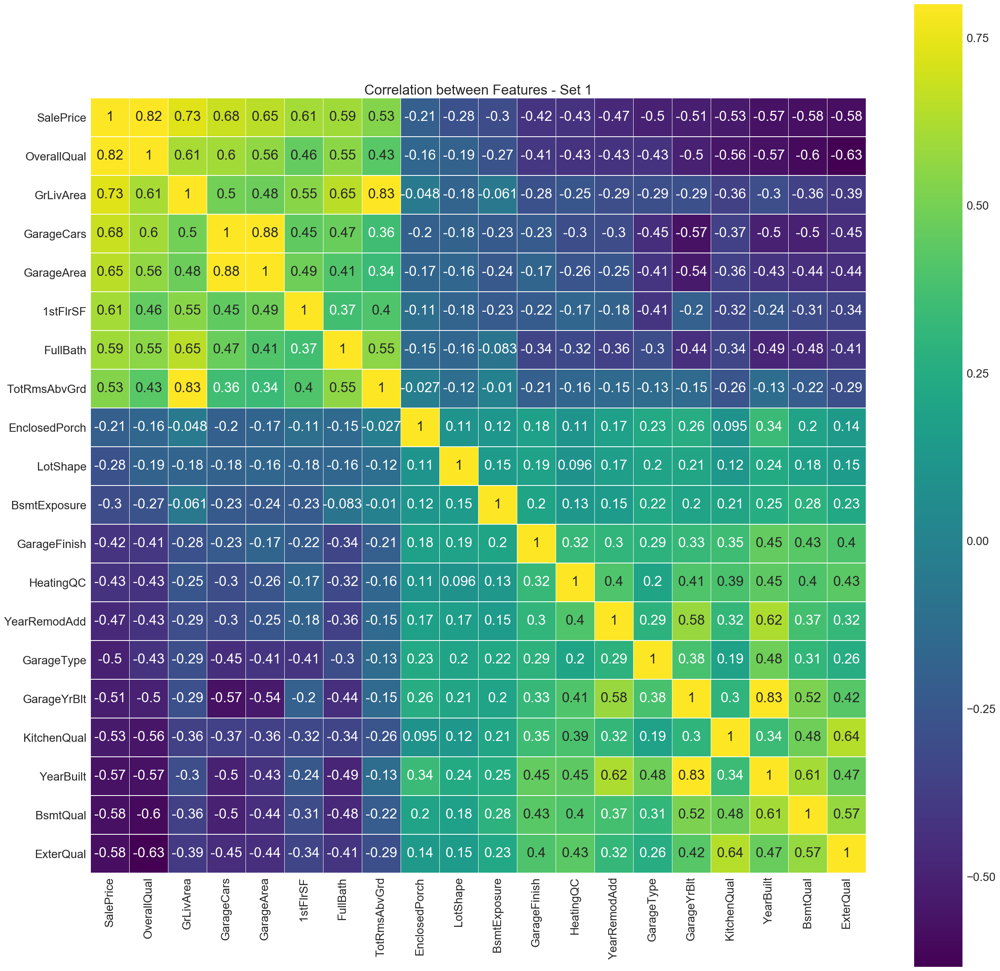

In [95]:
corrMatrix=house[['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 
                  'EnclosedPorch', 'LotShape', 'BsmtExposure', 'GarageFinish', 'HeatingQC', 'YearRemodAdd', 'GarageType', 
                 'GarageYrBlt', 'KitchenQual', 'YearBuilt', 'BsmtQual', 'ExterQual']].corr()

sns.set(font_scale=2.00)
plt.figure(figsize=(30, 30))

sns.heatmap(corrMatrix, vmax=.8, linewidths=0.01,
            square=True,annot=True,cmap='viridis',linecolor="white")
plt.title('Correlation between Features - Set 1');

- From above we plot we can see two things, one good correlation between Sale Price and other input variables
- Second is that Multicollinearity which is not a good thing. We will see what all pairs of correlation are there in the data

##### Multicollinearity

In [96]:
correlations = house.corr()# taking correlation into variable
attrs = correlations.iloc[:-1,:-1] # all except target

threshold = 0.5
important_corrs = (attrs[abs(attrs) > threshold][attrs != 1.0]) \
    .unstack().dropna().to_dict()

unique_important_corrs = pd.DataFrame(
    list(set([(tuple(sorted(key)), important_corrs[key]) \
    for key in important_corrs])), 
        columns=['Attribute Pair', 'Correlation'])

    # sorted by absolute value
unique_important_corrs = unique_important_corrs.iloc[
    abs(unique_important_corrs['Correlation']).argsort()[::-1]]

unique_important_corrs

,Attribute Pair,Correlation
4,"(GarageArea, GarageCars)",0.882475
32,"(Exterior1st, Exterior2nd)",0.854163
33,"(GarageYrBlt, YearBuilt)",0.826165
37,"(GrLivArea, TotRmsAbvGrd)",0.825521
16,"(BsmtFinSF2, BsmtFinType2)",-0.822144
36,"(BsmtFinSF1, BsmtFinType1)",-0.804535
27,"(BedroomAbvGr, TotRmsAbvGrd)",0.676620
34,"(LotArea, LotFrontage)",0.654004
6,"(FullBath, GrLivArea)",0.653167
22,"(ExterQual, KitchenQual)",0.641584


- From above calculation we can see lot of __Multicollinearity__ this may result in poor prediction.
- Lets filter out the input parameters based on above results.

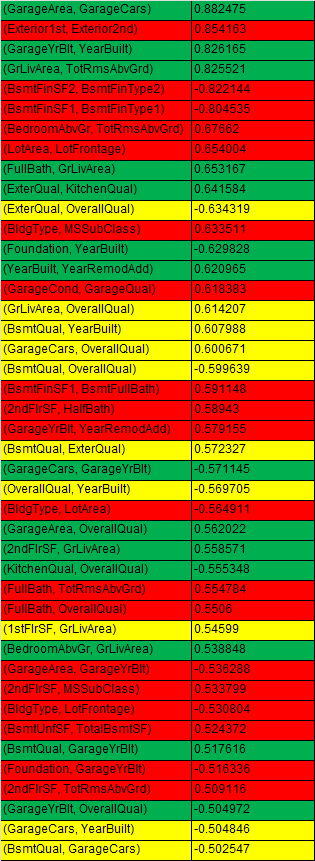

- Based on the above correlation results i have filtered out one parameter among each pare as shown above.
- Green rows indicate, one of the parameter which has less correlation with Sale Price (Dependent Variable) has been ignored.
- Red indicates both of the parameters are ignored.
- Yellow are those which have Good correlation with Output variable and also have Multicorrelation, i have kept as it is right     now, we shall use this with our model, later during tuning the model we shall choose what we do with these parameters.
- we will be using below parameters as our Input variables.
  
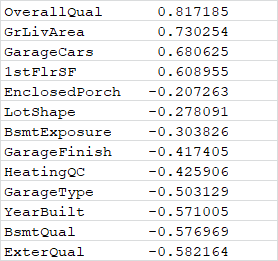


#### [Back to Index](#Index)

<a id=section504><a/>

### 5.4 Post Profiling

In [97]:
profile = pandas_profiling.ProfileReport(house)
profile.to_file(outputfile="HousesData_Post_Profiling.html")

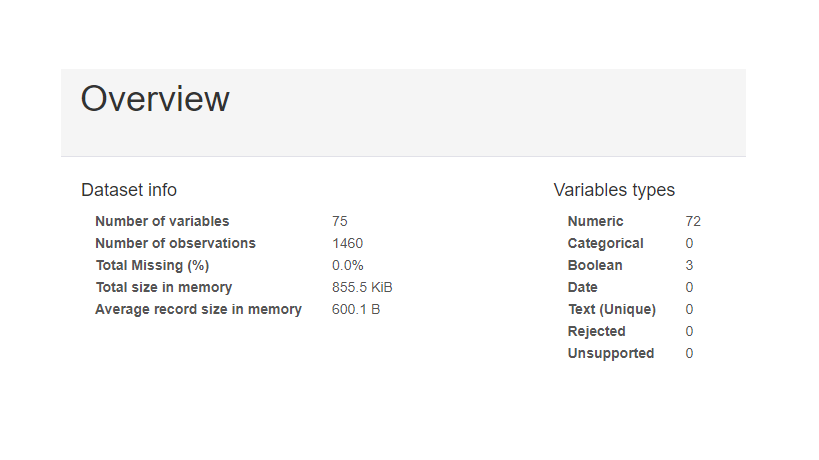

In [98]:
from IPython.core.display import Image, display
display(Image(filename = "../Images/PostProfiling_Summary.png", width=700, unconfined=True))

__Observation__

- From Post profiling we can get a clear picture of the data, refer __"HousesData_Post_Profiling.html"__ for more clarity.
- From the above summary image we can see that there are no missing data’s.
- Zeros in our data : let us keep them as of now, if it is influencing the ML Models and resulting in inaccuracy we will take     care of them later.


#### [Back to Index](#Index)

<a id=section6><a/>

## 6. Questions

- In Questions section we shall see how many questions our data can answer to predict the Dependent variable.
- This will help us in identifying correct Input variable to get and accurate result.

#### [Back to Index](#Index)

<a id=section601><a/>

### 6.1 Grouping all the Prices with respect to Overall Quality

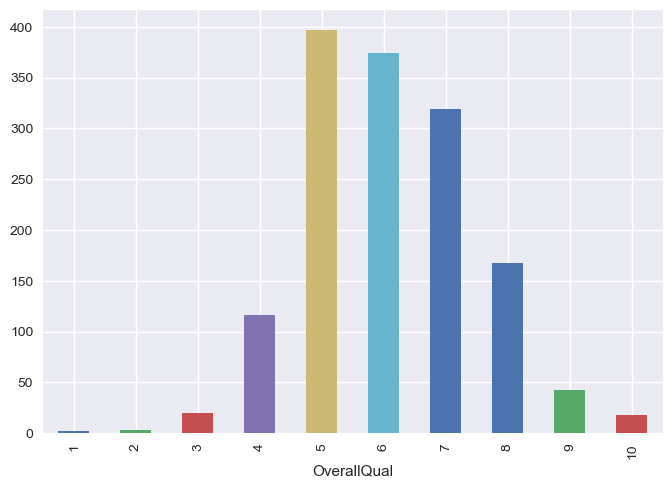

In [99]:
sns.set(font_scale=1.00)
house.groupby('OverallQual')['SalePrice'].count().plot.bar()

C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.

C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



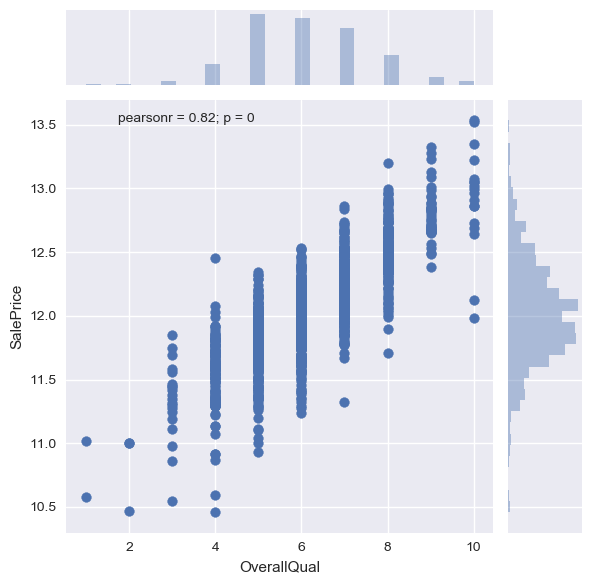

In [100]:
sns.jointplot(x='OverallQual',y='SalePrice',data=house)
sns.set(font_scale=1.00)

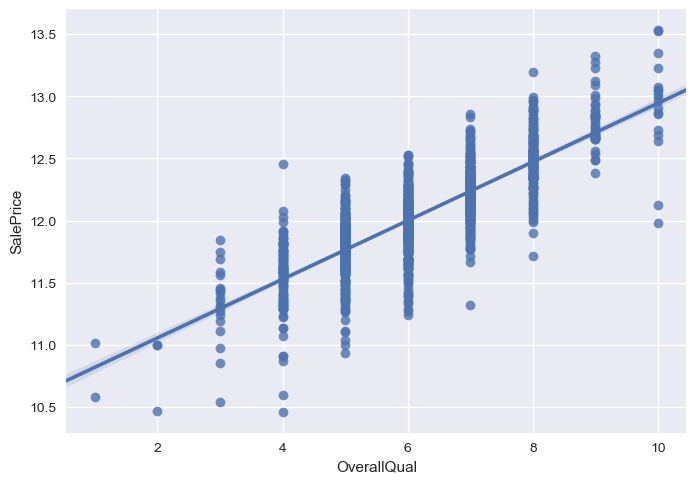

In [101]:
sns.regplot(x="OverallQual", y="SalePrice", data=house);
sns.set(font_scale=1.00)

-  From the above plot we can see that from rating 4 to 8 have some major spread.
-  Rating 4 to 8 have more than 100 houses.
-  Rating 5, 6 and 7 have more than 300 houses each.
-  By above plots we can see good spread and Overall Quality has __OverallQual 0.817185__ very good positive correlation

#### [Back to Index](#Index)

<a id=section602><a/>

### 6.2 Does Height of the basement and Exterior material quality have negetive impact on Sale Price ?

In [102]:
house['BsmtQual'].value_counts()

4    649
2    618
0    121
3     37
1     35
Name: BsmtQual, dtype: int64

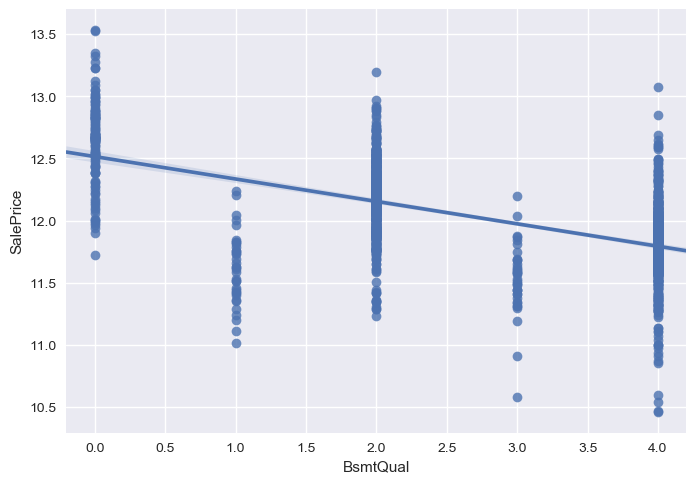

In [103]:
sns.regplot(x="BsmtQual", y="SalePrice", data=house);
sns.set(font_scale=1.00)

In [104]:
house.iplot(kind='scatter',x='BsmtQual',y='SalePrice',mode='markers',size=10)

In [105]:
house['ExterQual'].value_counts()

3    906
2    488
0     52
1     14
Name: ExterQual, dtype: int64

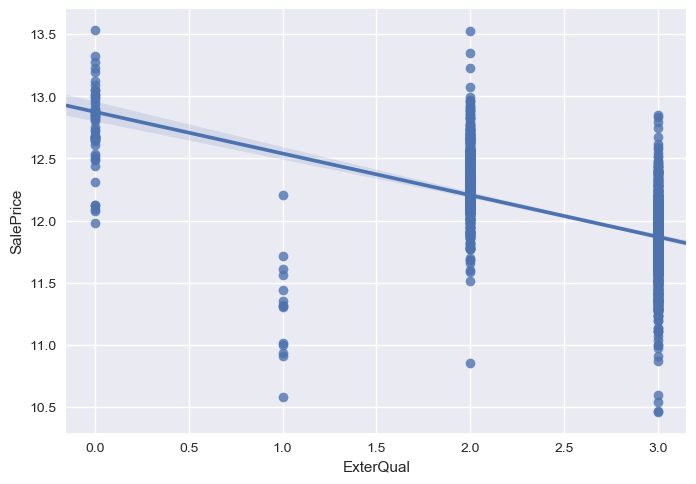

In [106]:
sns.regplot(x="ExterQual", y="SalePrice", data=house);
sns.set(font_scale=1.00)

In [107]:
house.iplot(kind='scatter',x='ExterQual',y='SalePrice',size=10, mode='markers')

- By above plots we can see that both __BsmtQual, ExterQual__ are having Negetive correlation.
- we can use these paameters for the Models

#### [Back to Index](#Index)

<a id=section603><a/>

### 6.3 Negetive correlated parameters with respect to Sale Price

- Lets plot all the negetive parameters from the list in section 5.3.5

In [108]:
house[['SalePrice', 'EnclosedPorch', 'LotShape', 'BsmtExposure', 'GarageFinish', 'HeatingQC', 'GarageType', 'YearBuilt', 'BsmtQual', 'ExterQual']].corr().style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1)

,SalePrice,EnclosedPorch,LotShape,BsmtExposure,GarageFinish,HeatingQC,GarageType,YearBuilt,BsmtQual,ExterQual
SalePrice,1.0,-0.21,-0.28,-0.3,-0.42,-0.43,-0.5,-0.57,-0.58,-0.58
EnclosedPorch,-0.21,1.0,0.11,0.12,0.18,0.11,0.23,0.34,0.2,0.14
LotShape,-0.28,0.11,1.0,0.15,0.19,0.096,0.2,0.24,0.18,0.15
BsmtExposure,-0.3,0.12,0.15,1.0,0.2,0.13,0.22,0.25,0.28,0.23
GarageFinish,-0.42,0.18,0.19,0.2,1.0,0.32,0.29,0.45,0.43,0.4
HeatingQC,-0.43,0.11,0.096,0.13,0.32,1.0,0.2,0.45,0.4,0.43
GarageType,-0.5,0.23,0.2,0.22,0.29,0.2,1.0,0.48,0.31,0.26
YearBuilt,-0.57,0.34,0.24,0.25,0.45,0.45,0.48,1.0,0.61,0.47
BsmtQual,-0.58,0.2,0.18,0.28,0.43,0.4,0.31,0.61,1.0,0.57
ExterQual,-0.58,0.14,0.15,0.23,0.4,0.43,0.26,0.47,0.57,1.0


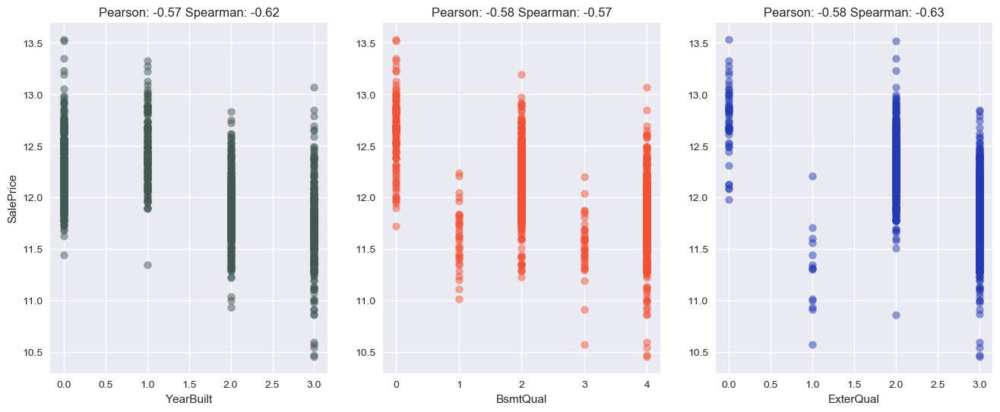

In [109]:
# plot correlated values
plt.rcParams['figure.figsize'] = [16, 6]

fig, ax = plt.subplots(nrows=1, ncols=3)

ax=ax.flatten()

cols = ['YearBuilt', 'BsmtQual', 'ExterQual']
colors=['#415952', '#f35134', '#243AB5', '#243AB5']
j=0

for i in ax:
    if j==0:
        i.set_ylabel('SalePrice')
    i.scatter(house[cols[j]], house['SalePrice'],  alpha=0.5, color=colors[j])
    i.set_xlabel(cols[j])
    i.set_title('Pearson: %s'%house.corr().loc[cols[j]]['SalePrice'].round(2)+' Spearman: %s'%house.corr(method='spearman').loc[cols[j]]['SalePrice'].round(2))
    j+=1

- We can see above plots these parameters have very good negetive correlation.
- Negative correlation is a relationship between two variables in which one variable increases as the other decreases, and vice 
  versa.
- We shall be using few parameters from this list and omiting few becuase of multicollinearity

#### [Back to Index](#Index)

<a id=section604><a/>

### 6.4 Positive correlated parameters with respect to Sale Price

- Lets plot all the negetive parameters from the list in section 5.3.5

In [110]:
house[['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', '1stFlrSF']].corr().style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1)

,SalePrice,OverallQual,GrLivArea,GarageCars,1stFlrSF
SalePrice,1.0,0.82,0.73,0.68,0.61
OverallQual,0.82,1.0,0.61,0.6,0.46
GrLivArea,0.73,0.61,1.0,0.5,0.55
GarageCars,0.68,0.6,0.5,1.0,0.45
1stFlrSF,0.61,0.46,0.55,0.45,1.0


In [111]:
houseone[['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', '1stFlrSF']].corr().style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1)

,SalePrice,OverallQual,GrLivArea,GarageCars,1stFlrSF
SalePrice,1.0,0.79,0.71,0.64,0.61
OverallQual,0.79,1.0,0.59,0.6,0.48
GrLivArea,0.71,0.59,1.0,0.47,0.57
GarageCars,0.64,0.6,0.47,1.0,0.44
1stFlrSF,0.61,0.48,0.57,0.44,1.0


- Above plot shows correlation between positive parameters.
- Two plots , one with log transformation values and another regular values.
- We can see how log transformation has helped to reduce skewness, multicollinearity and increase positive collinearity between   sale price and other parameters.

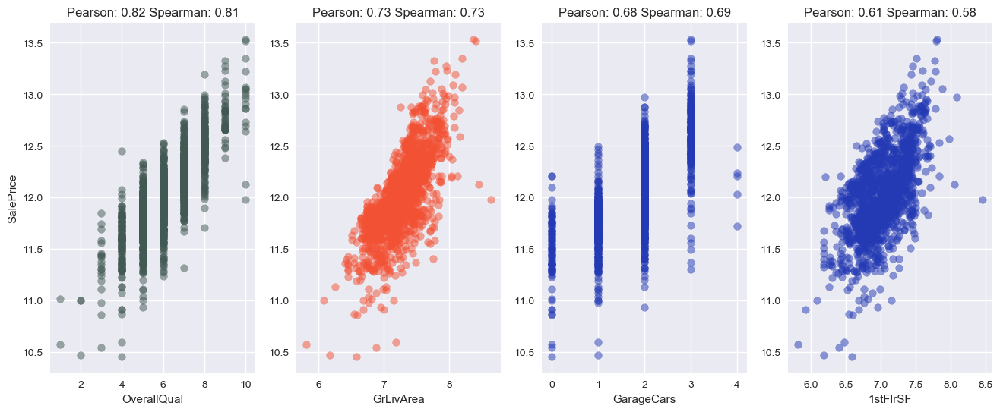

In [112]:
# plot correlated values
plt.rcParams['figure.figsize'] = [16, 6]

fig, ax = plt.subplots(nrows=1, ncols=4)

ax=ax.flatten()

cols = ['OverallQual', 'GrLivArea', 'GarageCars', '1stFlrSF']
colors=['#415952', '#f35134', '#243AB5', '#243AB5']
j=0

for i in ax:
    if j==0:
        i.set_ylabel('SalePrice')
    i.scatter(house[cols[j]], house['SalePrice'],  alpha=0.5, color=colors[j])
    i.set_xlabel(cols[j])
    i.set_title('Pearson: %s'%house.corr().loc[cols[j]]['SalePrice'].round(2)+' Spearman: %s'%house.corr(method='spearman').loc[cols[j]]['SalePrice'].round(2))
    j+=1

- We can see above plots these parameters have very good positive correlation.
- Positive correlation is a relationship between two variables in which both variables move in tandem. A positive correlation  
  exists when one variable decreases as the other variable decreases, or one variable increases while the other increases.
- We shall be using all these parameters from this list and omiting few becuase of multicollinearity.

#### [Back to Index](#Index)

<a id=section605><a/>

### 6.5 Analyse Sale Price with other variables, other than selected variables

- Normal probability plot - Data distribution should closely follow the diagonal that represents the normal distribution.

__Data with no Log transformation__

C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



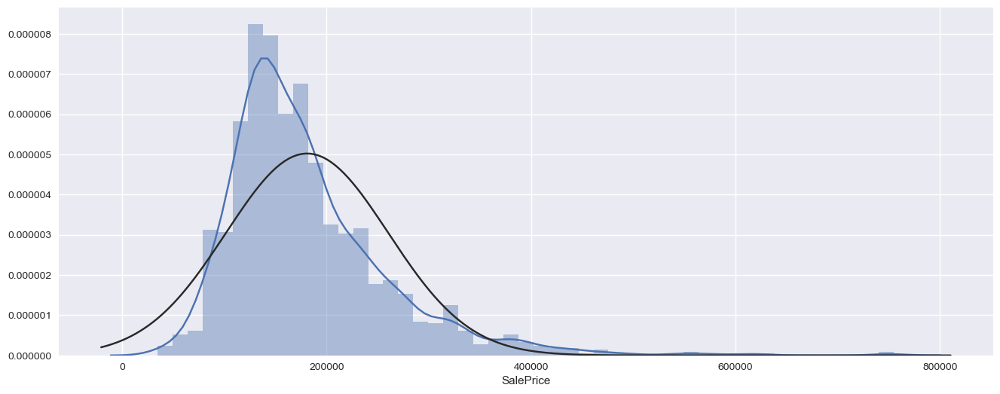

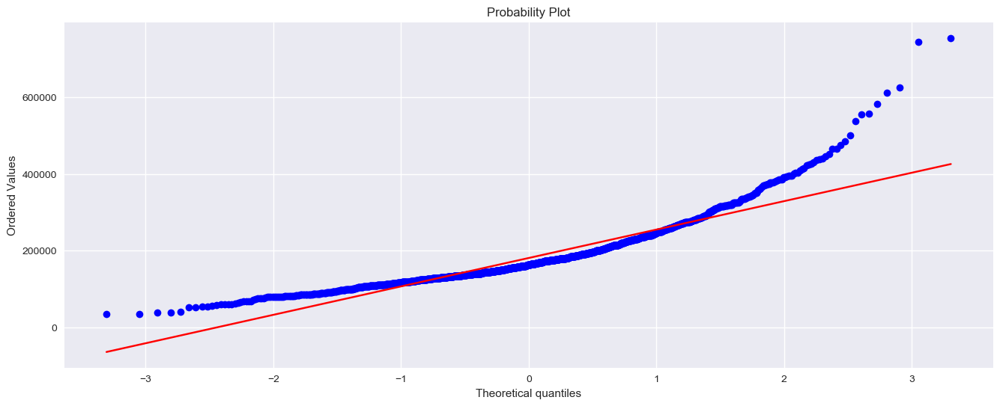

In [113]:
from scipy.stats import norm
from scipy import stats
#histogram and normal probability plot
sns.distplot(houseone['SalePrice'], fit=norm);
fig = plt.figure()
res = stats.probplot(houseone['SalePrice'], plot=plt)

__Data with Log transformation__

C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



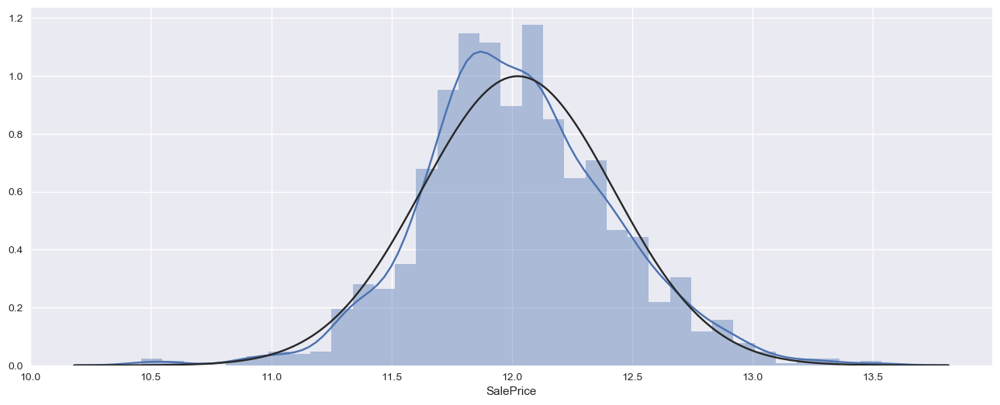

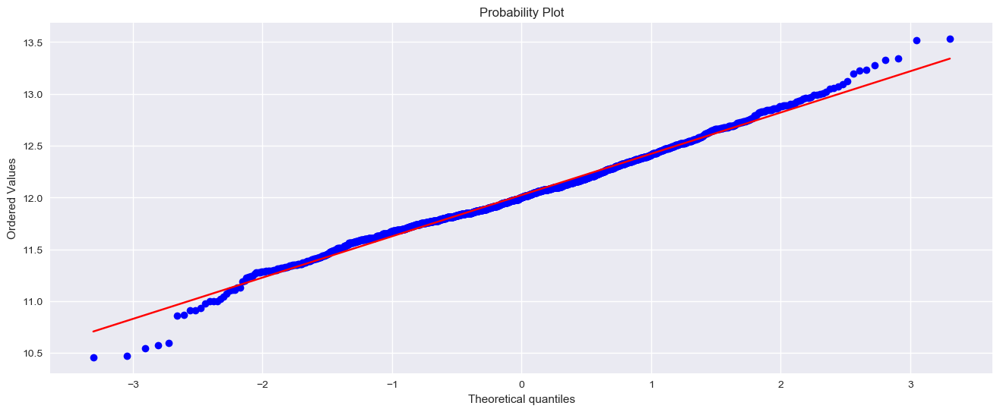

In [114]:
from scipy.stats import norm
from scipy import stats
#histogram and normal probability plot
sns.distplot(house['SalePrice'], fit=norm);
fig = plt.figure()
res = stats.probplot(house['SalePrice'], plot=plt)

- You can see the difference between Log tranformation and normal data.
- How skewness is reduced by log transformation of data.

- Lets analyse these __Heating, KitchenAbvGr, MSZoning__ variables which are having negetive corellation, and have less multicorellation with other variables.

In [115]:
house[['SalePrice', 'Heating', 'KitchenAbvGr', 'MSZoning']].corr()

,SalePrice,Heating,KitchenAbvGr,MSZoning
SalePrice,1.000000,-0.139919,-0.144278,-0.188861
Heating,-0.139919,1.000000,0.122137,0.056866
KitchenAbvGr,-0.144278,0.122137,1.000000,0.046795
MSZoning,-0.188861,0.056866,0.046795,1.000000


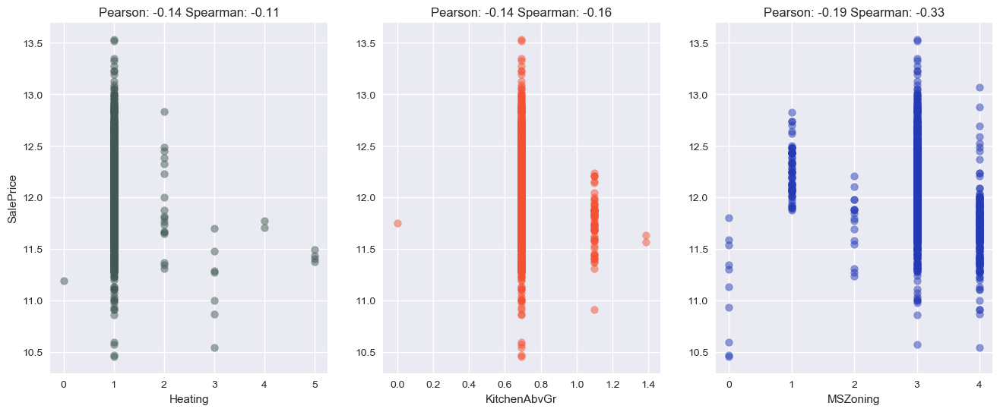

In [116]:
# plot correlated values
plt.rcParams['figure.figsize'] = [16, 6]

fig, ax = plt.subplots(nrows=1, ncols=3)

ax=ax.flatten()

cols = ['Heating', 'KitchenAbvGr', 'MSZoning']
colors=['#415952', '#f35134', '#243AB5', '#243AB5']
j=0

for i in ax:
    if j==0:
        i.set_ylabel('SalePrice')
    i.scatter(house[cols[j]], house['SalePrice'],  alpha=0.5, color=colors[j])
    i.set_xlabel(cols[j])
    i.set_title('Pearson: %s'%house.corr().loc[cols[j]]['SalePrice'].round(2)+' Spearman: %s'%house.corr(method='spearman').loc[cols[j]]['SalePrice'].round(2))
    j+=1

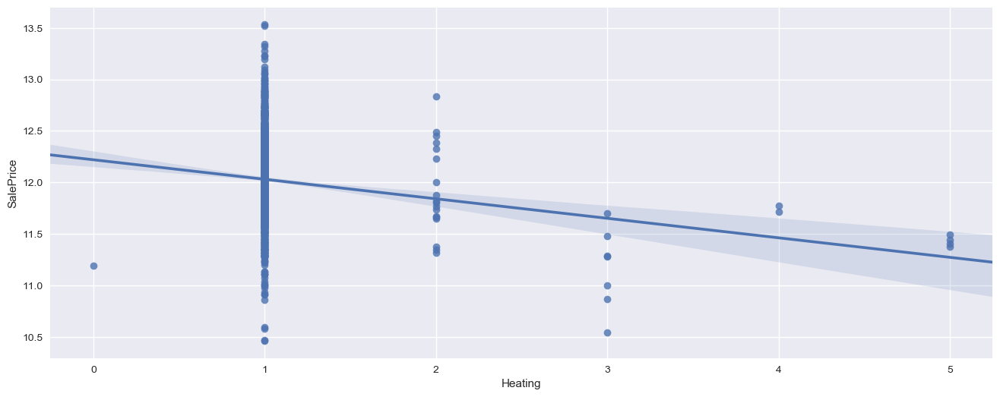

In [117]:
sns.regplot(x="Heating", y="SalePrice", data=house);
sns.set(font_scale=1.00)

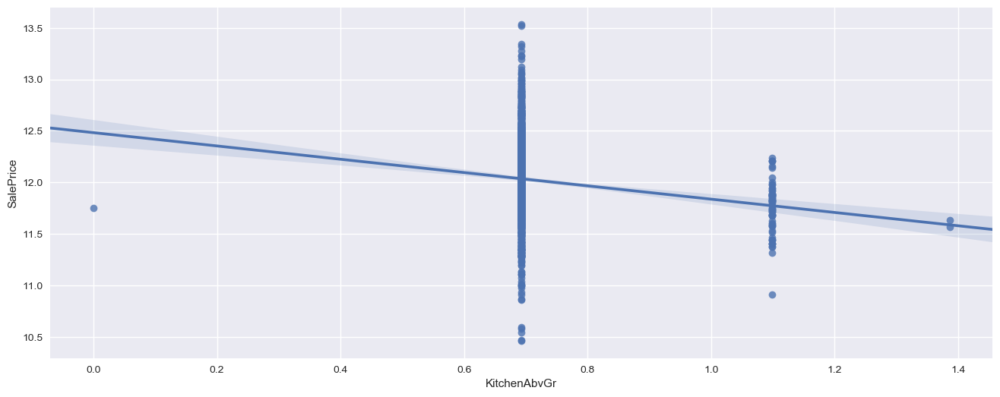

In [118]:
sns.regplot(x="KitchenAbvGr", y="SalePrice", data=house);
sns.set(font_scale=1.00)

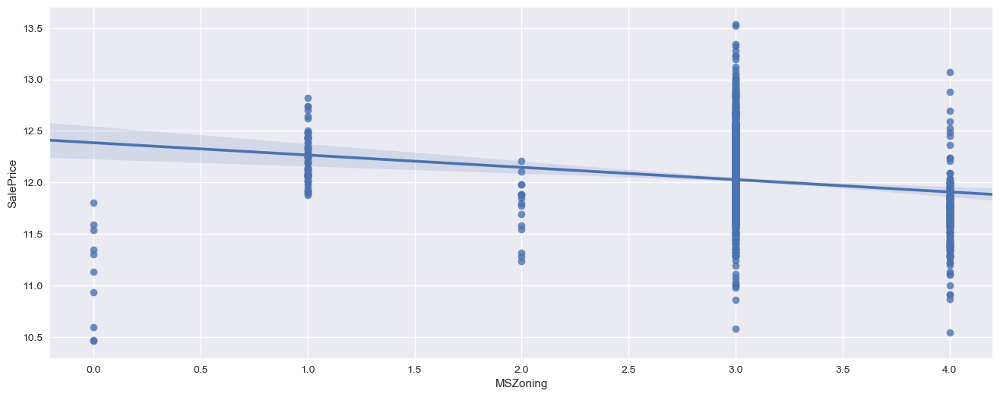

In [119]:
sns.regplot(x="MSZoning", y="SalePrice", data=house);
sns.set(font_scale=1.00)

- Lets analyse these __Fireplaces, OpenPorchSF, MasVnrArea__ variables which are having positive corellation, and have less multicorellation with other variables.

In [120]:
house[['SalePrice', 'Fireplaces', 'OpenPorchSF', 'MasVnrArea']].corr()

,SalePrice,Fireplaces,OpenPorchSF,MasVnrArea
SalePrice,1.000000,0.489450,0.459948,0.413318
Fireplaces,0.489450,1.000000,0.207543,0.224263
OpenPorchSF,0.459948,0.207543,1.000000,0.207023
MasVnrArea,0.413318,0.224263,0.207023,1.000000


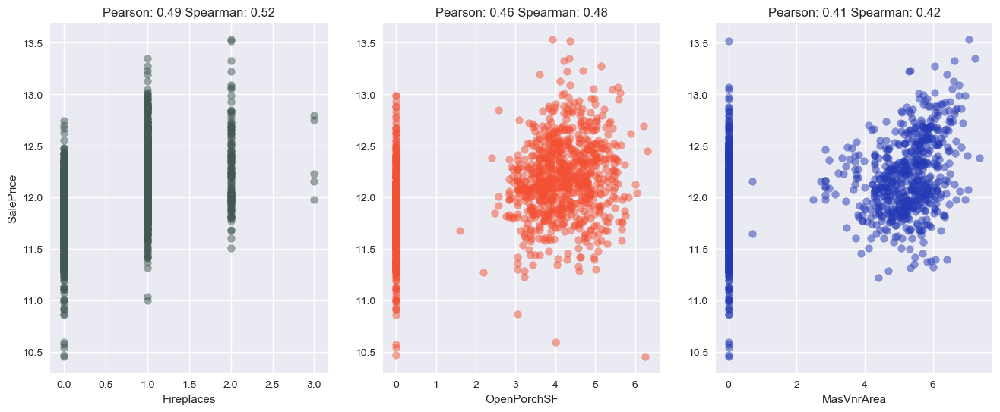

In [121]:
# plot correlated values
plt.rcParams['figure.figsize'] = [16, 6]

fig, ax = plt.subplots(nrows=1, ncols=3)

ax=ax.flatten()

cols = ['Fireplaces', 'OpenPorchSF', 'MasVnrArea']
colors=['#415952', '#f35134', '#243AB5', '#243AB5']
j=0

for i in ax:
    if j==0:
        i.set_ylabel('SalePrice')
    i.scatter(house[cols[j]], house['SalePrice'],  alpha=0.5, color=colors[j])
    i.set_xlabel(cols[j])
    i.set_title('Pearson: %s'%house.corr().loc[cols[j]]['SalePrice'].round(2)+' Spearman: %s'%house.corr(method='spearman').loc[cols[j]]['SalePrice'].round(2))
    j+=1

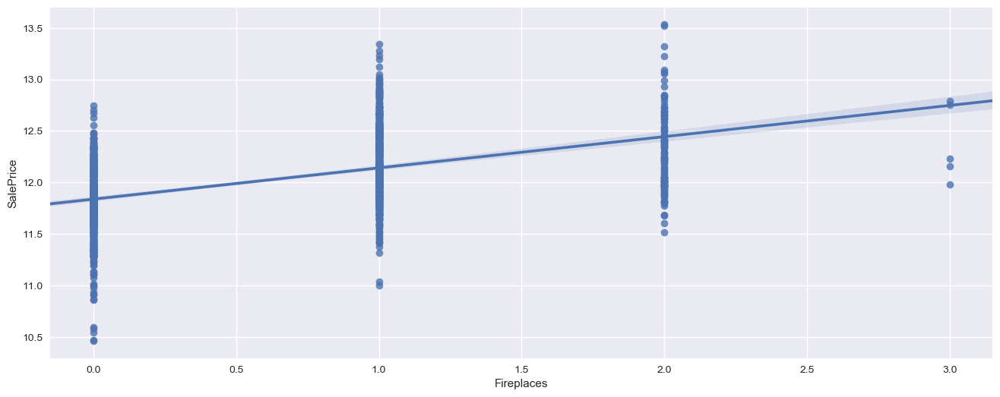

In [122]:
sns.regplot(x="Fireplaces", y="SalePrice", data=house);
sns.set(font_scale=1.00)

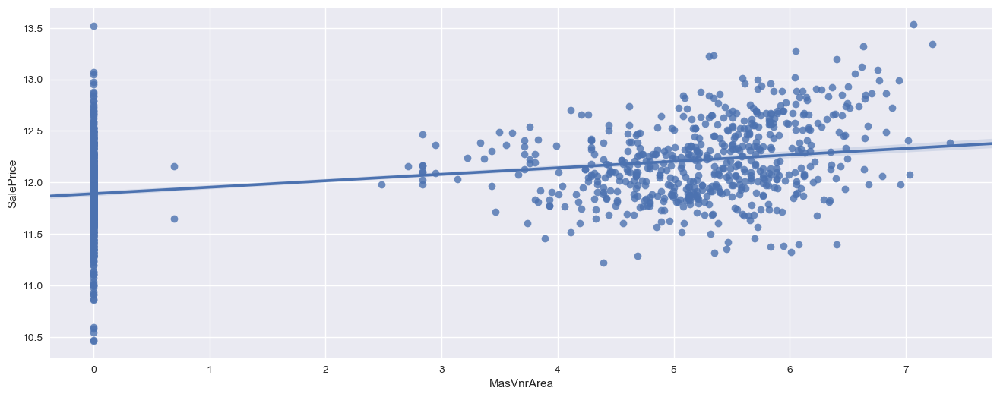

In [123]:
sns.regplot(x="MasVnrArea", y="SalePrice", data=house);
sns.set(font_scale=1.00)

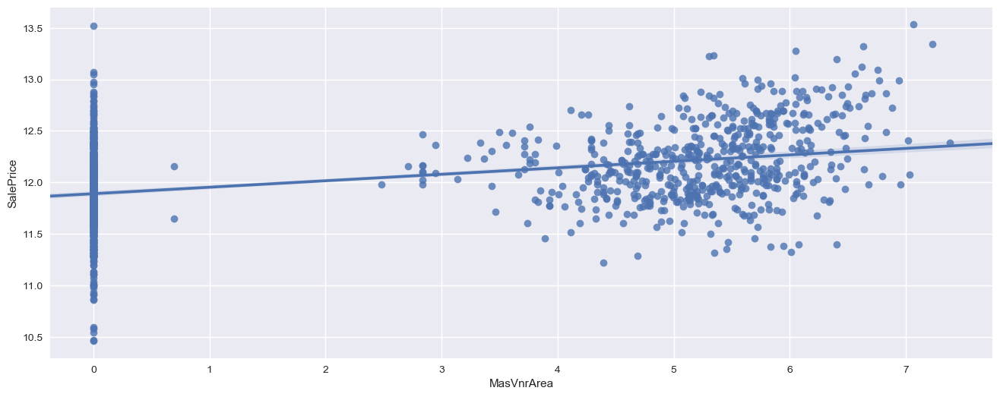

In [124]:
sns.regplot(x="MasVnrArea", y="SalePrice", data=house);
sns.set(font_scale=1.00)

- The six parameters which have less collinearity with Sale Price doesn’t look so good to take for the regression model
- Because of its outliers and some data’s, we shall keep it aside, later in the model we shall try to include them and see the   
  Outcome.

- Lets see what these three __'GarageYrBlt','YearBuilt','YearRemodAdd',__ parameters which were modified by our function can give us with respect to Sale Price

In [125]:
house[['SalePrice', 'GarageYrBlt', 'YearBuilt', 'YearRemodAdd']].corr()

,SalePrice,GarageYrBlt,YearBuilt,YearRemodAdd
SalePrice,1.000000,-0.513165,-0.571005,-0.470271
GarageYrBlt,-0.513165,1.000000,0.826165,0.579155
YearBuilt,-0.571005,0.826165,1.000000,0.620965
YearRemodAdd,-0.470271,0.579155,0.620965,1.000000


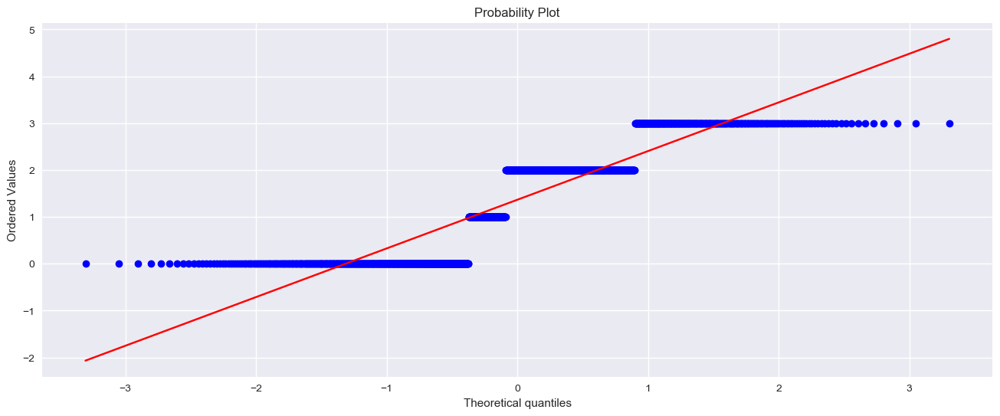

In [126]:
res = stats.probplot(house['GarageYrBlt'], plot=plt)

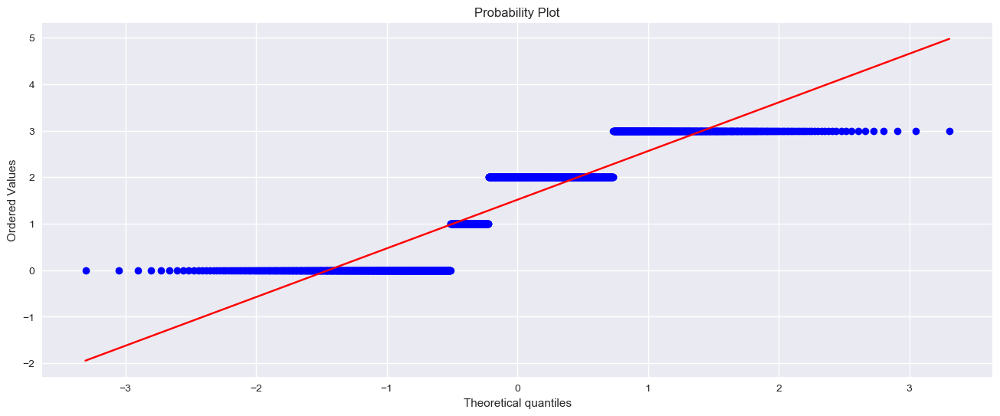

In [127]:
res = stats.probplot(house['YearBuilt'], plot=plt)

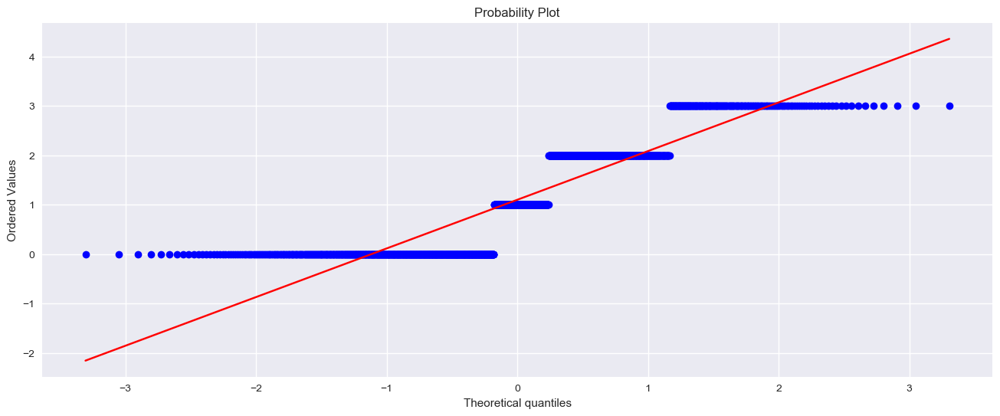

In [128]:
res = stats.probplot(house['YearRemodAdd'], plot=plt)

<Figure size 2000x2000 with 0 Axes>

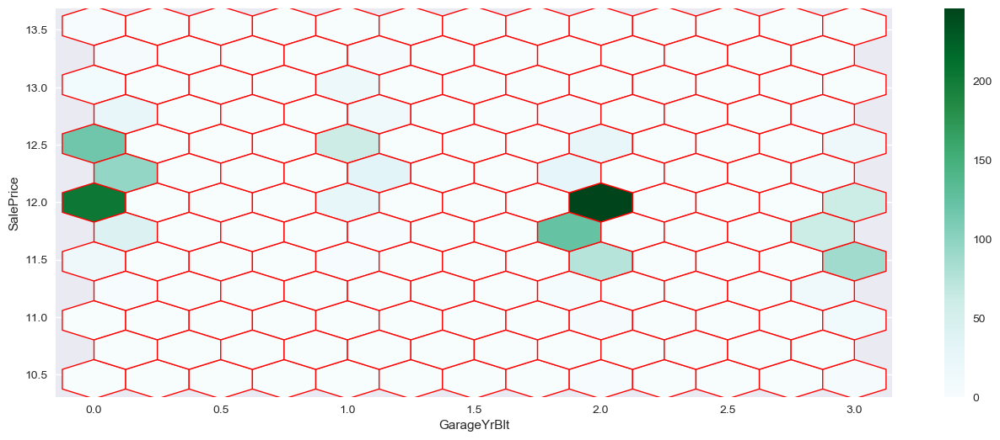

In [129]:
plt.figure(figsize=(20, 20))
house.plot.hexbin(x='GarageYrBlt', y='SalePrice', gridsize=12, color= 'red')

<Figure size 2000x2000 with 0 Axes>

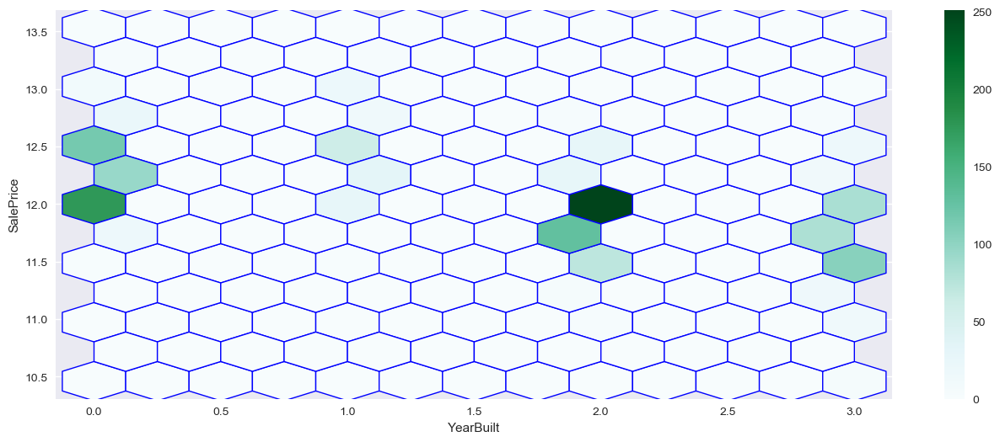

In [130]:
plt.figure(figsize=(20, 20))
house.plot.hexbin(x='YearBuilt', y='SalePrice', gridsize=12, color= 'blue')

<Figure size 2000x2000 with 0 Axes>

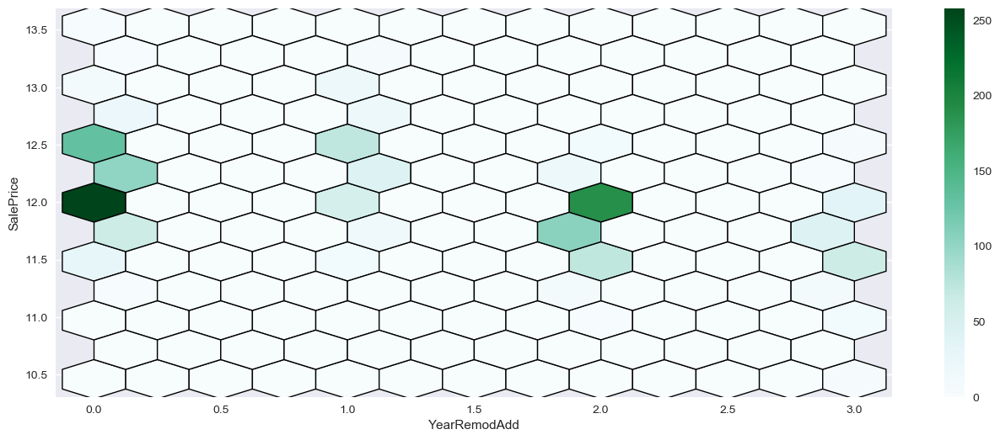

In [131]:
plt.figure(figsize=(20, 20))
house.plot.hexbin(x='YearRemodAdd', y='SalePrice', gridsize=12, color= 'black')

- Above three parameters are having good negative correlation, but due to multicorrelation we shall see how it will affect the   
  output.

#### [Back to Index](#Index)

<a id=section7><a/>

## 7  Conclusion for EDA:

- Overall Quality parameter has highest correlation with SalePrice , but same time it has multicorrelation with many other parameters, we can include this in set of input parameters and compare the results and decide. 
- surprisingly Height of the basement and Exterior material quality has some impact on SalePrice. 
- Negative correlated and Positive correlation parameters with respect to Sale Price, we can see there are many negative and positive correlated parameters in the data set, we can use them effectively in Model building. we shall have a threshold like 0.5 for positive parameters and -0.5 for negative parameters. 
- Other parameters with very less correlation and also very less Multicorrelation can be considered , but will see if they can do any effect on the Model accuracy.

#### [Back to Index](#Index)

<a id=section8><a/>

## 8  Machine Learning Data Model

We are going to use bunch of Algorithms to get the best prediction possible. I will use the following Algorithms.

- __Linear Regression__
  - Hyper-parameter optimizers - __GridSearchCV__
- __Decision Tree Regressor__
  - Hyper-parameter optimizers - __GridSearchCV__
- __Random Forest Regressor__
  - Hyper-parameter optimizers - __RandomizedsearchCV__

#### [Back to Index](#Index)

<a id=section801><a/>

## 8.1 Linear Regression

#### [Back to Index](#Index)

<a id=section8011><a/>

### 8.1.1 Introduction to Linear Regression

__Linear regression__ is a _basic_ and _commonly_ used type of __predictive analysis__.  The overall idea of regression is to examine two things: 
- Does a set of __predictor variables__ do a good job in predicting an __outcome__ (dependent) variable?  
- Which variables in particular are __significant predictors__ of the outcome variable, and in what way they do __impact__ the outcome variable?  

These regression estimates are used to explain the __relationship between one dependent variable and one or more independent variables__.  The simplest form of the regression equation with one dependent and one independent variable is defined by the formula :<br/>
$y = \beta_0 + \beta_1x$


What does each term represent?
- $y$ is the response
- $x$ is the feature
- $\beta_0$ is the intercept
- $\beta_1$ is the coefficient for x


Three major uses for __regression analysis__ are: 
- determining the __strength__ of predictors,
    - Typical questions are what is the strength of __relationship__ between _dose and effect_, _sales and marketing spending_, or _age and income_.
- __forecasting__ an effect, and
    - how much __additional sales income__ do I get for each additional $1000 spent on marketing?
- __trend__ forecasting.
    - what will the __price of house__ be in _6 months_?

#### [Back to Index](#Index)

<a id=section8012><a/>

### 8.1.2 Assumptions of Linear Regression

1. There should be a linear and additive relationship between dependent (response) variable and independent (predictor) variable(s). A linear relationship suggests that a change in response Y due to one unit change in X¹ is constant, regardless of the value of X¹. An additive relationship suggests that the effect of X¹ on Y is independent of other variables.
2. There should be no correlation between the residual (error) terms. Absence of this phenomenon is known as Autocorrelation.
3. The independent variables should not be correlated. Absence of this phenomenon is known as multicollinearity.
4. The error terms must have constant variance. This phenomenon is known as homoskedasticity. The presence of non-constant variance is referred to heteroskedasticity.
5. The error terms must be normally distributed.

To apply any machine learning algorithm on your dataset, basically there are 4 steps:
1. Load the algorithm
2. Instantiate and Fit the model to the training dataset
3. Prediction on the test set
4. Calculating Root mean square error 

#### [Back to Index](#Index)

<a id=section8013><a/>

### 8.1.3 Modeling with 'Set A' Data

__Set A : We shall first use All the parameters except 'SalePrice', this will be raw data no normalization no log conversion. lets see what will the Coeeficient this data will produce, how is prediction level and lets calculate Regression Evaluation Metrics.****__

__Preparin X and y using pandas__

In [298]:
all_numcol = ['Id', 'MSSubClass', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'LotFrontage', 'MasVnrArea', 'GarageYrBlt']

In [299]:
all_numcol

['Id',
 'MSSubClass',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold',
 'LotFrontage',
 'MasVnrArea',
 'GarageYrBlt']

In [300]:
houseone["LotFrontage"] = houseone["LotFrontage"].fillna(0)
houseone["MasVnrArea"] = houseone["MasVnrArea"].fillna(0)
houseone["GarageYrBlt"] = houseone["GarageYrBlt"].fillna(0)

__Splitting X and y into training and test datasets.__

In [301]:
from sklearn.linear_model import LinearRegression #From Scikit Learn importing Linear regression model
from sklearn.model_selection import train_test_split
# separating our independent and dependent variable
X = houseone[all_numcol]
y = houseone["SalePrice"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)
linreg_SetA = LinearRegression()
linreg_SetA.fit(X_train, y_train)

print('Intercept:',linreg_SetA.intercept_)                                           # print the intercept 
print('Coefficients:',linreg_SetA.coef_)

Intercept: 895353.9558264152
Coefficients: [-1.67203110e+00 -1.42541911e+02  4.58312220e-01  1.69105151e+04
  5.40743235e+03  3.44168888e+02  1.38914348e+02  8.04753265e+00
  3.71471077e-01  3.20855551e-01  8.73985928e+00  1.30294969e+01
  9.88294400e+00  1.75824774e+00  2.46706886e+01  8.42333212e+03
  3.26616097e+03  5.06429162e+03 -9.45307113e+02 -1.00390198e+04
 -1.99034293e+04  7.28531481e+03  4.13872648e+03  1.63030446e+04
  5.78039948e+00  3.57085558e+01  6.49261375e+00  3.20838544e+01
  1.20791503e+01  7.50742608e+01 -1.34674894e+02 -2.12468593e-01
 -4.56157077e+01 -9.41684026e+02 -1.12271684e+01  2.60435872e+01
 -1.41931593e+01]


In [302]:
X_train.columns

Index(['Id', 'MSSubClass', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars',
       'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'LotFrontage',
       'MasVnrArea', 'GarageYrBlt'],
      dtype='object')

__Calculating the Coeficients__

In [303]:
discoff = pd.DataFrame(linreg_SetA.coef_, X_train.columns, columns=["Coefficients"])

In [304]:
discoff

,Coefficients
Id,-1.672031
MSSubClass,-142.541911
LotArea,0.458312
OverallQual,16910.515060
OverallCond,5407.432346
YearBuilt,344.168888
YearRemodAdd,138.914348
BsmtFinSF1,8.047533
BsmtFinSF2,0.371471
BsmtUnfSF,0.320856


In [305]:
predictions = linreg_SetA.predict(X_test)

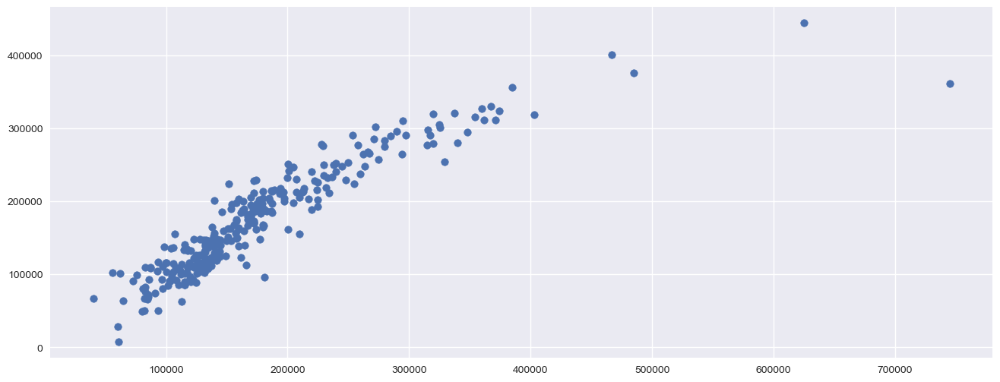

In [306]:
plt.scatter(y_test,predictions)

__Regression Evaluation Metrics__

In [141]:
from sklearn import metrics

In [142]:
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 21390.071809419187
MSE: 1271067323.4373705
RMSE: 35652.03112639405


__Model Evaluation using Rsquared value__

- There is one more method to evaluate linear regression model and that is by using the __Rsquared__ value.<br/>
- R-squared is the **proportion of variance explained**, meaning the proportion of variance in the observed data that is explained by the model, or the reduction in error over the **null model**. (The null model just predicts the mean of the observed response, and thus it has an intercept and no slope.)

- R-squared is between 0 and 1, and higher is better because it means that more variance is explained by the model. But there is one shortcoming of Rsquare method and that is **R-squared will always increase as you add more features to the model**, even if they are unrelated to the response. Thus, selecting the model with the highest R-squared is not a reliable approach for choosing the best linear model.

There is alternative to R-squared called **adjusted R-squared** that penalizes model complexity (to control for overfitting).

In [307]:
yhat = linreg_SetA.predict(X_train)
SS_Residual = sum((y_train-yhat)**2)
SS_Total = sum((y_train-np.mean(y_train))**2)
r_squared = 1 - (float(SS_Residual))/SS_Total
adjusted_r_squared = 1 - (1-r_squared)*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
print(r_squared, adjusted_r_squared)

0.8073824068185942 0.8010754590772561


In [308]:
yhat = linreg_SetA.predict(X_test)
SS_Residual = sum((y_test-yhat)**2)
SS_Total = sum((y_test-np.mean(y_test))**2)
r_squared = 1 - (float(SS_Residual))/SS_Total
adjusted_r_squared = 1 - (1-r_squared)*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1)
print(r_squared, adjusted_r_squared)

0.8217782648666077 0.7958168310085938


#### [Back to Index](#Index)

<a id=section8014><a/>

### 8.1.4 Modeling with 'Set B' Data

__Set B : Now lets see what will be the result with filtered and processed data set. lets see what will the Coeeficient this data will produce, how is prediction level and lets calculate Regression Evaluation Metrics..****__

In [309]:
input_var = ['OverallQual', 'GrLivArea', 'GarageCars', '1stFlrSF', 'EnclosedPorch', 'LotShape', 'BsmtExposure', 'GarageFinish', 'HeatingQC', 'GarageType', 'YearBuilt', 'BsmtQual', 'ExterQual']
X = house[input_var]
y = house["SalePrice"]

In [310]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)
linreg_SetB = LinearRegression()
linreg_SetB.fit(X_train, y_train)

print('Intercept:',linreg_SetB.intercept_)                                           # print the intercept 
print('Coefficients:',linreg_SetB.coef_)

Intercept: 8.01892827297538
Coefficients: [ 0.08961824  0.34121924  0.07898908  0.16153886 -0.00451835 -0.01747998
 -0.02903232 -0.00448155 -0.01259685 -0.01539644 -0.01830099 -0.00573925
 -0.03155114]


__Calculating the Coeficients__

In [311]:
discoff = pd.DataFrame(linreg_SetB.coef_, X_train.columns, columns=["Coefficients"])

In [312]:
discoff

,Coefficients
OverallQual,0.089618
GrLivArea,0.341219
GarageCars,0.078989
1stFlrSF,0.161539
EnclosedPorch,-0.004518
LotShape,-0.017480
BsmtExposure,-0.029032
GarageFinish,-0.004482
HeatingQC,-0.012597
GarageType,-0.015396


In [313]:
predictions = linreg_SetB.predict(X_test)

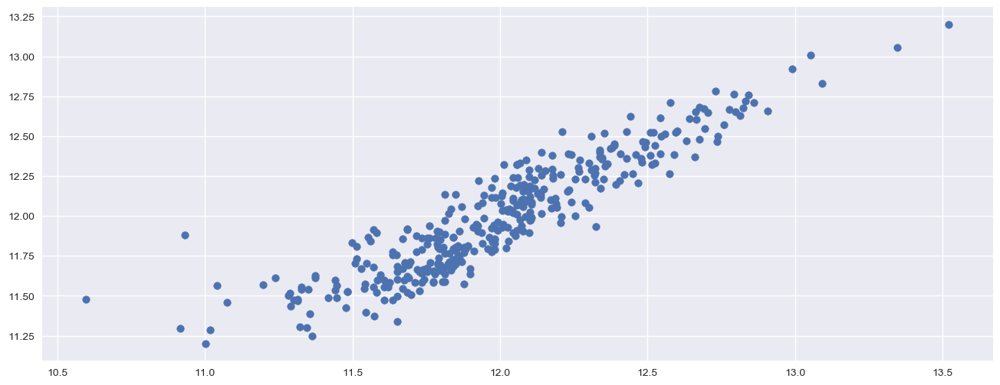

In [314]:
plt.scatter(y_test,predictions)

__Regression Evaluation Metrics__

In [315]:
from sklearn import metrics

In [316]:
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 0.12474512444157672
MSE: 0.026966218087775433
RMSE: 0.16421393999224132


__Model Evaluation using Rsquared value__

- There is one more method to evaluate linear regression model and that is by using the __Rsquared__ value.<br/>
- R-squared is the **proportion of variance explained**, meaning the proportion of variance in the observed data that is explained by the model, or the reduction in error over the **null model**. (The null model just predicts the mean of the observed response, and thus it has an intercept and no slope.)

- R-squared is between 0 and 1, and higher is better because it means that more variance is explained by the model. But there is one shortcoming of Rsquare method and that is **R-squared will always increase as you add more features to the model**, even if they are unrelated to the response. Thus, selecting the model with the highest R-squared is not a reliable approach for choosing the best linear model.

There is alternative to R-squared called **adjusted R-squared** that penalizes model complexity (to control for overfitting).

In [317]:
yhat = linreg_SetB.predict(X_train)
SS_Residual = sum((y_train-yhat)**2)
SS_Total = sum((y_train-np.mean(y_train))**2)
r_squared = 1 - (float(SS_Residual))/SS_Total
adjusted_r_squared = 1 - (1-r_squared)*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
print(r_squared, adjusted_r_squared)

0.8300659518222753 0.8280223416221731


In [318]:
yhat = linreg_SetB.predict(X_test)
SS_Residual = sum((y_test-yhat)**2)
SS_Total = sum((y_test-np.mean(y_test))**2)
r_squared = 1 - (float(SS_Residual))/SS_Total
adjusted_r_squared = 1 - (1-r_squared)*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1)
print(r_squared, adjusted_r_squared)

0.8391013304227991 0.8331421204384584


#### [Back to Index](#Index)

<a id=section8015><a/>

### 8.1.5 Modeling with 'Set C' Data : Feature Selection

__Set C : Hope we all remember 'GarageArea', 'FullBath', 'TotRmsAbvGrd'(PositiveCorr) and 'BsmtQual', 'ExterQual' (NegetiveCorr) variables which had Multicorrelation between many other parameters, we shall remove 'BsmtQual', 'ExterQual' columns and add 'GarageArea', 'FullBath', 'TotRmsAbvGrd' see the results compared to above.__

In [321]:
input_var = ['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'FullBath', 'TotRmsAbvGrd', '1stFlrSF', 'EnclosedPorch', 'LotShape', 'BsmtExposure', 'GarageFinish', 'HeatingQC', 'GarageType', 'YearBuilt']
X = house[input_var]
y = house["SalePrice"]

In [322]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)
linreg_SetC = LinearRegression()
linreg_SetC.fit(X_train, y_train)

print('Intercept:',linreg_SetC.intercept_)                                           # print the intercept 
print('Coefficients:',linreg_SetC.coef_)

Intercept: 7.790906820075545
Coefficients: [ 9.75120498e-02  3.59442572e-01  6.22365857e-02  9.17001274e-05
 -4.64470925e-03 -4.13270640e-03  1.59604964e-01 -4.85409769e-03
 -1.75075306e-02 -2.93511057e-02 -8.79921039e-03 -1.50449032e-02
 -1.34705973e-02 -2.23452475e-02]


__Calculating the Coeficients__

In [323]:
discoff = pd.DataFrame(linreg_SetC.coef_, X_train.columns, columns=["Coefficients"])

In [324]:
discoff

,Coefficients
OverallQual,0.097512
GrLivArea,0.359443
GarageCars,0.062237
GarageArea,0.000092
FullBath,-0.004645
TotRmsAbvGrd,-0.004133
1stFlrSF,0.159605
EnclosedPorch,-0.004854
LotShape,-0.017508
BsmtExposure,-0.029351


In [325]:
predictions = linreg_SetC.predict(X_test)

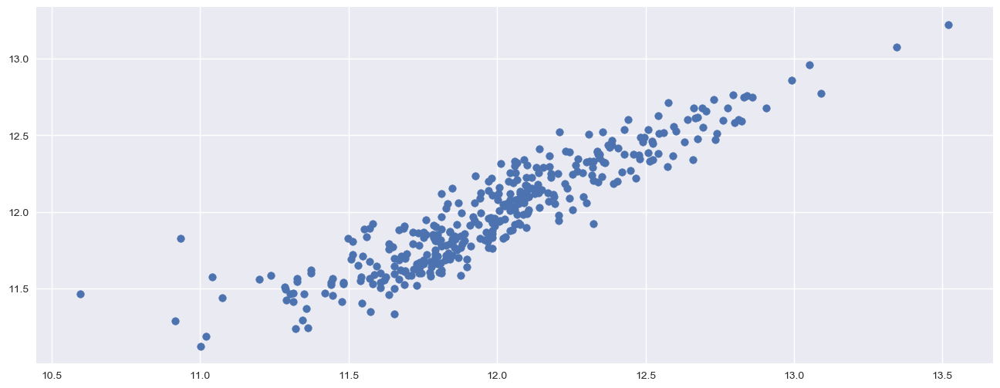

In [326]:
plt.scatter(y_test,predictions)

__Regression Evaluation Metrics__

In [327]:
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 0.12169775134916483
MSE: 0.025952426841223113
RMSE: 0.16109756932127534


__Model Evaluation using Rsquared value__

- There is one more method to evaluate linear regression model and that is by using the __Rsquared__ value.<br/>
- R-squared is the **proportion of variance explained**, meaning the proportion of variance in the observed data that is explained by the model, or the reduction in error over the **null model**. (The null model just predicts the mean of the observed response, and thus it has an intercept and no slope.)

- R-squared is between 0 and 1, and higher is better because it means that more variance is explained by the model. But there is one shortcoming of Rsquare method and that is **R-squared will always increase as you add more features to the model**, even if they are unrelated to the response. Thus, selecting the model with the highest R-squared is not a reliable approach for choosing the best linear model.

There is alternative to R-squared called **adjusted R-squared** that penalizes model complexity (to control for overfitting).

In [328]:
yhat = linreg_SetC.predict(X_train)
SS_Residual = sum((y_train-yhat)**2)
SS_Total = sum((y_train-np.mean(y_train))**2)
r_squared = 1 - (float(SS_Residual))/SS_Total
adjusted_r_squared = 1 - (1-r_squared)*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
print(r_squared, adjusted_r_squared)

0.8287869246242385 0.8265674958693676


In [329]:
yhat = linreg_SetC.predict(X_test)
SS_Residual = sum((y_test-yhat)**2)
SS_Total = sum((y_test-np.mean(y_test))**2)
r_squared = 1 - (float(SS_Residual))/SS_Total
adjusted_r_squared = 1 - (1-r_squared)*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1)
print(r_squared, adjusted_r_squared)

0.845150293694858 0.8389563054426523


### Observation and Conclusion

- We have Trained the Model with three different set of input variables, first is all Numerical variables with no Normalization   or Log conversion. second set is the shortlisted Variable after all the Data manipulation, Third set is the variables with       very less Multicorrelation.
- In first set we can see the prediction vs test data distribution plot, the data is tightly packed but the distribtuion is       slightly curved.
- In second and third set the distribution looks like perfect linear distribution with few outliers.
- __Regression Evaluation Metrics__ First set seems good but second looks better with very less RMSE value, but look at the       third set RMSE which is lesser than the second set as shown below.

- Regression Evaluation Metrics : Set B
  - __MAE: 0.12474512444157672__
  - __MSE: 0.026966218087775433__
  - __RMSE: 0.16421393999224132__

- Regression Evaluation Metrics : Set C
  - __MAE: 0.12169775134916483__
  - __MSE: 0.025952426841223113__
  - __RMSE: 0.16109756932127534__


- __Model Evaluation using Rsquared value__ I think below results clearly say that Set C has better RMSC compared to Set A and     Set B.

  - Set A:
    - __Train:r_squared - 0.8073824068185942, adjusted_r_squared - 0.8010754590772561__
    - __Test: r_squared - 0.8217782648666077, adjusted_r_squared - 0.7958168310085938__
  - Set B:
    - __Train:r_squared - 0.8316585638290496, adjusted_r_squared - 0.8297621698340562__
    - __Test: r_squared - 0.836764168360782, adjusted_r_squared - 0.8291308381042719__

  - Set C:
    - __Train: r_squared - 0.8287869246242385, adjusted_r_squared - 0.8265674958693676__
    - __Test: r_squared - 0.845150293694858, adjusted_r_squared - 0.8389563054426523__


- With all these data we can see that Linear regression model is giving some good results with the parameters we have selected.
- Lets not stop here , we shall put some __Grid search__ and see what results we will get.

#### [Back to Index](#Index)

<a id=section8016><a/>

### 8.1.6 Hyper-parameter optimizers - GridSearchCV

__Set A__

In [347]:
# separating our independent and dependent variable
X = houseone[all_numcol]
y = houseone["SalePrice"]

In [348]:
# Grid Search for Algorithm Tuning
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)
parameters = {'normalize':[True,False], 'copy_X':[True, False]}


# create and fit a ridge regression model, testing each alpha
model = LinearRegression()
linreg_grid_SetA = GridSearchCV(estimator=model, param_grid=parameters)
linreg_grid_SetA.fit(X_train, y_train)

print(linreg_grid_SetA)

GridSearchCV(cv=None, error_score='raise',
       estimator=LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'normalize': [True, False], 'copy_X': [True, False]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)


In [349]:
print(linreg_grid_SetA.best_score_)

0.7547283500555925


In [350]:
y_pred_test = linreg_grid_SetA.predict(X_test)

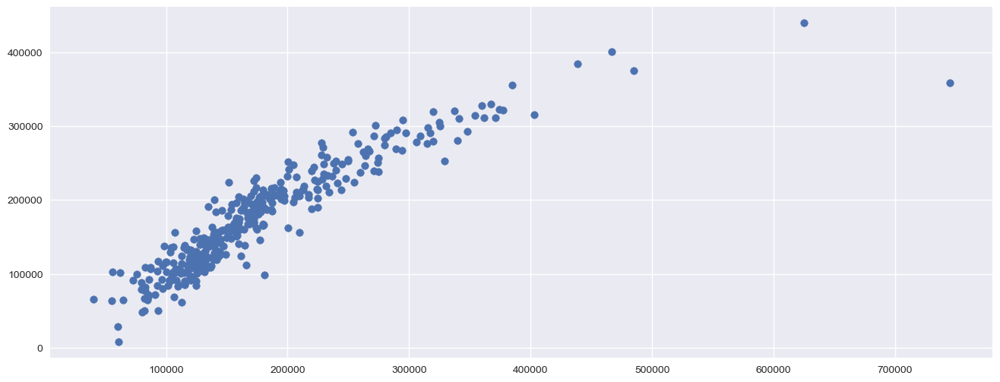

In [351]:
plt.scatter(y_test,y_pred_test)

In [352]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred_test))
print('MSE:', metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_test)))

MAE: 20785.82588750693
MSE: 1131823758.504402
RMSE: 33642.58846320244


__Model Evaluation using Rsquared value__

In [353]:
yhat = linreg_grid_SetA.predict(X_train)
SS_Residual = sum((y_train-yhat)**2)
SS_Total = sum((y_train-np.mean(y_train))**2)
r_squared = 1 - (float(SS_Residual))/SS_Total
adjusted_r_squared = 1 - (1-r_squared)*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
print(r_squared, adjusted_r_squared)

0.802327970237952 0.7954085141346448


In [354]:
yhat = linreg_grid_SetA.predict(X_test)
SS_Residual = sum((y_test-yhat)**2)
SS_Total = sum((y_test-np.mean(y_test))**2)
r_squared = 1 - (float(SS_Residual))/SS_Total
adjusted_r_squared = 1 - (1-r_squared)*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1)
print(r_squared, adjusted_r_squared)

0.8314039457556492 0.8123273279971142


__Set B__

In [357]:
input_var = ['OverallQual', 'GrLivArea', 'GarageCars', '1stFlrSF', 'EnclosedPorch', 'LotShape', 'BsmtExposure', 'GarageFinish', 'HeatingQC', 'GarageType', 'YearBuilt', 'BsmtQual', 'ExterQual']
X = house[input_var]
y = house["SalePrice"]

In [358]:
# Grid Search for Algorithm Tuning
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)
parameters = {'normalize':[True,False], 'copy_X':[True, False]}


# create and fit a ridge regression model, testing each alpha
model = LinearRegression()
linreg_grid_SetB = GridSearchCV(estimator=model, param_grid=parameters)
linreg_grid_SetB.fit(X_train, y_train)

print(linreg_grid_SetB)

GridSearchCV(cv=None, error_score='raise',
       estimator=LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'normalize': [True, False], 'copy_X': [True, False]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)


In [359]:
# summarize the results of the grid search
print(linreg_grid_SetB.best_score_)

0.8271265023714369


In [360]:
y_pred_test = linreg_grid_SetB.predict(X_test)

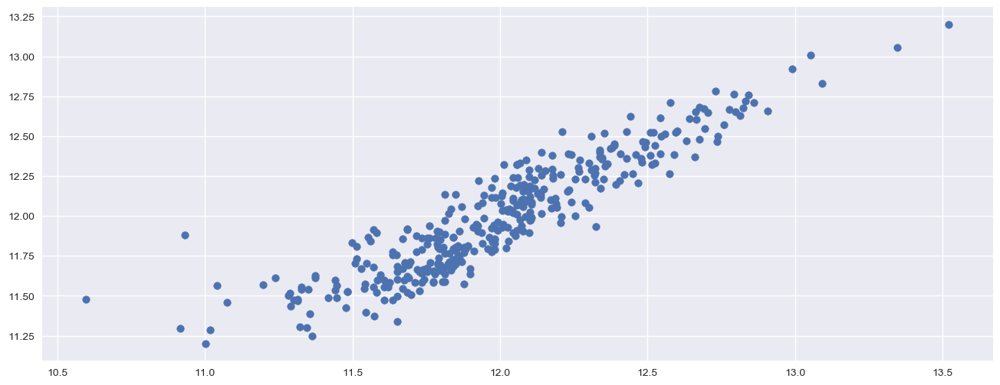

In [361]:
plt.scatter(y_test,y_pred_test)

In [362]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred_test))
print('MSE:', metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_test)))

MAE: 0.12474512444157679
MSE: 0.0269662180877755
RMSE: 0.16421393999224151


__Model Evaluation using Rsquared value__

In [364]:
yhat = linreg_grid_SetB.predict(X_train)
SS_Residual = sum((y_train-yhat)**2)
SS_Total = sum((y_train-np.mean(y_train))**2)
r_squared = 1 - (float(SS_Residual))/SS_Total
adjusted_r_squared = 1 - (1-r_squared)*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
print(r_squared, adjusted_r_squared)

0.830065951822275 0.8280223416221729


In [365]:
yhat = linreg_grid_SetB.predict(X_test)
SS_Residual = sum((y_test-yhat)**2)
SS_Total = sum((y_test-np.mean(y_test))**2)
r_squared = 1 - (float(SS_Residual))/SS_Total
adjusted_r_squared = 1 - (1-r_squared)*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1)
print(r_squared, adjusted_r_squared)

0.8391013304227987 0.8331421204384579


__Set C__

In [367]:
input_var = ['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'FullBath', 'TotRmsAbvGrd', '1stFlrSF', 'EnclosedPorch', 'LotShape', 'BsmtExposure', 'GarageFinish', 'HeatingQC', 'GarageType', 'YearBuilt']
X = house[input_var]
y = house["SalePrice"]

In [368]:
# Grid Search for Algorithm Tuning
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)
parameters = {'normalize':[True,False], 'copy_X':[True, False]}


# create and fit a ridge regression model, testing each alpha
model = LinearRegression()
linreg_grid_SetC = GridSearchCV(estimator=model, param_grid=parameters)
linreg_grid_SetC.fit(X_train, y_train)

print(linreg_grid_SetC)

GridSearchCV(cv=None, error_score='raise',
       estimator=LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'normalize': [True, False], 'copy_X': [True, False]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)


In [369]:
# summarize the results of the grid search
print(linreg_grid_SetC.best_score_)

0.8247063573556068


In [370]:
y_pred_test = linreg_grid_SetC.predict(X_test) 

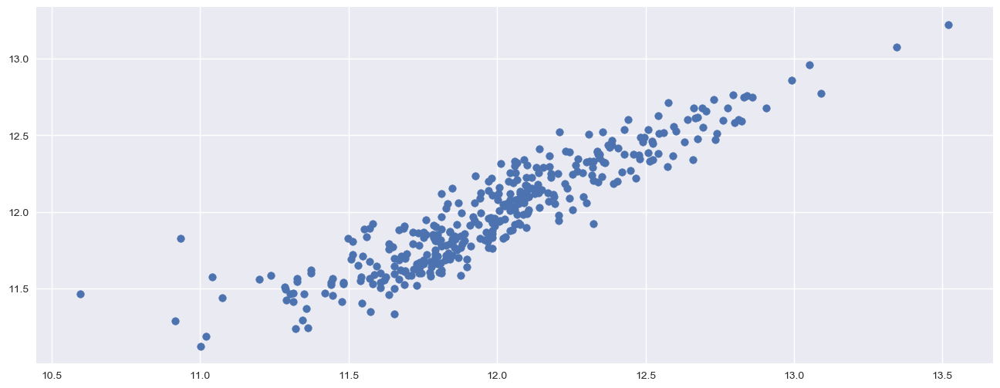

In [371]:
plt.scatter(y_test,y_pred_test)

In [372]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred_test))
print('MSE:', metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_test)))

MAE: 0.12169775134916455
MSE: 0.02595242684122316
RMSE: 0.16109756932127547


__Model Evaluation using Rsquared value__

In [373]:
yhat = linreg_grid_SetC.predict(X_train)
SS_Residual = sum((y_train-yhat)**2)
SS_Total = sum((y_train-np.mean(y_train))**2)
r_squared = 1 - (float(SS_Residual))/SS_Total
adjusted_r_squared = 1 - (1-r_squared)*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
print(r_squared, adjusted_r_squared)

0.8287869246242385 0.8265674958693676


In [374]:
yhat = linreg_grid_SetC.predict(X_test)
SS_Residual = sum((y_test-yhat)**2)
SS_Total = sum((y_test-np.mean(y_test))**2)
r_squared = 1 - (float(SS_Residual))/SS_Total
adjusted_r_squared = 1 - (1-r_squared)*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1)
print(r_squared, adjusted_r_squared)

0.8451502936948576 0.8389563054426519


### __Observation and Conclusion__

- We have Trained the Model with three different set of input variables, first is all Numerical variables with no Normalization   or Log conversion. second set is the shortlisted Variable after all the Data manipulation, Third set is the variables with       very less Multicorrelation.
- __Regression Evaluation Metrics__ Compared to Random Search Results, Grid Search results looks not improvised as shown below.

- Regression Evaluation Metrics : Set B - Normal Search
  - __MAE: 0.12474512444157672__
  - __MSE: 0.026966218087775433__
  - __RMSE: 0.16421393999224132__
 
- Regression Evaluation Metrics : Set B - Grid Search CV
  - __MAE: 0.12474512444157679__
  - __MSE: 0.0269662180877755__
  - __RMSE: 0.16421393999224151__

- Regression Evaluation Metrics : Set C  - Normal Search
  - __MAE: 0.12169775134916483__
  - __MSE: 0.025952426841223113__
  - __RMSE: 0.16109756932127534__

- Regression Evaluation Metrics : Set C  - Grid Search CV
  - __MAE: 0.12169775134916455__
  - __MSE: 0.02595242684122316__
  - __RMSE: 0.16109756932127547__

- __Model Evaluation using Rsquared value__ I think below results clearly say that Set C has better Rsquared values compared to   Set A and Set B. Lets compare them with grid search Rsquared Values.

  - Set A: Random Search
    - __Train:r_squared - 0.8073824068185942, adjusted_r_squared - 0.8010754590772561__
    - __Test: r_squared - 0.8217782648666077, adjusted_r_squared - 0.7958168310085938__
    
  - Set A: Grid Search CV
    - __Train:r_squared - 0.802327970237952, adjusted_r_squared - 0.7954085141346448__
    - __Test: r_squared - 0.8314039457556492, adjusted_r_squared - 0.8123273279971142__

  - Set B: Random Search
    - __Train:r_squared - 0.8316585638290496, adjusted_r_squared - 0.8297621698340562__
    - __Test: r_squared - 0.836764168360782, adjusted_r_squared - 0.8291308381042719__
    
  - Set B: Grid Search CV
    - __Train:r_squared - 0.8300659518222753, adjusted_r_squared - 0.8280223416221731__
    - __Test: r_squared - 0.8391013304227986, adjusted_r_squared - 0.8331421204384577__

  - Set C: Random Search
    - __Train: r_squared - 0.8306196689459573, adjusted_r_squared - 0.8285630127145985__
    - __Test: r_squared - 0.8429324803004361, adjusted_r_squared - 0.8349940497019022__
    
  - Set C: Grid Search CV
    - __Train: r_squared - 0.8287869246242383, adjusted_r_squared - 0.8265674958693673__
    - __Test: r_squared - 0.8451502936948576, adjusted_r_squared - 0.8389563054426519__
    
- With all these data we can see that Linear regression model with __normal or Grid Search__ is giving some good results with     the parameters we have selected.
- Lets see if any other model can give better result than this.

#### [Back to Index](#Index)

<a id=section802><a/>

## 8.2 Decision Tree Regressor

<a id=section8021><a/>

### 8.2.1 Introduction of Decision Tree

A decision tree is one of most frequently and widely used supervised machine learning algorithms that can perform both regression and classification tasks.
The intuition behind the decision tree algorithm is simple, yet also very powerful.

Everyday we need to make numerous decisions, many smalls and a few big.
So, Whenever you are in a dilemna, if you'll keenly observe your thinking process. You'll find that, you are unconsciously using decision tree approcah or you can also say that decision tree approach is based on our thinking process. 

- A decision tree __split the data into multiple sets__.Then each of these sets is further split into subsets to arrive at a __decision__.<br/>
- It is a very natural decision making process asking a series of question in a nested if then else statement.
- On each node you ask a question to further split the data held by the node. <br/>

Decision tree is a type of __supervised learning algorithm__ (having a pre-defined target variable) that is mostly used in classification problems.
- It works for both __categorical and continuous__ input and output variables.
- In this technique, we __split the population__ or sample into two or more homogeneous sets (or sub-populations) based on most __significant splitter / differentiator__ in input variables.

Let’s look at the basic terminology used with Decision trees:

- __Root Node__: <br/>It represents entire population or sample and this further gets divided into two or more homogeneous sets.
- __Splitting__: <br/>It is a process of dividing a node into two or more sub-nodes.
- __Decision Node__:<br/> When a sub-node splits into further sub-nodes, then it is called decision node.
- __Leaf/ Terminal Node__:<br/> Nodes do not split is called Leaf or Terminal node.
- __Pruning__:<br/> When we remove sub-nodes of a decision node, this process is called pruning. You can say opposite process of splitting.
- __Branch / Sub-Tree__:<br/> A sub section of entire tree is called branch or sub-tree.
- __Parent and Child Node__:<br/> A node, which is divided into sub-nodes is called parent node of sub-nodes where as sub-nodes are the child of parent node.

#### [Back to Index](#Index)

<a id=section8022><a/>

### 8.2.2 Types of Decision Trees

Types of decision tree is based on the __type of target variable__ we have. It can be of two types:

- __Categorical Variable Decision Tree__: <br/>
 - Decision Tree which has __categorical target variable__ then it called as categorical variable decision tree.
- __Continuous Variable Decision Tree__:<br/>
 - Decision Tree has __continuous target variable__ then it is called as Continuous Variable Decision Tree.<br/>
 
__Example__:<br/>
- Let’s say we have a problem to predict whether a customer will pay his renewal premium with an insurance company (__Yes/ No__).<br/> For this we are predicting values for categorical variable. So, the decision tree approach that will be used is __Categorical Variable Decision Tree.__ <br/>
- Now, suppose insurance company does not have income details for all customers. But, we know that this is an important variable, then we can build a decision tree to predict customer income based on occupation, product and various other variables.<br/> In this case, we are predicting values for continuous variable. So , This approach is called __Continuous Variable Decision Tree__.

#### [Back to Index](#Index)

<a id=section8023><a/>

### 8.2.3 Advantages of using Decision Tree

- __Easy to Understand__: 
 - Decision tree output is very easy to understand even for people from non-analytical background. It does not require any statistical knowledge to read and interpret them. 
 - Its graphical representation is very intuitive and users can easily relate their hypothesis.
- __Less data cleaning required__: 
 - It requires less data cleaning compared to some other modeling techniques.
 - It is not influenced by outliers and missing values to a fair degree.
- __Data type is not a constraint__: 
 - It can handle both numerical and categorical variables.
- __Non Parametric Method__: 
 - Decision tree is considered to be a non-parametric method. This means that decision trees have no assumptions about the space distribution and the classifier structure.

#### [Back to Index](#Index)

<a id=section8024><a/>

### 8.2.4 Shortcomings of Decision Trees

- __Over fitting__:
 - Over fitting is one of the most practical difficulty for decision tree models. This problem gets solved by setting constraints on model parameters and pruning (discussed in detailed below).
- __Not a great contributor for regression__:
 - While working with continuous numerical variables, decision tree looses information when it categorizes variables in different categories.

#### [Back to Index](#Index)

<a id=section8025><a/>

### 8.2.5 Preparing X and y using pandas

In [182]:
house = pd.read_csv('../RawData/house_data_CleanLogCatDrop.csv')

In [183]:
X = house.drop('SalePrice',axis=1)
y = house['SalePrice']

#### [Back to Index](#Index)

<a id=section8026><a/>

### 8.2.6 Splitting X and y into training and test datasets.

In [184]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [185]:
print(X_train.shape)
print(y_train.shape)

(1095, 75)
(1095,)


#### [Back to Index](#Index)

<a id=section8027><a/>

### 8.2.7 Decision Tree in scikit-learn

In [186]:
from sklearn.tree import DecisionTreeRegressor
DT_model = DecisionTreeRegressor()
DT_model.fit(X_train, y_train)

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

__Using the Model for Prediction__

In [187]:
y_pred_train = DT_model.predict(X_train)

In [188]:
y_pred_test = DT_model.predict(X_test)

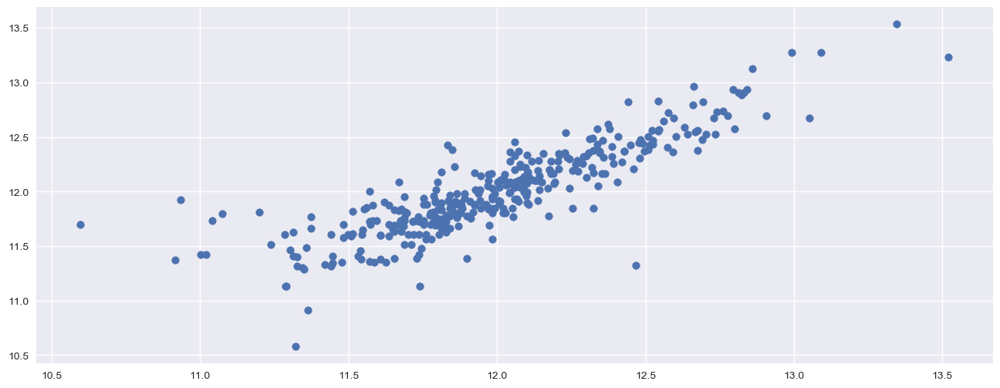

In [189]:
plt.scatter(y_test,y_pred_test)

__Regression Evaluation Metrics__

In [190]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred_test))
print('MSE:', metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_test)))

MAE: 0.1440586787010502
MSE: 0.04406135203678032
RMSE: 0.20990796087042607


__Lets give a try with Set C parameters of Linear Regression  model and see the results.__

In [191]:
input_var = ['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'FullBath', 'TotRmsAbvGrd', '1stFlrSF', 'EnclosedPorch', 'LotShape', 'BsmtExposure', 'GarageFinish', 'HeatingQC', 'GarageType', 'YearBuilt']
X = house[input_var]
y = house["SalePrice"]

In [192]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [193]:
print(X_train.shape)
print(y_train.shape)

(1095, 14)
(1095,)


In [194]:
from sklearn.tree import DecisionTreeRegressor
DT_model_SetC = DecisionTreeRegressor()
DT_model_SetC.fit(X_train, y_train)

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

In [195]:
y_pred_train = DT_model_SetC.predict(X_train)

In [196]:
y_pred_test = DT_model_SetC.predict(X_test)

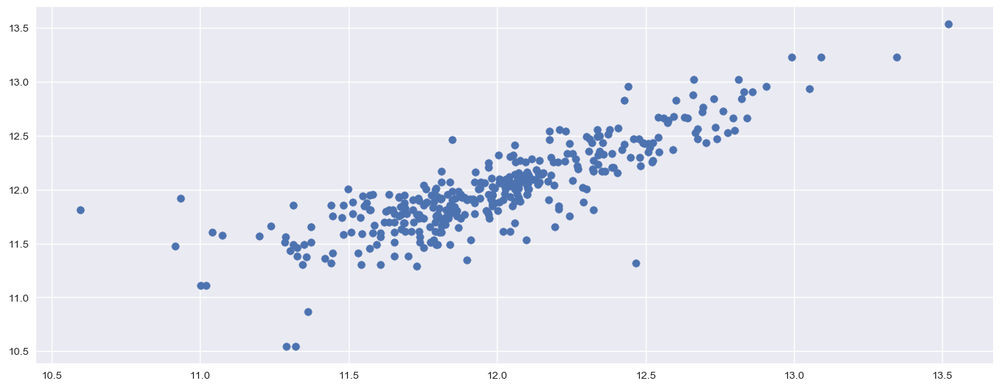

In [197]:
plt.scatter(y_test,y_pred_test)

__Regression Evaluation Metrics__

In [198]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred_test))
print('MSE:', metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_test)))

MAE: 0.16257857036593154
MSE: 0.052186731392862326
RMSE: 0.22844415377256283


__Lets give a try with Set B parameters of Linear Regression  model and see the results.__

In [199]:
input_var = ['OverallQual', 'GrLivArea', 'GarageCars', '1stFlrSF', 'EnclosedPorch', 'LotShape', 'BsmtExposure', 'GarageFinish', 'HeatingQC', 'GarageType', 'YearBuilt', 'BsmtQual', 'ExterQual']
X = house[input_var]
y = house["SalePrice"]

In [200]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [201]:
print(X_train.shape)
print(y_train.shape)

(1095, 13)
(1095,)


In [202]:
from sklearn.tree import DecisionTreeRegressor
DT_model_SetB = DecisionTreeRegressor()
DT_model_SetB.fit(X_train, y_train)

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

In [203]:
y_pred_train = DT_model_SetB.predict(X_train)

In [204]:
y_pred_test = DT_model_SetB.predict(X_test)

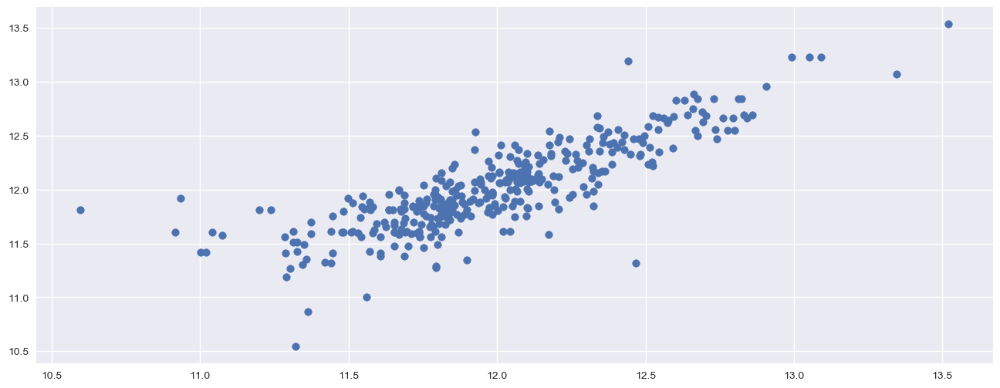

In [205]:
plt.scatter(y_test,y_pred_test)

__Regression Evaluation Metrics__

In [206]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred_test))
print('MSE:', metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_test)))

MAE: 0.16680689187061085
MSE: 0.053628254573228444
RMSE: 0.23157775060058866


__Observation__

- Set B and Set C data does not give better result
- Lets try Grid Search and compare the results.

#### [Back to Index](#Index)

<a id=section8028><a/>

### 8.2.8 Decision Tree with Gridsearch

- Let’s see how Grid search can help us in improvising the result.

__Lets give a try with Set A parameters and see the results.__

In [207]:
house = pd.read_csv('../RawData/house_data_CleanLogCatDrop.csv')

In [208]:
X = house.drop('SalePrice',axis=1)
y = house['SalePrice']

In [209]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [210]:
print(X_train.shape)
print(y_train.shape)

(1095, 75)
(1095,)


In [211]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV

decision_tree_regressor = DecisionTreeRegressor(random_state = 0)

tree_para = {'max_depth': range(2,100),
             'max_features': ['sqrt', 'log2', None],
             'min_samples_leaf': [2, 3, 4, 5],
             'min_samples_split': [6, 8, 10, 12]}    

DT_model_Grid_search = GridSearchCV(decision_tree_regressor,tree_para, cv=10, refit='AUC')
DT_model_Grid_search.fit(X_train, y_train)

GridSearchCV(cv=10, error_score='raise',
       estimator=DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=0, splitter='best'),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': range(2, 100), 'max_features': ['sqrt', 'log2', None], 'min_samples_leaf': [2, 3, 4, 5], 'min_samples_split': [6, 8, 10, 12]},
       pre_dispatch='2*n_jobs', refit='AUC', return_train_score='warn',
       scoring=None, verbose=0)

In [212]:
y_pred_train = DT_model_Grid_search.predict(X_train)

In [213]:
y_pred_test1 = DT_model_Grid_search.predict(X_test)

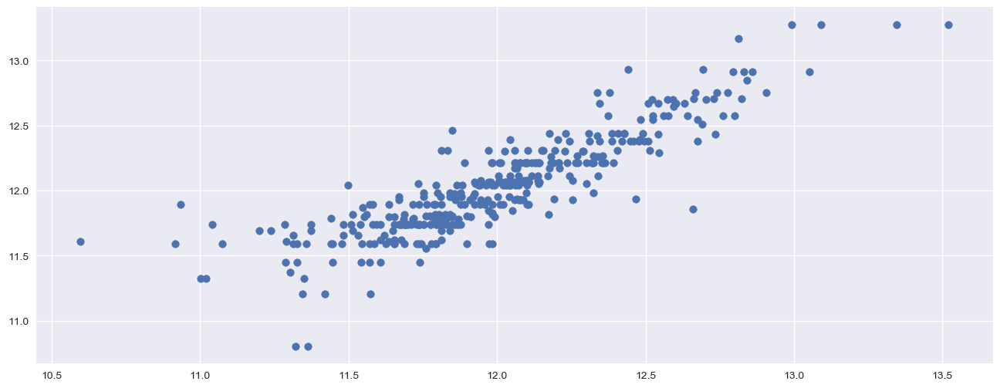

In [214]:
plt.scatter(y_test,y_pred_test1)

In [215]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred_test1))
print('MSE:', metrics.mean_squared_error(y_test, y_pred_test1))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_test1)))

MAE: 0.14112033391236184
MSE: 0.040514434327341
RMSE: 0.201281977154789


__Lets give a try with Set C parameters and see the results.__

In [218]:
input_var = ['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'FullBath', 'TotRmsAbvGrd', '1stFlrSF', 'EnclosedPorch', 'LotShape', 'BsmtExposure', 'GarageFinish', 'HeatingQC', 'GarageType', 'YearBuilt']
X = house[input_var]
y = house["SalePrice"]

In [219]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [220]:
print(X_train.shape)
print(y_train.shape)

(1095, 14)
(1095,)


In [221]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV

decision_tree_regressor = DecisionTreeRegressor(random_state = 0)

tree_para = {'max_depth': range(2,100),
             'max_features': ['sqrt', 'log2', None],
             'min_samples_leaf': [2, 3, 4, 5],
             'min_samples_split': [6, 8, 10, 12]}    

DT_model_Grid_search_SetC = GridSearchCV(decision_tree_regressor,tree_para, cv=10, refit='AUC')
DT_model_Grid_search_SetC.fit(X_train, y_train)

GridSearchCV(cv=10, error_score='raise',
       estimator=DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=0, splitter='best'),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': range(2, 100), 'max_features': ['sqrt', 'log2', None], 'min_samples_leaf': [2, 3, 4, 5], 'min_samples_split': [6, 8, 10, 12]},
       pre_dispatch='2*n_jobs', refit='AUC', return_train_score='warn',
       scoring=None, verbose=0)

In [222]:
y_pred_train = DT_model_Grid_search_SetC.predict(X_train)

In [223]:
y_pred_test = DT_model_Grid_search_SetC.predict(X_test)

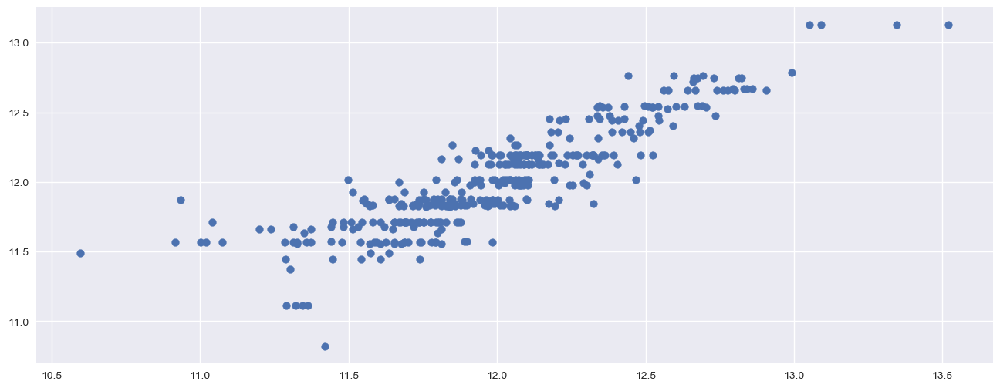

In [224]:
plt.scatter(y_test,y_pred_test)

__Regression Evaluation Metrics__

In [225]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred_test))
print('MSE:', metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_test)))

MAE: 0.14125006055240488
MSE: 0.03647823612376357
RMSE: 0.19099276458484907


__Lets give a try with Set B parameters and see the results.__

In [228]:
input_var = ['OverallQual', 'GrLivArea', 'GarageCars', '1stFlrSF', 'EnclosedPorch', 'LotShape', 'BsmtExposure', 'GarageFinish', 'HeatingQC', 'GarageType', 'YearBuilt', 'BsmtQual', 'ExterQual']
X = house[input_var]
y = house["SalePrice"]

In [229]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [230]:
print(X_train.shape)
print(y_train.shape)

(1095, 13)
(1095,)


In [231]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV

decision_tree_regressor = DecisionTreeRegressor(random_state = 0)

tree_para = {'max_depth': range(2,100),
             'max_features': ['sqrt', 'log2', None],
             'min_samples_leaf': [2, 3, 4, 5],
             'min_samples_split': [6, 8, 10, 12]}    

DT_model_Grid_search_SetB = GridSearchCV(decision_tree_regressor,tree_para, cv=10, refit='AUC')
DT_model_Grid_search_SetB.fit(X_train, y_train)

GridSearchCV(cv=10, error_score='raise',
       estimator=DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=0, splitter='best'),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': range(2, 100), 'max_features': ['sqrt', 'log2', None], 'min_samples_leaf': [2, 3, 4, 5], 'min_samples_split': [6, 8, 10, 12]},
       pre_dispatch='2*n_jobs', refit='AUC', return_train_score='warn',
       scoring=None, verbose=0)

In [232]:
y_pred_train = DT_model_Grid_search_SetB.predict(X_train)

In [233]:
y_pred_test = DT_model_Grid_search_SetB.predict(X_test)

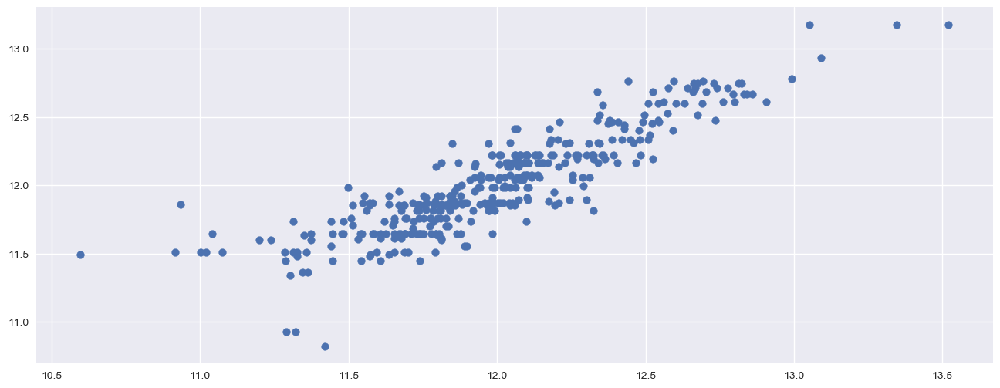

In [234]:
plt.scatter(y_test,y_pred_test)

__Regression Evaluation Metrics__

In [235]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred_test))
print('MSE:', metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_test)))

MAE: 0.14118955167506164
MSE: 0.03602255297245313
RMSE: 0.18979608260565636


### __Observation__

- Decision tree and GridSearch CV had some difference in the result.
- Compared to Linear regression model, Parameter selection and filtering the data problems are not there in Decision tree models.
- Compared to Linear regression model the result is not good, it has more RMSE value than LR model RMSE.
- Lets Compare the RMSE calculation of LR Model and DT Model.
  - Regression Evaluation Metrics : LR Model (GridSearchCV)
    - __MAE: 0.12169775134916445__
    - __MSE: 0.025952426841223144__
    - __RMSE: 0.16109756932127545__
  - Regression Evaluation Metrics : DT Model (All Data)
    - __MAE: 0.14730287685012552__
    - __MSE: 0.04531865234984309__
    - __RMSE: 0.2128817802204855__
  - Regression Evaluation Metrics : DT Model (Set C)
    - __MAE: 0.16218285497815974__
    - __MSE: 0.05209127154248255__
    - __RMSE: 0.22823512337605392__
  - Regression Evaluation Metrics : DT Model (Set B)
    - __MAE: 0.16061820919999564__
    - __MSE: 0.04978371299632755__
    - __RMSE: 0.22312264115577232__
  - Regression Evaluation Metrics : DT Model( GridSearch DT)
    - __MAE: 0.14112033391236184__
    - __MSE: 0.040514434327341__
    - __RMSE: 0.201281977154789__
  - Regression Evaluation Metrics : DT Model( GridSearch DT - Set C)
    - __MAE: 0.14125006055240488__
    - __MSE: 0.03647823612376357__
    - __RMSE: 0.19099276458484907__
  - Regression Evaluation Metrics : DT Model( GridSearch DT - Set B)
    - __MAE: 0.14118955167506164__
    - __MSE: 0.03602255297245313__
    - __RMSE: 0.18979608260565636__
    
- We can see DT model with GridSearchCV has tuned to give better results, and also the feature changes (Set B and Set C) has   
  given more better result.
- Feature selection has given good result but not good as Linear Model, lets apply same to Random Forest and compare the   results.
- The best RMSE we have got is from __Linear Model : 0.16109756932127545__ and __DT Model has given RMSE of 0.18979608260565636__
- Lets try __Random Forest Regressor__ and __RandomizedsearchCV__ and see the results.


#### [Back to Index](#Index)

<a id=section803><a/>

## 8.3 Random Forest Regressor

<a id=section8031><a/>

### 8.3.1 Introduction to Random Forest

__Random Forest__ is considered to be the __panacea__ of all data science problems. On a funny note, when you can’t think of any algorithm (irrespective of situation), use random forest!

In Random Forest, we grow __multiple trees__ as opposed to a single tree in CART model . To classify a new object based on attributes, each tree gives a classification and we say the tree “votes” for that class. __The forest chooses the classification having the most votes__ (over all the trees in the forest) and in case of __regression__, it takes the __average of outputs by different trees.__

Random Forest is a versatile machine learning method capable of performing __both regression and classification tasks__. It also undertakes dimensional reduction methods, treats missing values, outlier values and other essential steps of data exploration, and does a fairly good job. It is a type of __ensemble learning__ method, where __a group of weak models combine to form a powerful model.__

#### [Back to Index](#Index)

<a id=section8032><a/>

### 8.3.2 Concept behind random forest

The random forest is a model made up of many decision trees. Rather than just being a forest though, this model is random because of two concepts:

1. Random sampling of data points
2. Splitting nodes based on subsets of features

<a id = randomsampling></a>

__Random Sampling__

- One of the keys behind the random forest is that __each tree trains on random samples__ of the data points. 
- The samples are drawn with _replacement_ (known as __bootstrapping__) which means that some samples will be trained on in a single tree multiple times (we can also disable this behavior if we want).
- The idea is that by training each tree on different samples, although __each tree__ might have __high variance__ with respect to a particular set of the training data, overall, the __entire forest __will have __low variance__.
- This procedure of training each individual learner on different subsets of the data and then averaging the predictions is known as __bagging__, short for bootstrap aggregating.

To more clearly understand bagging summarised below are the steps to follow: 

1. __Create Multiple DataSets__:
    - Sampling is done with replacement on the original data and new datasets are formed.
    - The new data sets can have a fraction of the columns as well as rows, which are generally hyper-parameters in a bagging model
    - Taking row and column fractions less than 1 helps in making robust models, less prone to overfitting
2. __Build Multiple Classifiers__:
    - Classifiers are built on each data set.
    - Generally the same classifier is modeled on each data set and predictions are made.
3. __Combine Classifiers__:
    - The predictions of all the classifiers are combined using either mean or mode value depending on the problem at hand.
    - Generally __mean__ are used for __regression__ problems and __mode__ is used for __classification__ problems.  
    - The combined values are generally more robust than a single model.


__Random Subsets of Features__

- Another concept behind the random forest is that only a __subset__ of all the __features__ are considered for splitting each node in each decision tree. Generally this is set to __sqrt(n_features)__ meaning that at each node, the decision tree considers splitting on a sample of the features totaling the square root of the total number of features. 
- The random forest _can_ also be trained considering __all the features__ at every node. (These options can be controlled in the Scikit-Learn random forest implementation).


The random forest combines hundreds or __thousands of decision trees__, trains each one on a __slightly different set of the observations__ (sampling the data points with replacement) and also __splits nodes in each tree considering only a limited number of the features.__ The final predictions made by the random forest are made by __averaging the predictions of each individual tree.__

#### [Back to Index](#Index)

<a id=section8033><a/>

### 8.3.3 Advantages and Disadvantages:

__Advantages__


- It can be used for __both regression and classification__ tasks and that it’s easy to view the relative importance it assigns to the input features.

- Random forest classifier __handle the missing values__ on its own.

- Random Forest is also considered as a very handy and easy to use algorithm, because it’s __default hyperparameters often produce a good prediction result__. The number of hyperparameters is also not that high and they are straightforward to understand.

- One of the big problems in machine learning is overfitting, but most of the time this won’t happen that easy to a random forest classifier. That’s because if there are __enough trees__ in the forest, the classifier __won’t overfit__ the model.

__Shortcomings__

- The main limitation of Random Forest is that a __large number of trees__ can make the algorithm __slow and ineffective for real-time predictions.__ In general, these algorithms are fast to train, but quite slow to create predictions once they are trained. A more accurate prediction requires more trees, which results in a slower model. In most real-world applications the random forest algorithm is fast enough, but there can certainly be situations where run-time performance is important and other approaches would be preferred.

- Random Forest is a predictive modeling tool and __not a descriptive tool__. That means, if you are looking for a description of the relationships in your data, other approaches would be preferred.

- Random Forest can feel like a __black box approach for statistical modelers__ – you have __very little control__ on what the model does. You can at best – try different parameters and random seeds!

__Use Cases:__

The random forest algorithm is used in a lot of different fields like:
- __Banking__
    - In Banking it is used for example to detect customers who will use the bank’s services more frequently than others and repay their debt in time. In this domain it is also used to detect fraud customers who want to scam the bank.
- __Stock Market__,
    - In finance, it is used to determine a stock’s behaviour in the future.
- __Medicine__ 
    - In the healthcare domain it is used to identify the correct combination of components in medicine and to analyze a patient’s medical history to identify diseases.
- __E-Commerce__
    -  To determine whether a customer will actually like the product or not.

#### [Back to Index](#Index)

<a id=section8034><a/>

### 8.3.4 Preparing X and y using pandas

In [238]:
house = pd.read_csv('../RawData/house_data_CleanLogCatDrop.csv')

In [239]:
X = house.drop('SalePrice',axis=1)
y = house['SalePrice']

#### [Back to Index](#Index)

<a id=section8035><a/>

### 8.3.5 Splitting X and y into training and test datasets.

In [240]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [241]:
print(X_train.shape)
print(y_train.shape)

(1095, 75)
(1095,)


#### [Back to Index](#Index)

<a id=section8036><a/>

### 8.3.6 Random Forest in scikit-learn

- __Model without parameter specification__

In [242]:
from sklearn.ensemble import RandomForestRegressor

RFR_model = RandomForestRegressor(random_state = 0)

RFR_model.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=0, verbose=0, warm_start=False)

- __Model with parameters specified__

In [243]:
RFR_model1 = RandomForestRegressor(random_state = 0,
                                n_estimators = 15,
                                min_samples_split = 2,
                                min_samples_leaf = 1)

RFR_model1.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=15, n_jobs=1,
           oob_score=False, random_state=0, verbose=0, warm_start=False)

__Using the Model for Prediction__

In [244]:
y_pred_train = RFR_model.predict(X_train)
y_pred_train1 = RFR_model1.predict(X_train)

In [245]:
y_pred_test = RFR_model.predict(X_test)                                                           # make predictions on the testing set
y_pred_test1 = RFR_model1.predict(X_test)

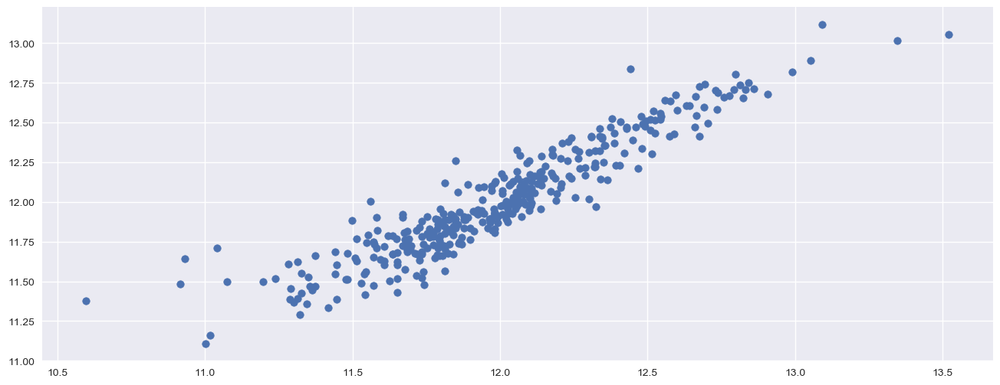

In [246]:
plt.scatter(y_test,y_pred_test)

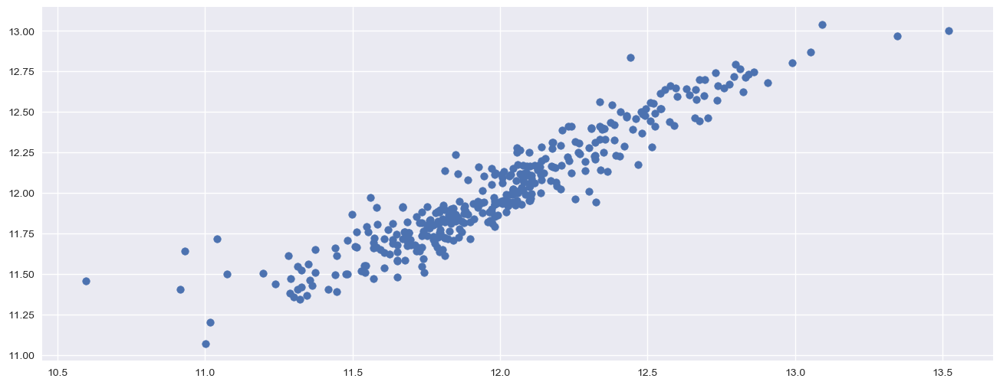

In [247]:
plt.scatter(y_test,y_pred_test1)

__Regression Evaluation Metrics__

In [248]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred_test))
print('MSE:', metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_test)))

MAE: 0.10456434350871413
MSE: 0.021658608450583205
RMSE: 0.14716863949423195


In [249]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred_test1))
print('MSE:', metrics.mean_squared_error(y_test, y_pred_test1))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_test1)))

MAE: 0.1027739112758477
MSE: 0.021589752288459583
RMSE: 0.1469345170082904


__Lets give a try with Set C parameters of Linear Regression  model and see the results.__

In [250]:
input_var = ['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'FullBath', 'TotRmsAbvGrd', '1stFlrSF', 'EnclosedPorch', 'LotShape', 'BsmtExposure', 'GarageFinish', 'HeatingQC', 'GarageType', 'YearBuilt']
X = house[input_var]
y = house["SalePrice"]

In [251]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [252]:
print(X_train.shape)
print(y_train.shape)

(1095, 14)
(1095,)


In [253]:
RFR_model_SetC = RandomForestRegressor(random_state = 0,
                                n_estimators = 15,
                                min_samples_split = 4,
                                min_samples_leaf = 2)

RFR_model_SetC.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=2, min_samples_split=4,
           min_weight_fraction_leaf=0.0, n_estimators=15, n_jobs=1,
           oob_score=False, random_state=0, verbose=0, warm_start=False)

In [254]:
y_pred_train = RFR_model_SetC.predict(X_train)

In [255]:
y_pred_test = RFR_model_SetC.predict(X_test)

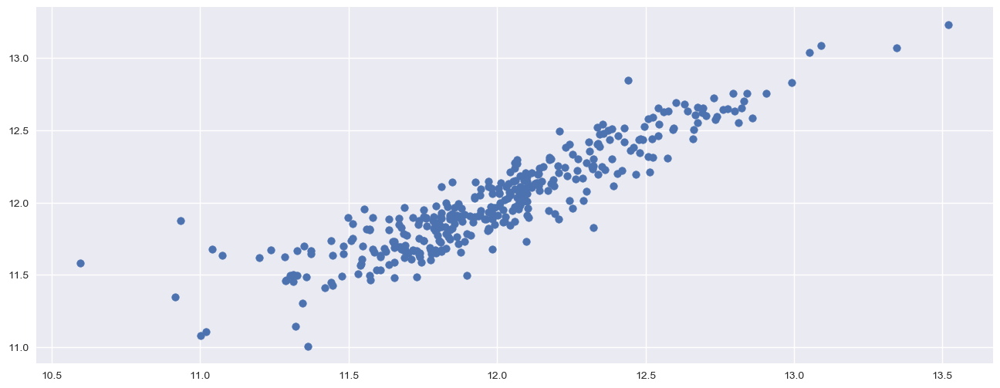

In [256]:
plt.scatter(y_test,y_pred_test)

__Regression Evaluation Metrics__

In [257]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred_test))
print('MSE:', metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_test)))

MAE: 0.12134337912280597
MSE: 0.028713191378259773
RMSE: 0.16944967211021617


__Lets give a try with Set B parameters of Linear Regression  model and see the results.__

In [258]:
input_var = ['OverallQual', 'GrLivArea', 'GarageCars', '1stFlrSF', 'EnclosedPorch', 'LotShape', 'BsmtExposure', 'GarageFinish', 'HeatingQC', 'GarageType', 'YearBuilt', 'BsmtQual', 'ExterQual']
X = house[input_var]
y = house["SalePrice"]

In [259]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [260]:
print(X_train.shape)
print(y_train.shape)

(1095, 13)
(1095,)


In [261]:
RFR_model_SetB = RandomForestRegressor(random_state = 0,
                                n_estimators = 15,
                                min_samples_split = 4,
                                min_samples_leaf = 2)

RFR_model_SetB.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=2, min_samples_split=4,
           min_weight_fraction_leaf=0.0, n_estimators=15, n_jobs=1,
           oob_score=False, random_state=0, verbose=0, warm_start=False)

In [262]:
y_pred_train = RFR_model_SetB.predict(X_train)

In [263]:
y_pred_test = RFR_model_SetB.predict(X_test)

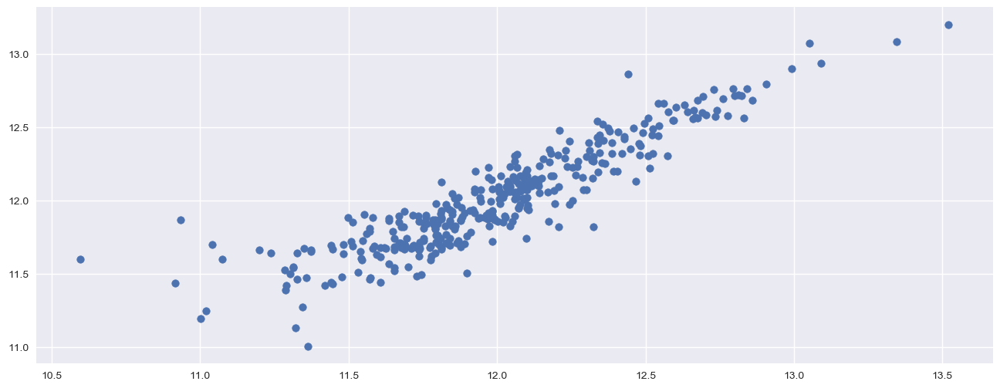

In [264]:
plt.scatter(y_test,y_pred_test)

__Regression Evaluation Metrics__

In [265]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred_test))
print('MSE:', metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_test)))

MAE: 0.12067498055631946
MSE: 0.02874356108553383
RMSE: 0.16953926119201365


#### [Back to Index](#Index)

<a id=section8037><a/>

### 8.3.7 Random forest with RandomizedsearchCV

Applying __RandomizedsearchCV__ method for __exhaustive search over specified parameter values__ of estimator.<br/>
To know more about the different parameters in random forest classifier, refer the [documentation](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html#sklearn.ensemble.RandomForestRegressor). <br/>
Below we will apply gridsearch over the following parameters:
- max_depth
- bootstrap
- n_estimators
- min_samples_split
- min_samples_leaf
- max_features

You can change other parameters also and compare the impact of it via calculating __accuracy score & confusion matrix__

Reference: 
https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html#sklearn.ensemble.RandomForestRegressor

In [266]:
house = pd.read_csv('../RawData/house_data_CleanLogCatDrop.csv')

In [267]:
X = house.drop('SalePrice',axis=1)
y = house['SalePrice']

In [268]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

In [269]:
print(X_train.shape)
print(y_train.shape)

(1168, 75)
(1168,)


In [270]:
RFR_model_RCV = RandomForestRegressor(random_state = 0,
                                n_estimators = 15,
                                min_samples_split = 4,
                                min_samples_leaf = 2)

RFR_model_RCV.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=2, min_samples_split=4,
           min_weight_fraction_leaf=0.0, n_estimators=15, n_jobs=1,
           oob_score=False, random_state=0, verbose=0, warm_start=False)

In [271]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint

param_dist = {"max_depth": range(2,5),
              "min_samples_split": sp_randint(2, 11),
              "min_samples_leaf": sp_randint(1, 11),
              "bootstrap": [True, False],
              "n_estimators": [100, 400, 700, 1000, 1500],
              'max_features': ['sqrt', 'log2', None]
             }

# run randomized search
n_iter_search = 50
RFR_model_RandSearchCV = RandomizedSearchCV(RFR_model_RCV, param_distributions = param_dist,
                                   n_iter = n_iter_search,
                                   n_jobs = -1)

In [272]:
RFR_model_RandSearchCV.fit(X_train, y_train)

RandomizedSearchCV(cv=None, error_score='raise',
          estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=2, min_samples_split=4,
           min_weight_fraction_leaf=0.0, n_estimators=15, n_jobs=1,
           oob_score=False, random_state=0, verbose=0, warm_start=False),
          fit_params=None, iid=True, n_iter=50, n_jobs=-1,
          param_distributions={'max_depth': range(2, 5), 'min_samples_split': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001D89DE452B0>, 'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001D89DE45320>, 'bootstrap': [True, False], 'n_estimators': [100, 400, 700, 1000, 1500], 'max_features': ['sqrt', 'log2', None]},
          pre_dispatch='2*n_jobs', random_state=None, refit=True,
          return_train_score='warn', scoring=None, verbose=0)

In [273]:
y_pred_test = RFR_model_RandSearchCV.predict(X_test)

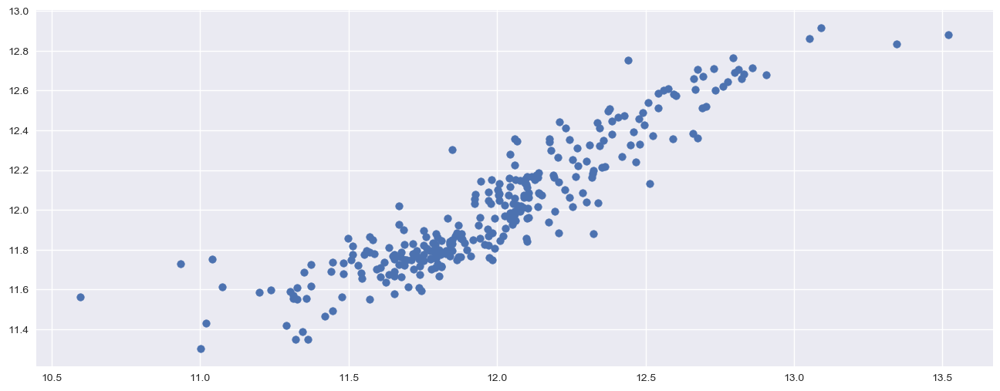

In [274]:
plt.scatter(y_test,y_pred_test)

In [275]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred_test))
print('MSE:', metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_test)))

MAE: 0.12467021015415798
MSE: 0.03175791876384326
RMSE: 0.17820751601389673


__Lets give a try with Set C parameters of Linear Regression  model and see the results.__

In [276]:
input_var = ['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'FullBath', 'TotRmsAbvGrd', '1stFlrSF', 'EnclosedPorch', 'LotShape', 'BsmtExposure', 'GarageFinish', 'HeatingQC', 'GarageType', 'YearBuilt']
X = house[input_var]
y = house["SalePrice"]

In [277]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [278]:
print(X_train.shape)
print(y_train.shape)

(1095, 14)
(1095,)


In [279]:
RFR_model_RCV_SetC = RandomForestRegressor(random_state = 0,
                                n_estimators = 15,
                                min_samples_split = 4,
                                min_samples_leaf = 2)

RFR_model_RCV_SetC.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=2, min_samples_split=4,
           min_weight_fraction_leaf=0.0, n_estimators=15, n_jobs=1,
           oob_score=False, random_state=0, verbose=0, warm_start=False)

In [280]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint

param_dist = {"max_depth": range(2,5),
              "min_samples_split": sp_randint(2, 11),
              "min_samples_leaf": sp_randint(1, 11),
              "bootstrap": [True, False],
              "n_estimators": [100, 400, 700, 1000, 1500],
              'max_features': ['sqrt', 'log2', None]
             }

# run randomized search
n_iter_search = 50
RFR_model_RandSearchCV_SetC = RandomizedSearchCV(RFR_model_RCV_SetC, param_distributions = param_dist,
                                   n_iter = n_iter_search,
                                   n_jobs = -1)

In [281]:
RFR_model_RandSearchCV_SetC.fit(X_train, y_train)

RandomizedSearchCV(cv=None, error_score='raise',
          estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=2, min_samples_split=4,
           min_weight_fraction_leaf=0.0, n_estimators=15, n_jobs=1,
           oob_score=False, random_state=0, verbose=0, warm_start=False),
          fit_params=None, iid=True, n_iter=50, n_jobs=-1,
          param_distributions={'max_depth': range(2, 5), 'min_samples_split': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001D89E7125F8>, 'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001D899E2E668>, 'bootstrap': [True, False], 'n_estimators': [100, 400, 700, 1000, 1500], 'max_features': ['sqrt', 'log2', None]},
          pre_dispatch='2*n_jobs', random_state=None, refit=True,
          return_train_score='warn', scoring=None, verbose=0)

In [282]:
y_pred_test = RFR_model_RandSearchCV_SetC.predict(X_test)

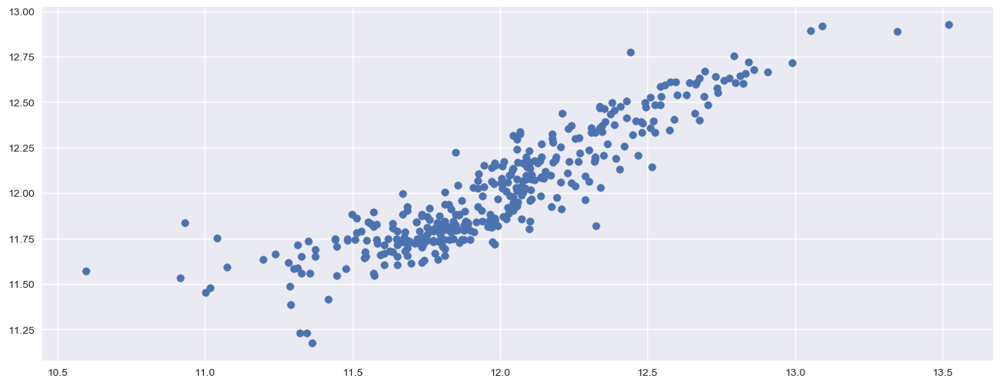

In [283]:
plt.scatter(y_test,y_pred_test)

__Regression Evaluation Metrics__

In [284]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred_test))
print('MSE:', metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_test)))

MAE: 0.12970907364189407
MSE: 0.0327637495142158
RMSE: 0.1810075951837817


__Lets give a try with Set B parameters of Linear Regression  model and see the results.__

In [285]:
input_var = ['OverallQual', 'GrLivArea', 'GarageCars', '1stFlrSF', 'EnclosedPorch', 'LotShape', 'BsmtExposure', 'GarageFinish', 'HeatingQC', 'GarageType', 'YearBuilt', 'BsmtQual', 'ExterQual']
X = house[input_var]
y = house["SalePrice"]

In [286]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [287]:
print(X_train.shape)
print(y_train.shape)

(1095, 13)
(1095,)


In [288]:
RFR_model_RCV_SetB = RandomForestRegressor(random_state = 0,
                                n_estimators = 15,
                                min_samples_split = 4,
                                min_samples_leaf = 2)

RFR_model_RCV_SetB.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=2, min_samples_split=4,
           min_weight_fraction_leaf=0.0, n_estimators=15, n_jobs=1,
           oob_score=False, random_state=0, verbose=0, warm_start=False)

In [289]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint

param_dist = {"max_depth": range(2,5),
              "min_samples_split": sp_randint(2, 11),
              "min_samples_leaf": sp_randint(1, 11),
              "bootstrap": [True, False],
              "n_estimators": [100, 400, 700, 1000, 1500],
              'max_features': ['sqrt', 'log2', None]
             }

# run randomized search
n_iter_search = 50
RFR_model_RandSearchCV_SetB = RandomizedSearchCV(RFR_model_RCV_SetB, param_distributions = param_dist,
                                   n_iter = n_iter_search,
                                   n_jobs = -1)

In [290]:
RFR_model_RandSearchCV_SetB.fit(X_train, y_train)

RandomizedSearchCV(cv=None, error_score='raise',
          estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=2, min_samples_split=4,
           min_weight_fraction_leaf=0.0, n_estimators=15, n_jobs=1,
           oob_score=False, random_state=0, verbose=0, warm_start=False),
          fit_params=None, iid=True, n_iter=50, n_jobs=-1,
          param_distributions={'max_depth': range(2, 5), 'min_samples_split': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001D89973A080>, 'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001D89973A898>, 'bootstrap': [True, False], 'n_estimators': [100, 400, 700, 1000, 1500], 'max_features': ['sqrt', 'log2', None]},
          pre_dispatch='2*n_jobs', random_state=None, refit=True,
          return_train_score='warn', scoring=None, verbose=0)

In [291]:
y_pred_train = RFR_model_RandSearchCV_SetB.predict(X_train)

In [292]:
y_pred_test = RFR_model_RandSearchCV_SetB.predict(X_test)

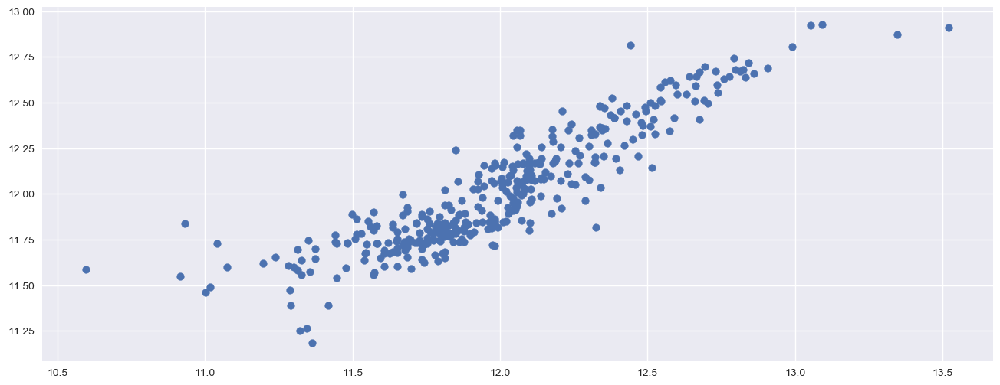

In [293]:
plt.scatter(y_test,y_pred_test)

__Regression Evaluation Metrics__

In [294]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred_test))
print('MSE:', metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_test)))

MAE: 0.1282104523036054
MSE: 0.032744294550992745
RMSE: 0.18095384646642013


### __Observation__

- Random forest and RandomizedSearchCV had huge difference in the result.
- Compared to other models the result is very good, it has less RMSE value than LR model RMSE.
- Lets Compare the RMSE calculation of LR Model, DT Model and Random Forest Model.
  - Regression Evaluation Metrics : LR Model (GridSearchCV)
    - __MAE: 0.12169775134916445__
    - __MSE: 0.025952426841223144__
    - __RMSE: 0.16109756932127545__
  - Regression Evaluation Metrics : DT Model (All Data)
    - __MAE: 0.14730287685012552__
    - __MSE: 0.04531865234984309__
    - __RMSE: 0.2128817802204855__
  - Regression Evaluation Metrics : DT Model (Set C)
    - __MAE: 0.16218285497815974__
    - __MSE: 0.05209127154248255__
    - __RMSE: 0.22823512337605392__
  - Regression Evaluation Metrics : DT Model (Set B)
    - __MAE: 0.16061820919999564__
    - __MSE: 0.04978371299632755__
    - __RMSE: 0.22312264115577232__
  - Regression Evaluation Metrics : DT Model( GridSearch DT)
    - __MAE: 0.14112033391236184__
    - __MSE: 0.040514434327341__
    - __RMSE: 0.201281977154789__
  - Regression Evaluation Metrics : DT Model( GridSearch DT - Set C)
    - __MAE: 0.14125006055240488__
    - __MSE: 0.03647823612376357__
    - __RMSE: 0.19099276458484907__
  - Regression Evaluation Metrics : DT Model( GridSearch DT - Set B)
    - __MAE: 0.14118955167506164__
    - __MSE: 0.03602255297245313__
    - __RMSE: 0.18979608260565636__
  - Regression Evaluation Metrics : Random Forest Model(Model1)
    - __MAE: 0.10456434350871413__
    - __MSE: 0.021658608450583205__
    - __RMSE: 0.14716863949423195__
  - Regression Evaluation Metrics : Random Forest Model(Model2)
    - __MAE: 0.1027739112758477__
    - __MSE: 0.021589752288459583__
    - __RMSE: 0.1469345170082904__
  - Regression Evaluation Metrics : Random Forest Model(Set C)
    - __MAE: 0.12134337912280597__
    - __MSE: 0.028713191378259773__
    - __RMSE: 0.16944967211021617__
  - Regression Evaluation Metrics : Random Forest Model(Set B)
    - __MAE: 0.12067498055631946__
    - __MSE: 0.02874356108553383__
    - __RMSE: 0.16953926119201365__
  - Regression Evaluation Metrics : Random Forest Model(RandomizedSearch CV)
    - __MAE: 0.12467021015415798__
    - __MSE: 0.03175791876384326__
    - __RMSE: 0.17820751601389673__
  - Regression Evaluation Metrics : Random Forest Model(RandomizedSearch CV -  Set C)
    - __MAE: 0.12970907364189407__
    - __MSE: 0.0327637495142158__
    - __RMSE: 0.1810075951837817__
  - Regression Evaluation Metrics : Random Forest Model(RandomizedSearch CV -  Set B)
    - __MAE: 0.1282104523036054__
    - __MSE: 0.032744294550992745__
    - __RMSE: 0.18095384646642013__
  
    
- We can see Random forest has give better results than other two models, and also the feature changes (Set B and Set C) has   
  given more better result.
- The best RMSE we have got is from __Random Forest: 0.1469345170082904 Linear Model : 0.16109756932127545__ and __DT Model has given RMSE of 0.18979608260565636__
- With above results we can say Random forest model is best suitable for this data set.

#### [Back to Index](#Index)

<a id=section9><a/>

## 9. Model Selection

__Brief__

- I have tried Three ML models for the Houses Pricing data set, we have seen many different result with many different combination of parameters.
- After looking at all the results and comparing the RMSE of each results, now we shall compare each model and check the percentage of accuracy and lets also see if the feature selection has tuned our model.

- Lets try to calculate the accuracy of the Models as shown below
- Lets Compare Normal and Grid Search. Lets pick the best score from each Model. (Normal and Grid)
- Reference : https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74

In [395]:
def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    errors = abs(predictions - test_labels)
    mape = 100 * np.mean(errors / test_labels)
    accuracy = 100 - mape
    print('Model Performance')
    print('Average Error: {:0.4f} degrees.'.format(np.mean(errors)))
    print('Accuracy = {:0.2f}%.'.format(accuracy))
    
    return accuracy

### Compare the results of Linear Regression Models

In [396]:
house = pd.read_csv('../RawData/house_data_CleanLogCatDrop.csv')

In [397]:
##Set C
input_var = ['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'FullBath', 'TotRmsAbvGrd', '1stFlrSF', 'EnclosedPorch', 'LotShape', 'BsmtExposure', 'GarageFinish', 'HeatingQC', 'GarageType', 'YearBuilt']
SetC_X = house[input_var]
SetC_y = house["SalePrice"]

In [398]:
## Accuracy of Linear Model
base_accuracy = evaluate(linreg_SetC , SetC_X, SetC_y)


best_grid = linreg_grid_SetC.best_estimator_
grid_accuracy = evaluate(best_grid, SetC_X, SetC_y)
print('--------------------------------------------')
print('Improvement of {:0.2f}%.'.format( 100 * (grid_accuracy - base_accuracy) / base_accuracy))


Model Performance
Average Error: 0.1176 degrees.
Accuracy = 99.02%.
Model Performance
Average Error: 0.1176 degrees.
Accuracy = 99.02%.
--------------------------------------------
Improvement of 0.00%.


- As we can see from above that GridSearch model tuning has no improvement when applied on our linear model.
- We shall Compare the Linear Grid Model result with the best output of the Decision tree model below.

### Compare the results of Linear Regression Model and Decision tree Regression model results

In [399]:
##Set B
input_var = ['OverallQual', 'GrLivArea', 'GarageCars', '1stFlrSF', 'EnclosedPorch', 'LotShape', 'BsmtExposure', 'GarageFinish', 'HeatingQC', 'GarageType', 'YearBuilt', 'BsmtQual', 'ExterQual']
SetB_X = house[input_var]
SetB_y = house["SalePrice"]

In [400]:
## Accuracy of Linear Model
base_accuracy = evaluate(linreg_grid_SetC , SetC_X, SetC_y)


best_grid = DT_model_Grid_search_SetB.best_estimator_
grid_accuracy = evaluate(best_grid, SetB_X, SetB_y)
print('--------------------------------------------')
print('Improvement of {:0.2f}%.'.format( 100 * (grid_accuracy - base_accuracy) / base_accuracy))


Model Performance
Average Error: 0.1176 degrees.
Accuracy = 99.02%.
Model Performance
Average Error: 0.1110 degrees.
Accuracy = 99.07%.
--------------------------------------------
Improvement of 0.05%.


### Compare the results of Linear Regression Model and Random Forest Model

In [401]:
X = house.drop('SalePrice',axis=1)
y = house['SalePrice']

In [402]:
## Accuracy of Linear Model
base_accuracy = evaluate(RFR_model1 , X, y)


best_grid = DT_model_Grid_search_SetB.best_estimator_
grid_accuracy = evaluate(best_grid, SetB_X, SetB_y)
print('--------------------------------------------')
print('Improvement of {:0.2f}%.'.format( 100 * (grid_accuracy - base_accuracy) / base_accuracy))


Model Performance
Average Error: 0.0577 degrees.
Accuracy = 99.52%.
Model Performance
Average Error: 0.1110 degrees.
Accuracy = 99.07%.
--------------------------------------------
Improvement of -0.45%.


__Overall Comparison__

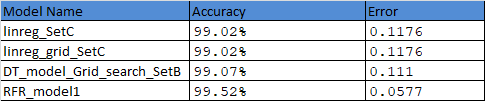

### Observation

- By looking at the above Model performance table, we are clear that __Random Forest Model__ has given good result.
- Second best model is __Linear Model__, I am comparing both the performance and RMSE score and the above performance calculation.
- Third best is the __Decision tree model__ which has good accuracy but not the best compared to other two models.

#### [Back to Index](#Index)

<a id=section10><a/>

## 10. Conclusion and Reference

### Conclusion

- ML projects are inherently uncertain and the approach i have used is accountable for hitting a specific accuracy goal. 
- I have performed error analysis for each model, I have tried to tune the models to get accurate results. 
- I have tried to implement all of my ideas as much as possible. I have done some trial and error to see how it works.
- I have explored and performed Data Analysis and Data Cleaning to build my ML Model as accurate as possible.
- Things which i have not performed in depth is  __Handling Outliers__ , i have used some basic outliers removal technique, but I strongly believe, because of this i had to compromise with the accuracy of my model.
- Z-Score, IQR and others techniques are not implemented, will try to implement it next time.
- Why i have not used __Logistic regression__: since i am building a prediction model where we have continues data dependent variable. Next time if i work on clarifier model definitely i will use Logistic Regression.
- Overall the Model looks good and __Random forest model__ has given 99.52% accuracy. Will try to tune up the model in future.

### Reference

- https://towardsdatascience.com
- https://www.khanacademy.org/
- https://machinelearningmastery.com
- https://www.kaggle.com/
- https://medium.com/
- https://www.hackerrank.com/
- https://scikit-learn.org/
- https://www.statisticssolutions.com/

I have referred above mentioned links for this project.